In [3]:
#%pip install numpy pandas matplotlib seaborn


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# import PCA
#from sklearn.decomposition import PCA

## 1. Dehalogenases - small set 

In [5]:
deepfri_output = "C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv"
metadata ="C:/Users/Gilles/Downloads/uniprotkb_limnospira_indica_AND_reviewe_2025_02_27.tsv"
original_file = "C:/Users/Gilles/Documents/Master_thesis/cleaned_output_uniprotkb_limnospira_indica_PCC_2025_02_12.fasta"

In [6]:
df = pd.read_csv(deepfri_output, sep='\t')
metadata_df = pd.read_csv(metadata, sep='\t')

In [7]:
df.head(5)

,Protein,GO_term/EC_number,Score,Annotation,Neural_net,DeepFRI_mode,DB_hit,DB_name,Identity
0,A0A9P1KA40,GO:0006793,0.362413,phosphorus metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306
1,A0A9P1KA40,GO:0006796,0.345974,phosphate-containing compound metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306
2,A0A9P1KA40,GO:0006082,0.339020,organic acid metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306
3,A0A9P1KA40,GO:0043436,0.316965,oxoacid metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306
4,A0A9P1KA40,GO:0019752,0.314215,carboxylic acid metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306


Number of Proteins Successfully Annotated: 980
Number of Proteins per GO Term:
GO_term/EC_number
1.1.1.-       40
1.1.1.1        1
1.1.1.100      3
1.1.1.23       1
1.1.1.25       1
              ..
GO:2000113    10
GO:2000142     4
GO:2000145     3
GO:2001057     1
GO:2001141    47
Name: Protein, Length: 2569, dtype: int64


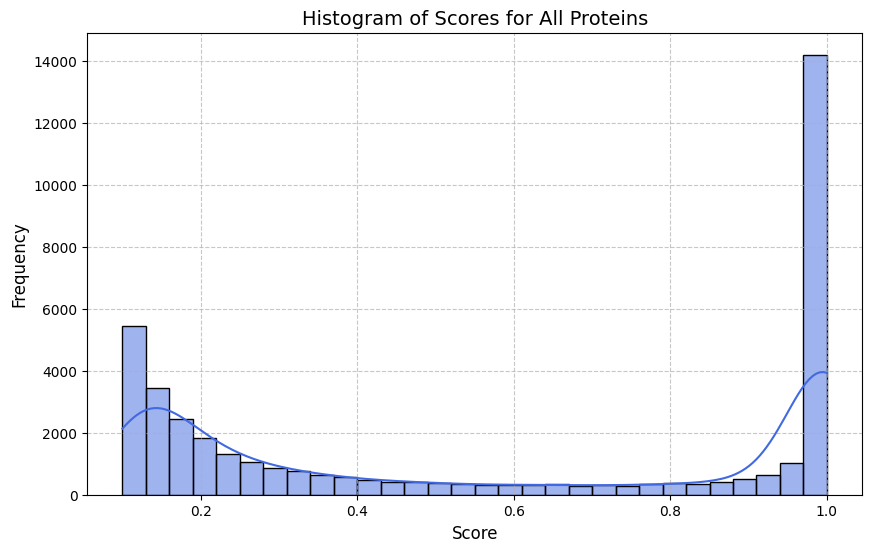

Number of Proteins Not Annotated: 0


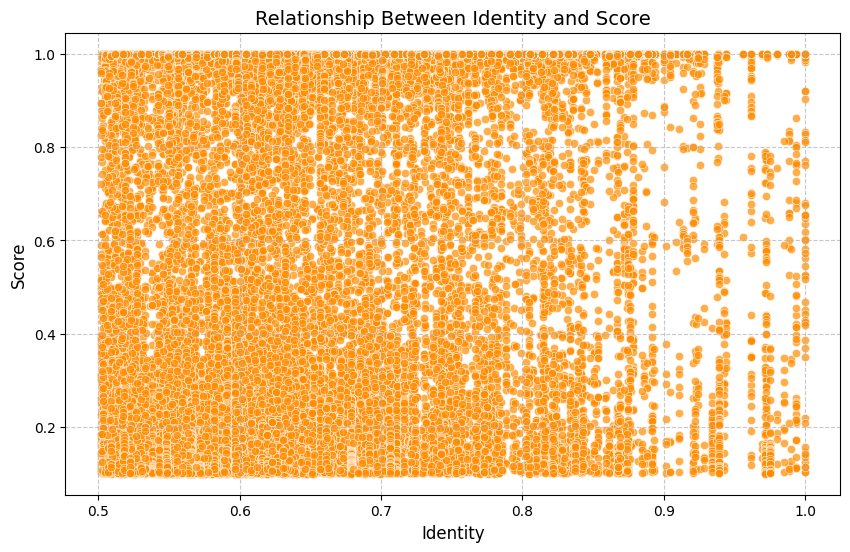


Summary of Proteins per GO Category:
                  Category  Number of Proteins
0  Molecular Function (MF)                 927
1  Biological Process (BP)                 958
2  Cellular Component (CC)                 531


In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
#file_path = "path_to_your_file/results.tsv"  # Change this to your actual file path
#df = pd.read_csv(file_path, sep="\t")

### 1️⃣ Number of Proteins Successfully Annotated
num_annotated_proteins = df["Protein"].nunique()
print(f"Number of Proteins Successfully Annotated: {num_annotated_proteins}")

### 2️⃣ Number of Proteins Per GO Term
proteins_per_go = df.groupby("GO_term/EC_number")["Protein"].nunique()
print("Number of Proteins per GO Term:")
print(proteins_per_go)

### 3️⃣ Histogram of Scores for All Proteins
plt.figure(figsize=(10, 6))
sns.histplot(df["Score"], bins=30, kde=True, color="royalblue")
plt.title("Histogram of Scores for All Proteins", fontsize=14)
plt.xlabel("Score", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

### 4️⃣ Number of Proteins Not Annotated
# Assumption: If a protein has no GO term, it is unannotated
annotated_proteins = df["Protein"].unique()
all_proteins = df["Protein"].unique()  # Modify if you have a reference list of all proteins
num_not_annotated = len(set(all_proteins) - set(annotated_proteins))
print(f"Number of Proteins Not Annotated: {num_not_annotated}")

### 5️⃣ Relationship Between Identity and Score
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df["Identity"], y=df["Score"], color="darkorange", alpha=0.7)
plt.title("Relationship Between Identity and Score", fontsize=14)
plt.xlabel("Identity", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

### 6️⃣ Summary of Proteins per Molecular Function (MF), Biological Process (BP), and Cellular Component (CC)
mf_count = df[df["DeepFRI_mode"] == "mf"]["Protein"].nunique()
bp_count = df[df["DeepFRI_mode"] == "bp"]["Protein"].nunique()
cc_count = df[df["DeepFRI_mode"] == "cc"]["Protein"].nunique()

# Create summary DataFrame
summary_df = pd.DataFrame({
    "Category": ["Molecular Function (MF)", "Biological Process (BP)", "Cellular Component (CC)"],
    "Number of Proteins": [mf_count, bp_count, cc_count]
})

# Display the summary table
print("\nSummary of Proteins per GO Category:")
print(summary_df)


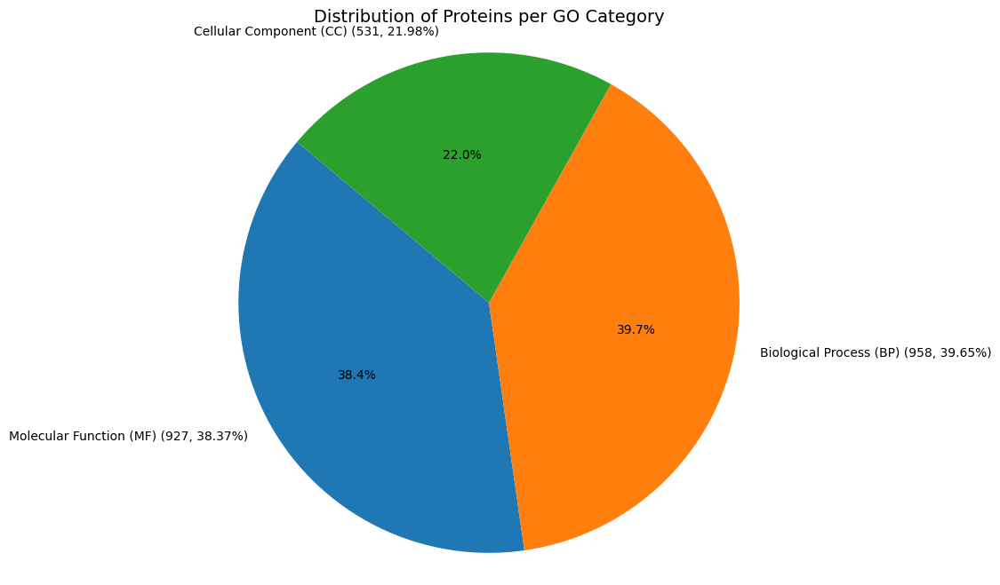

In [9]:
import matplotlib.pyplot as plt

# Data for the pie chart
labels = summary_df["Category"]
sizes = summary_df["Number of Proteins"]
total = sizes.sum()
percentages = (sizes / total) * 100

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=[f'{label} ({size}, {percentage:.2f}%)' for label, size, percentage in zip(labels, sizes, percentages)], autopct='%1.1f%%', startangle=140)
plt.title("Distribution of Proteins per GO Category", fontsize=14)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()

In [10]:
#%pip install biopython

In [11]:
#%pip install statsmodels

Total Proteins: 5725
Annotated Proteins: 980
Proteins Not Annotated: 4745

Number of Proteins per GO Term:
GO_term/EC_number
1.1.1.-       40
1.1.1.1        1
1.1.1.100      3
1.1.1.23       1
1.1.1.25       1
              ..
GO:2000113    10
GO:2000142     4
GO:2000145     3
GO:2001057     1
GO:2001141    47
Name: Protein, Length: 2569, dtype: int64


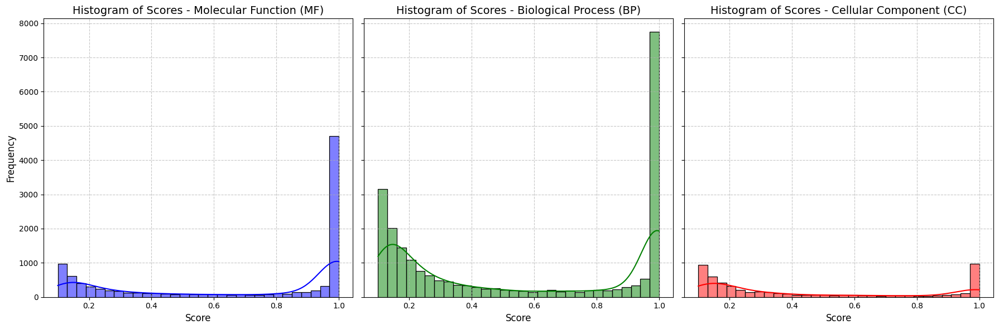

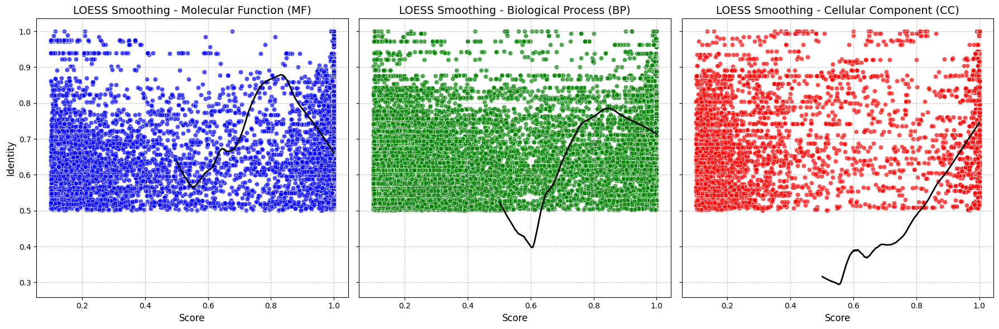


Summary of Proteins per GO Category:
                  Category  Number of Proteins
0  Molecular Function (MF)                 927
1  Biological Process (BP)                 958
2  Cellular Component (CC)                 531

GO Annotation Distribution:
     GO Annotation Count  Number of Proteins
0           1 Annotation                   0
1          2 Annotations                   2
2  3 or More Annotations                 978


In [12]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import statsmodels.api as sm

# File paths (Replace with your actual paths if different)
#annotated_file = "results.tsv"  
original_protein_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_PCC_2025_02_12.fasta"

# Load the annotated dataset
#df = pd.read_csv(annotated_file, sep="\t")

# Extract protein IDs from the original FASTA file
original_proteins = set(record.id for record in SeqIO.parse(original_protein_file, "fasta"))

# 1️⃣ Number of Total Proteins vs Annotated Proteins
num_total_proteins = len(original_proteins)  # Total proteins in the original dataset
num_annotated_proteins = df["Protein"].nunique()  # Proteins with at least one annotation
num_not_annotated = num_total_proteins - num_annotated_proteins  # Proteins without annotation

print(f"Total Proteins: {num_total_proteins}")
print(f"Annotated Proteins: {num_annotated_proteins}")
print(f"Proteins Not Annotated: {num_not_annotated}")

# 2️⃣ Number of Proteins Per GO Term
proteins_per_go = df.groupby("GO_term/EC_number")["Protein"].nunique()
print("\nNumber of Proteins per GO Term:")
print(proteins_per_go)


.0

# 5️⃣ Summary of Proteins per Molecular Function (MF), Biological Process (BP), and Cellular Component (CC)
mf_count = df[df["DeepFRI_mode"] == "mf"]["Protein"].nunique()
bp_count = df[df["DeepFRI_mode"] == "bp"]["Protein"].nunique()
cc_count = df[df["DeepFRI_mode"] == "cc"]["Protein"].nunique()

# Create a summary DataFrame
summary_df = pd.DataFrame({
    "Category": ["Molecular Function (MF)", "Biological Process (BP)", "Cellular Component (CC)"],
    "Number of Proteins": [mf_count, bp_count, cc_count]
})

# 6️⃣ Count of Proteins with 1, 2, or 3+ GO Annotations
go_annotations_per_protein = df.groupby("Protein")["GO_term/EC_number"].nunique()
one_go = (go_annotations_per_protein == 1).sum()
two_go = (go_annotations_per_protein == 2).sum()
three_or_more_go = (go_annotations_per_protein >= 3).sum()

# Create a DataFrame for the count of proteins per annotation category
go_summary_df = pd.DataFrame({
    "GO Annotation Count": ["1 Annotation", "2 Annotations", "3 or More Annotations"],
    "Number of Proteins": [one_go, two_go, three_or_more_go]
})



# 4️⃣ Histograms of Scores Per Molecular Function, Biological Process, and Cellular Component
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

categories = ["mf", "bp", "cc"]
titles = ["Molecular Function (MF)", "Biological Process (BP)", "Cellular Component (CC)"]
colors = ["blue", "green", "red"]

for i, category in enumerate(categories):
    subset = df[df["DeepFRI_mode"] == category]
    sns.histplot(subset["Score"], bins=30, kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(f"Histogram of Scores - {titles[i]}", fontsize=14)
    axes[i].set_xlabel("Score", fontsize=12)
    axes[i].set_ylabel("Frequency", fontsize=12)
    axes[i].grid(True, linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

# 5️⃣ Scatter Plots with LOESS Smoothing Per Molecular Function, Biological Process, and Cellular Component
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, category in enumerate(categories):
    subset = df[df["DeepFRI_mode"] == category]

    # Scatter plot
    sns.scatterplot(x=subset["Score"], y=subset["Identity"], color=colors[i], alpha=0.7, ax=axes[i])

    # Perform LOESS smoothing
    lowess = sm.nonparametric.lowess(subset["Score"], subset["Identity"], frac=0.3)
    axes[i].plot(lowess[:, 0], lowess[:, 1], color="black", linewidth=2)

    axes[i].set_title(f"LOESS Smoothing - {titles[i]}", fontsize=14)
    axes[i].set_xlabel("Score", fontsize=12)
    axes[i].set_ylabel("Identity", fontsize=12)
    axes[i].grid(True, linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()





# Display the summary tables
print("\nSummary of Proteins per GO Category:")
print(summary_df)

print("\nGO Annotation Distribution:")
print(go_summary_df)

In [13]:
import

SyntaxError: invalid syntax (2125240012.py, line 1)

In [ ]:
### 6️⃣ Summary of Proteins per Molecular Function (MF), Biological Process (BP), and Cellular Component (CC)
mf_count = metadata_df[df["DeepFRI_mode"] == "mf"]["Protein"].nunique()
bp_count = metadata_df[df["DeepFRI_mode"] == "bp"]["Protein"].nunique()
cc_count = metadata_df[df["DeepFRI_mode"] == "cc"]["Protein"].nunique()

C:\Users\Gilles\AppData\Local\Temp\ipykernel_9348\538621798.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  mf_count = metadata_df[df["DeepFRI_mode"] == "mf"]["Protein"].nunique()


KeyError: 'Protein'

In [ ]:
metadata_df.head(5)

,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology (cellular component),Gene Ontology (molecular function),Gene Ontology IDs,EC number
0,A0A9P1KHL8,unreviewed,A0A9P1KHL8_9CYAN,Bifunctional protein GlmU [Includes: UDP-N-ace...,glmU ARTHRO_50153,Limnospira indica PCC 8005,455,cell morphogenesis [GO:0000902]; cell wall org...,carboxysome [GO:0031470]; cytoplasm [GO:000573...,carboxysome [GO:0031470]; cytoplasm [GO:000573...,glucosamine-1-phosphate N-acetyltransferase ac...,GO:0000287; GO:0000902; GO:0003977; GO:0005737...,2.3.1.157; 2.7.7.23
1,A0A9P1KAZ4,unreviewed,A0A9P1KAZ4_9CYAN,Photosystem II protein D1 (PSII D1 protein) (E...,psbA2 psbA ARTHRO_10312,Limnospira indica PCC 8005,359,photosynthetic electron transport in photosyst...,photosystem II [GO:0009523]; plasma membrane-d...,photosystem II [GO:0009523]; plasma membrane-d...,chlorophyll binding [GO:0016168]; electron tra...,GO:0005506; GO:0009523; GO:0009635; GO:0009772...,1.10.3.9
2,A0A9P1KCL1,unreviewed,A0A9P1KCL1_9CYAN,Coenzyme A biosynthesis bifunctional protein C...,coaBC ARTHRO_11326,Limnospira indica PCC 8005,418,coenzyme A biosynthetic process [GO:0015937]; ...,phosphopantothenoylcysteine decarboxylase comp...,phosphopantothenoylcysteine decarboxylase comp...,FMN binding [GO:0010181]; metal ion binding [G...,GO:0004632; GO:0004633; GO:0010181; GO:0015937...,4.1.1.36; 6.3.2.5
3,A0A9P1KF24,unreviewed,A0A9P1KF24_9CYAN,Bifunctional NAD(P)H-hydrate repair enzyme (Ni...,nnrD nnrE ARTHRO_30833,Limnospira indica PCC 8005,537,metabolite repair [GO:0110051]; nicotinamide n...,ADP-dependent NAD(P)H-hydrate dehydratase acti...,NaN,ADP-dependent NAD(P)H-hydrate dehydratase acti...,GO:0005524; GO:0016301; GO:0046496; GO:0046872...,4.2.1.136; 5.1.99.6
4,A0A9P1KGE3,unreviewed,A0A9P1KGE3_9CYAN,Bifunctional pantoate ligase/cytidylate kinase...,panC/cmk ARTHRO_40129,Limnospira indica PCC 8005,524,nucleobase-containing small molecule interconv...,cytosol [GO:0005829]; (d)CMP kinase activity [...,cytosol [GO:0005829],(d)CMP kinase activity [GO:0004127]; ATP bindi...,GO:0004127; GO:0004592; GO:0005524; GO:0005829...,2.7.4.25; 6.3.2.1


In [ ]:
metadata_df.to_csv("output_meta.csv", index=False)


In [ ]:
df.shape

(40398, 9)

In [ ]:
mode = "mf"

molecular_function = df.query(f"DeepFRI_mode =='{mode}'")
feature_table = pd.pivot_table(molecular_function, index="Protein", columns="GO_term/EC_number", values="Score").fillna(0)

labels = metadata_df.is_defluorinating
feature_table.index = feature_table.index.str.replace("seq_", "")
# convert to int
feature_table.index = feature_table.index.astype(int) - 1
feature_table = feature_table.sort_index()

In [ ]:
top_annotations = molecular_function.Annotation.value_counts().index[:10]
# show only top annotations
molecular_function.query(f"Annotation in @top_annotations")["GO_term/EC_number"].value_counts()

GO_term/EC_number
GO:0016788    15
GO:0016853    13
GO:0000287    11
GO:0042578    11
GO:0016765    10
GO:0016791     9
GO:0003677     7
GO:0016829     6
GO:0046914     6
GO:0140096     5
Name: count, dtype: int64

In [ ]:
original_proteins

{'tr|A0A9P1KB33|A0A9P1KB33_9CYAN',
 'tr|A0A9P1P187|A0A9P1P187_9CYAN',
 'tr|A0A9P1KDH1|A0A9P1KDH1_9CYAN',
 'tr|A0A9P1P1R7|A0A9P1P1R7_9CYAN',
 'tr|A0A9P1P143|A0A9P1P143_9CYAN',
 'tr|A0A9P1P146|A0A9P1P146_9CYAN',
 'tr|A0A9P1NXY9|A0A9P1NXY9_9CYAN',
 'tr|A0A9P1P0T7|A0A9P1P0T7_9CYAN',
 'tr|A0A9P1NYE1|A0A9P1NYE1_9CYAN',
 'tr|A0A9P1KJJ4|A0A9P1KJJ4_9CYAN',
 'tr|A0A9P1KC67|A0A9P1KC67_9CYAN',
 'tr|A0A9P1KBY1|A0A9P1KBY1_9CYAN',
 'tr|A0A9P1KC57|A0A9P1KC57_9CYAN',
 'tr|A0A9P1KEP0|A0A9P1KEP0_9CYAN',
 'tr|A0A9P1KCJ2|A0A9P1KCJ2_9CYAN',
 'tr|A0A9P1KES8|A0A9P1KES8_9CYAN',
 'tr|A0A9P1KCE0|A0A9P1KCE0_9CYAN',
 'tr|A0A9P1P024|A0A9P1P024_9CYAN',
 'tr|A0A9P1KBG9|A0A9P1KBG9_9CYAN',
 'tr|A0A9P1KAV2|A0A9P1KAV2_9CYAN',
 'tr|A0A9P1KK10|A0A9P1KK10_9CYAN',
 'tr|A0A9P1KAU2|A0A9P1KAU2_9CYAN',
 'tr|A0A9P1NWF2|A0A9P1NWF2_9CYAN',
 'tr|A0A9P1KKC0|A0A9P1KKC0_9CYAN',
 'tr|A0A9P1KK92|A0A9P1KK92_9CYAN',
 'tr|A0A9P1P1G3|A0A9P1P1G3_9CYAN',
 'tr|A0A9P1KFE8|A0A9P1KFE8_9CYAN',
 'tr|A0A9P1P0J7|A0A9P1P0J7_9CYAN',
 'tr|A0A9P1KKK4|A0A9

In [ ]:
%pip install ace_tools

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
from IPython.display import display
  # For displaying dataframes

# Load the dataset
#file_path = "/mnt/data/output_meta.csv"
df1 = metadata_df

# Total number of proteins in the dataset
total_proteins = df1["Entry"].nunique()

# Number of annotated proteins (having at least one GO annotation)
annotated_proteins = df1.dropna(subset=["Gene Ontology IDs"]).shape[0]

# Counting proteins per GO ID
go_counts = df1["Gene Ontology IDs"].dropna().str.split("; ").explode().value_counts()

# Counting proteins per molecular function
molecular_function_counts = df1["Gene Ontology (molecular function)"].dropna().str.split("; ").explode().value_counts()

# Counting proteins per cellular component
cellular_component_counts = df1["Gene Ontology (cellular component)"].dropna().str.split("; ").explode().value_counts()

# Counting proteins per biological process
biological_process_counts = df1["Gene Ontology (biological process)"].dropna().str.split("; ").explode().value_counts()

# Display results
print(f"Total number of proteins: {total_proteins}")
print(f"Number of annotated proteins: {annotated_proteins}")

# Convert results to DataFrames for better visualization
go_counts_df = go_counts.reset_index()
go_counts_df.columns = ["GO ID", "Protein Count"]
display(name="Proteins per GO ID", dataframe=go_counts_df)

molecular_function_counts_df = molecular_function_counts.reset_index()
molecular_function_counts_df.columns = ["Molecular Function", "Protein Count"]
display(name="Proteins per Molecular Function", dataframe=molecular_function_counts_df)

cellular_component_counts_df = cellular_component_counts.reset_index()
cellular_component_counts_df.columns = ["Cellular Component", "Protein Count"]
display(name="Proteins per Cellular Component", dataframe=cellular_component_counts_df)

biological_process_counts_df = biological_process_counts.reset_index()
biological_process_counts_df.columns = ["Biological Process", "Protein Count"]
display(name="Proteins per Biological Process", dataframe=biological_process_counts_df)

# Extracting proteins that were not annotated (missing GO annotations)
non_annotated_proteins_df1 = df1[df1["Gene Ontology IDs"].isna()][["Entry", "Entry Name", "Protein names", "Gene Names", "Organism"]]

# Display the non-annotated proteins
display(name="Non-Annotated Proteins", dataframe=non_annotated_proteins_df1)

# Extracting proteins that were successfully annotated
annotated_proteins_df1 = df1.dropna(subset=["Gene Ontology IDs"])[["Entry", "Entry Name", "Protein names", "Gene Names", "Organism", "Gene Ontology IDs"]]

# Display the annotated proteins
display(name="Annotated Proteins", dataframe=annotated_proteins_df1)




Total number of proteins: 5731
Number of annotated proteins: 3354


In [ ]:
import pandas as pd
from Bio import SeqIO
from IPython.display import display

# Load annotated proteins from the results.tsv file
annotated_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv", sep="\t")

# Extract the protein IDs from the annotated results file (assuming they are in a column named "Entry")
annotated_proteins = set(annotated_df["Protein"])

# Load all protein IDs from the fasta file
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_PCC_2025_02_12.fasta"
all_proteins = set()

for record in SeqIO.parse(fasta_file, "fasta"):
    protein_id = record.id.split("|")[1] if "|" in record.id else record.id  # Handling different formats
    all_proteins.add(protein_id)

# Identify non-annotated proteins
non_annotated_proteins = all_proteins - annotated_proteins

# Convert to DataFrame for display
non_annotated_proteins_df = pd.DataFrame(non_annotated_proteins, columns=["Unannotated Protein ID"])

# Display the results
display(name="Non-Annotated Proteins", dataframe=non_annotated_proteins_df)


In [ ]:
non_annotated_proteins_df1.shape

(2377, 5)

In [ ]:
non_annotated_proteins_df1["Entry"]

1040    A0A9P1K9Y1
1041    A0A9P1K9Y3
1042    A0A9P1KA00
1043    A0A9P1KA01
1045    A0A9P1KA11
           ...    
5710    A0A9P1P331
5711    A0A9P1P332
5712    A0A9P1P334
5715    A0A9P1P347
5716    A0A9P1P349
Name: Entry, Length: 2377, dtype: object

In [ ]:
annotated_proteins = set(annotated_df["Protein"])
annotated_proteins

{'A0A9P1KA29',
 'A0A9P1KA40',
 'A0A9P1KA52',
 'A0A9P1KA74',
 'A0A9P1KA83',
 'A0A9P1KAG7',
 'A0A9P1KAM0',
 'A0A9P1KAM7',
 'A0A9P1KAN1',
 'A0A9P1KAP2',
 'A0A9P1KAP9',
 'A0A9P1KAQ6',
 'A0A9P1KAS6',
 'A0A9P1KAT9',
 'A0A9P1KAU3',
 'A0A9P1KAV6',
 'A0A9P1KAV9',
 'A0A9P1KAW2',
 'A0A9P1KAX0',
 'A0A9P1KAX4',
 'A0A9P1KAX7',
 'A0A9P1KAY0',
 'A0A9P1KAY1',
 'A0A9P1KAY7',
 'A0A9P1KAZ1',
 'A0A9P1KAZ4',
 'A0A9P1KAZ7',
 'A0A9P1KAZ9',
 'A0A9P1KB03',
 'A0A9P1KB08',
 'A0A9P1KB27',
 'A0A9P1KB33',
 'A0A9P1KB34',
 'A0A9P1KB35',
 'A0A9P1KB38',
 'A0A9P1KB41',
 'A0A9P1KB57',
 'A0A9P1KB68',
 'A0A9P1KB74',
 'A0A9P1KB90',
 'A0A9P1KBA7',
 'A0A9P1KBB0',
 'A0A9P1KBC4',
 'A0A9P1KBE4',
 'A0A9P1KBF8',
 'A0A9P1KBG6',
 'A0A9P1KBG9',
 'A0A9P1KBH3',
 'A0A9P1KBH5',
 'A0A9P1KBH7',
 'A0A9P1KBI1',
 'A0A9P1KBJ1',
 'A0A9P1KBK1',
 'A0A9P1KBK6',
 'A0A9P1KBK9',
 'A0A9P1KBL2',
 'A0A9P1KBL7',
 'A0A9P1KBL8',
 'A0A9P1KBM3',
 'A0A9P1KBM6',
 'A0A9P1KBM8',
 'A0A9P1KBN1',
 'A0A9P1KBP5',
 'A0A9P1KBP6',
 'A0A9P1KBP9',
 'A0A9P1KBQ3',
 'A0A9P1KB

In [ ]:
non_annotated_proteins_list = set(non_annotated_proteins_df1["Entry"])

In [ ]:
non_annotated_proteins_list

{'A0A9P1P1M4',
 'A0A9P1KKY8',
 'A0A9P1P0Y9',
 'A0A9P1KL92',
 'A0A9P1NZP6',
 'A0A9P1KLC9',
 'A0A9P1KHE9',
 'A0A9P1KDH6',
 'A0A9P1NX55',
 'A0A9P1KCZ7',
 'A0A9P1KGR7',
 'A0A9P1KAD7',
 'A0A9P1KM18',
 'A0A9P1KGR8',
 'A0A9P1KDK4',
 'A0A9P1K9Y3',
 'A0A9P1KB44',
 'A0A9P1KLX0',
 'A0A9P1P0H9',
 'A0A9P1KLT4',
 'A0A9P1KK56',
 'A0A9P1KD24',
 'A0A9P1P0U0',
 'A0A9P1KE73',
 'A0A9P1KM91',
 'A0A9P1KG18',
 'A0A9P1KHB9',
 'A0A9P1NWD6',
 'A0A9P1P0B1',
 'A0A9P1KD40',
 'A0A9P1KJJ6',
 'A0A9P1P0M5',
 'A0A9P1P066',
 'A0A9P1P301',
 'A0A9P1KF09',
 'A0A9P1KEV5',
 'A0A9P1KLI4',
 'A0A9P1KJG4',
 'A0A9P1KLC2',
 'A0A9P1KF46',
 'A0A9P1P1T8',
 'A0A9P1P0N6',
 'A0A9P1P0F8',
 'A0A9P1KLL6',
 'A0A9P1KDQ6',
 'A0A9P1KCH3',
 'A0A9P1KJU1',
 'A0A9P1NZZ8',
 'A0A9P1NXB8',
 'A0A9P1KCK4',
 'A0A9P1KGA2',
 'A0A9P1KL56',
 'A0A9P1KAQ4',
 'A0A9P1KDK3',
 'A0A9P1KJ43',
 'A0A9P1KBU9',
 'A0A9P1KCP8',
 'A0A9P1KHG9',
 'A0A9P1KD41',
 'A0A9P1KHY8',
 'A0A9P1KEX9',
 'A0A9P1KCR0',
 'A0A9P1KGE5',
 'A0A9P1KFT0',
 'A0A9P1P1B0',
 'A0A9P1KE55',
 'A0A9P1NY

In [ ]:
non_annotated_proteins_list=set(non_annotated_proteins_df1["Entry"])

{'A0A9P1P1M4',
 'A0A9P1KKY8',
 'A0A9P1P0Y9',
 'A0A9P1KL92',
 'A0A9P1NZP6',
 'A0A9P1KLC9',
 'A0A9P1KHE9',
 'A0A9P1KDH6',
 'A0A9P1NX55',
 'A0A9P1KCZ7',
 'A0A9P1KGR7',
 'A0A9P1KAD7',
 'A0A9P1KM18',
 'A0A9P1KGR8',
 'A0A9P1KDK4',
 'A0A9P1K9Y3',
 'A0A9P1KB44',
 'A0A9P1KLX0',
 'A0A9P1P0H9',
 'A0A9P1KLT4',
 'A0A9P1KK56',
 'A0A9P1KD24',
 'A0A9P1P0U0',
 'A0A9P1KE73',
 'A0A9P1KM91',
 'A0A9P1KG18',
 'A0A9P1KHB9',
 'A0A9P1NWD6',
 'A0A9P1P0B1',
 'A0A9P1KD40',
 'A0A9P1KJJ6',
 'A0A9P1P0M5',
 'A0A9P1P066',
 'A0A9P1P301',
 'A0A9P1KF09',
 'A0A9P1KEV5',
 'A0A9P1KLI4',
 'A0A9P1KJG4',
 'A0A9P1KLC2',
 'A0A9P1KF46',
 'A0A9P1P1T8',
 'A0A9P1P0N6',
 'A0A9P1P0F8',
 'A0A9P1KLL6',
 'A0A9P1KDQ6',
 'A0A9P1KCH3',
 'A0A9P1KJU1',
 'A0A9P1NZZ8',
 'A0A9P1NXB8',
 'A0A9P1KCK4',
 'A0A9P1KGA2',
 'A0A9P1KL56',
 'A0A9P1KAQ4',
 'A0A9P1KDK3',
 'A0A9P1KJ43',
 'A0A9P1KBU9',
 'A0A9P1KCP8',
 'A0A9P1KHG9',
 'A0A9P1KD41',
 'A0A9P1KHY8',
 'A0A9P1KEX9',
 'A0A9P1KCR0',
 'A0A9P1KGE5',
 'A0A9P1KFT0',
 'A0A9P1P1B0',
 'A0A9P1KE55',
 'A0A9P1NY

In [ ]:
common_proteins = non_annotated_proteins_list & annotated_proteins
common_proteins

{'A0A9P1KAT9',
 'A0A9P1KBL8',
 'A0A9P1KBM3',
 'A0A9P1KBQ3',
 'A0A9P1KCL2',
 'A0A9P1KCP2',
 'A0A9P1KD56',
 'A0A9P1KDK4',
 'A0A9P1KDT4',
 'A0A9P1KE56',
 'A0A9P1KED5',
 'A0A9P1KEE7',
 'A0A9P1KEH6',
 'A0A9P1KEX3',
 'A0A9P1KF03',
 'A0A9P1KFD9',
 'A0A9P1KFW5',
 'A0A9P1KGC8',
 'A0A9P1KH01',
 'A0A9P1KHE4',
 'A0A9P1KHG9',
 'A0A9P1KI70',
 'A0A9P1KIB4',
 'A0A9P1KIS4',
 'A0A9P1KJ74',
 'A0A9P1KJR7',
 'A0A9P1KKH1',
 'A0A9P1KKN7',
 'A0A9P1KL47',
 'A0A9P1KL55',
 'A0A9P1KL74',
 'A0A9P1KLL2',
 'A0A9P1NW64',
 'A0A9P1NXB1',
 'A0A9P1NXI5',
 'A0A9P1NY96',
 'A0A9P1NYI7',
 'A0A9P1NYZ3',
 'A0A9P1NZR7',
 'A0A9P1NZU8',
 'A0A9P1NZZ8',
 'A0A9P1P0A0',
 'A0A9P1P0A6',
 'A0A9P1P1M1',
 'A0A9P1P211',
 'A0A9P1P2Q7'}

In [ ]:
len(common_proteins)

46

In [ ]:
# Filter the dataframe to include only the common proteins
annotated_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv", sep="\t")
common_proteins_df = annotated_df[annotated_df["Protein"].isin(common_proteins)]

# Select the relevant columns
common_proteins_info = common_proteins_df[["Protein", "Score", "Identity", "GO_term/EC_number"]]

# Display the dataframe
common_proteins_info.head()

,Protein,Score,Identity,GO_term/EC_number
291,A0A9P1KBL8,0.413649,0.606796,GO:0006259
292,A0A9P1KBL8,0.294602,0.606796,GO:0051716
293,A0A9P1KBL8,0.284148,0.606796,GO:0033554
294,A0A9P1KBL8,0.284125,0.606796,GO:0016043
295,A0A9P1KBL8,0.280152,0.606796,GO:0006281


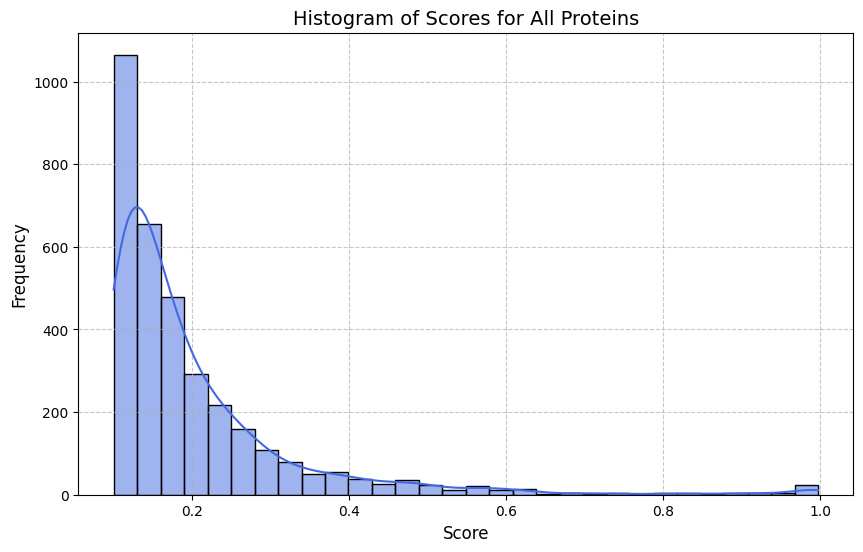

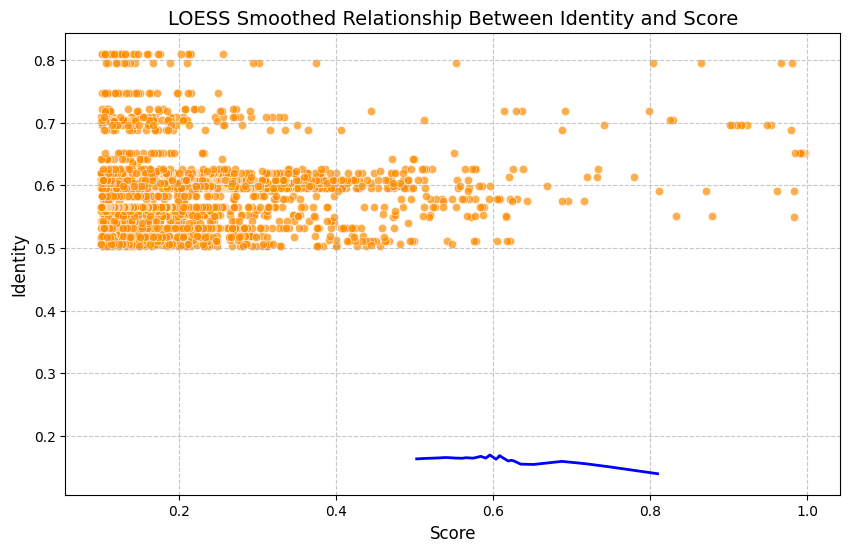

In [ ]:
# 3️⃣ Histogram of Scores for All Proteins
plt.figure(figsize=(10, 6))
sns.histplot(common_proteins_info["Score"], bins=30, kde=True, color="royalblue")
plt.title("Histogram of Scores for All Proteins", fontsize=14)
plt.xlabel("Score", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

# 4️⃣ Relationship Between Identity and Score (Scatter Plot)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=common_proteins_info["Score"], y=common_proteins_info["Identity"], color="darkorange", alpha=0.7)
lowess = sm.nonparametric.lowess(common_proteins_info["Score"], common_proteins_info["Identity"], frac=0.3)  # 'frac' controls the smoothing level
plt.plot(lowess[:, 0], lowess[:, 1], color="blue", linewidth=2, label="LOESS Smoothed Curve")

# Customize plot
plt.title("LOESS Smoothed Relationship Between Identity and Score", fontsize=14)
plt.xlabel("Score", fontsize=12)
plt.ylabel("Identity", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

C:\Users\Gilles\AppData\Local\Temp\ipykernel_9348\1099386891.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(categories, rotation=45)


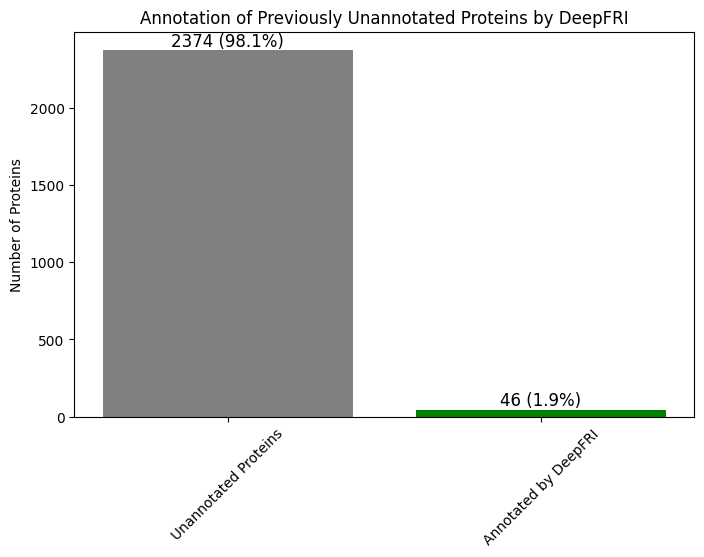

Figure saved as DeepFRI_annotation.png


In [ ]:
import matplotlib.pyplot as plt

# Data for visualization
categories = ["Unannotated Proteins", "Annotated by DeepFRI"]
counts = [2374, 46]

# Calculate percentages
total = sum(counts)
percentages = [(count / total) * 100 for count in counts]

# Create a bar chart
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(categories, counts, color=['gray', 'green'])

# Add labels for counts and percentages
for bar, count, percent in zip(bars, counts, percentages):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), 
             f'{count} ({percent:.1f}%)', ha='center', va='bottom', fontsize=12)

# Labels and title
ax.set_ylabel("Number of Proteins")
ax.set_title("Annotation of Previously Unannotated Proteins by DeepFRI")
ax.set_xticklabels(categories, rotation=45)

# Save figure to file
figure_path = "DeepFRI_annotation.png"
plt.savefig(figure_path, dpi=300, bbox_inches="tight")

# Show the figure
plt.show()

print(f"Figure saved as {figure_path}")


tunning to model to min of length of 60 and maximum length of 3200 amino acids

Number of Proteins Successfully Annotated: 980
Number of Proteins per GO Term:
GO_term/EC_number
1.1.1.-       40
1.1.1.1        1
1.1.1.100      3
1.1.1.23       1
1.1.1.25       1
              ..
GO:2000113    10
GO:2000142     4
GO:2000145     3
GO:2001057     1
GO:2001141    47
Name: Protein, Length: 2569, dtype: int64


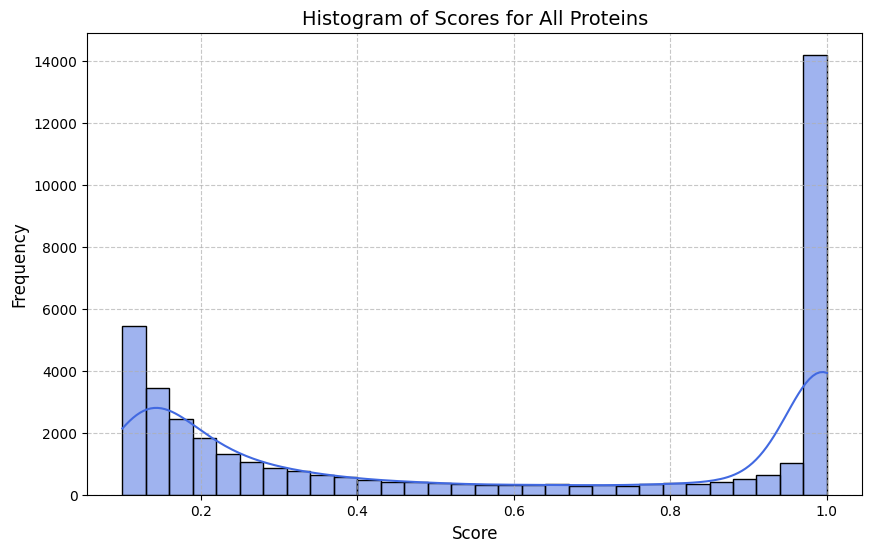

Number of Proteins Not Annotated: 0


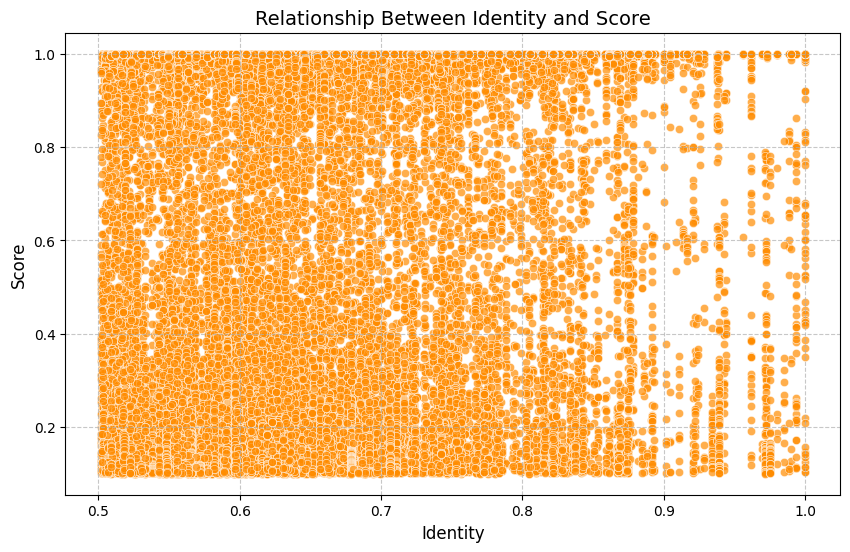


Summary of Proteins per GO Category:
                  Category  Number of Proteins
0  Molecular Function (MF)                 927
1  Biological Process (BP)                 958
2  Cellular Component (CC)                 531


In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "C:/Users/Gilles/Documents/Master_thesis/output_limnospira_60_3200_length/results.tsv"  # Change this to your actual file path
df1 = pd.read_csv(file_path, sep="\t")

### 1️⃣ Number of Proteins Successfully Annotated
num_annotated_proteins = df1["Protein"].nunique()
print(f"Number of Proteins Successfully Annotated: {num_annotated_proteins}")

### 2️⃣ Number of Proteins Per GO Term
proteins_per_go = df1.groupby("GO_term/EC_number")["Protein"].nunique()
print("Number of Proteins per GO Term:")
print(proteins_per_go)

### 3️⃣ Histogram of Scores for All Proteins
plt.figure(figsize=(10, 6))
sns.histplot(df1["Score"], bins=30, kde=True, color="royalblue")
plt.title("Histogram of Scores for All Proteins", fontsize=14)
plt.xlabel("Score", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

### 4️⃣ Number of Proteins Not Annotated
# Assumption: If a protein has no GO term, it is unannotated
annotated_proteins = df1["Protein"].unique()
all_proteins = df1["Protein"].unique()  # Modify if you have a reference list of all proteins
num_not_annotated = len(set(all_proteins) - set(annotated_proteins))
print(f"Number of Proteins Not Annotated: {num_not_annotated}")

### 5️⃣ Relationship Between Identity and Score
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df1["Identity"], y=df1["Score"], color="darkorange", alpha=0.7)
plt.title("Relationship Between Identity and Score", fontsize=14)
plt.xlabel("Identity", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

### 6️⃣ Summary of Proteins per Molecular Function (MF), Biological Process (BP), and Cellular Component (CC)
mf_count = df1[df1["DeepFRI_mode"] == "mf"]["Protein"].nunique()
bp_count = df1[df1["DeepFRI_mode"] == "bp"]["Protein"].nunique()
cc_count = df1[df1["DeepFRI_mode"] == "cc"]["Protein"].nunique()

# Create summary DataFrame
summary_df1 = pd.DataFrame({
    "Category": ["Molecular Function (MF)", "Biological Process (BP)", "Cellular Component (CC)"],
    "Number of Proteins": [mf_count, bp_count, cc_count]
})

# Display the summary table
print("\nSummary of Proteins per GO Category:")
print(summary_df1)


In [25]:
len(df1["Protein"].unique())

980

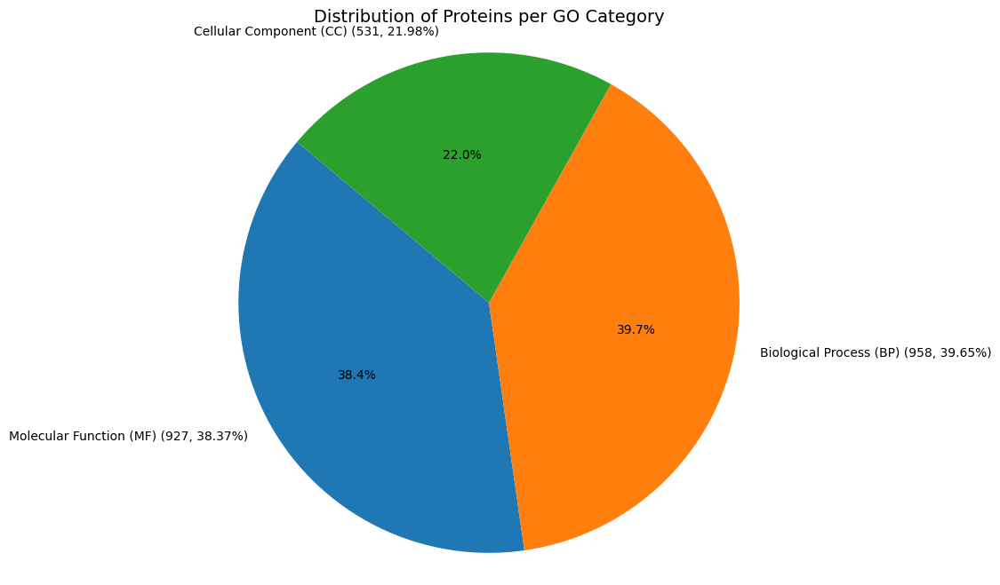

In [17]:
import matplotlib.pyplot as plt

# Data for the pie chart
labels = summary_df["Category"]
sizes = summary_df["Number of Proteins"]
total = sizes.sum()
percentages = (sizes / total) * 100

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=[f'{label} ({size}, {percentage:.2f}%)' for label, size, percentage in zip(labels, sizes, percentages)], autopct='%1.1f%%', startangle=140)
plt.title("Distribution of Proteins per GO Category", fontsize=14)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()

Total Proteins: 5725
Annotated Proteins: 980
Proteins Not Annotated: 4745

Number of Proteins per GO Term:
GO_term/EC_number
1.1.1.-       40
1.1.1.1        1
1.1.1.100      3
1.1.1.23       1
1.1.1.25       1
              ..
GO:2000113    10
GO:2000142     4
GO:2000145     3
GO:2001057     1
GO:2001141    47
Name: Protein, Length: 2569, dtype: int64


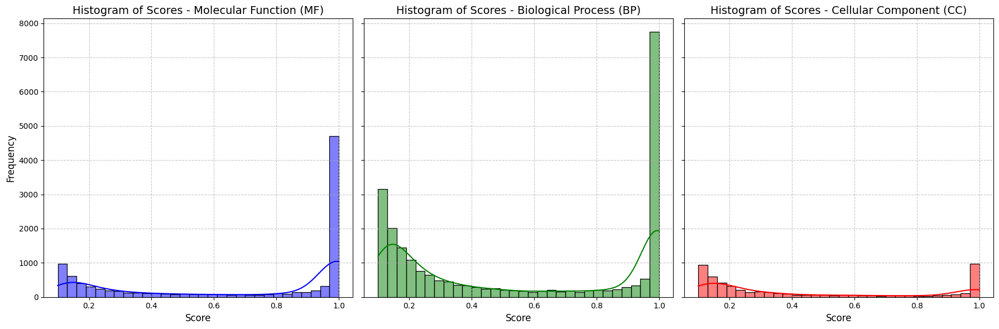

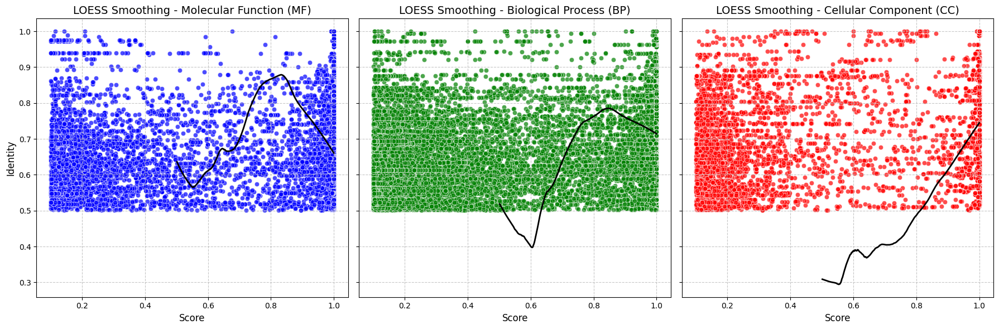


Summary of Proteins per GO Category:
                  Category  Number of Proteins
0  Molecular Function (MF)                 927
1  Biological Process (BP)                 958
2  Cellular Component (CC)                 531

GO Annotation Distribution:
     GO Annotation Count  Number of Proteins
0           1 Annotation                   0
1          2 Annotations                   2
2  3 or More Annotations                 978


In [18]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import statsmodels.api as sm

# File paths (Replace with your actual paths if different)
#annotated_file = "results.tsv"  
original_protein_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_PCC_2025_02_12.fasta"

# Load the annotated dataset
#df = pd.read_csv(annotated_file, sep="\t")

# Extract protein IDs from the original FASTA file
original_proteins = set(record.id for record in SeqIO.parse(original_protein_file, "fasta"))

# 1️⃣ Number of Total Proteins vs Annotated Proteins
num_total_proteins = len(original_proteins)  # Total proteins in the original dataset
num_annotated_proteins = df["Protein"].nunique()  # Proteins with at least one annotation
num_not_annotated = num_total_proteins - num_annotated_proteins  # Proteins without annotation

print(f"Total Proteins: {num_total_proteins}")
print(f"Annotated Proteins: {num_annotated_proteins}")
print(f"Proteins Not Annotated: {num_not_annotated}")

# 2️⃣ Number of Proteins Per GO Term
proteins_per_go = df.groupby("GO_term/EC_number")["Protein"].nunique()
print("\nNumber of Proteins per GO Term:")
print(proteins_per_go)


.0

# 5️⃣ Summary of Proteins per Molecular Function (MF), Biological Process (BP), and Cellular Component (CC)
mf_count = df[df["DeepFRI_mode"] == "mf"]["Protein"].nunique()
bp_count = df[df["DeepFRI_mode"] == "bp"]["Protein"].nunique()
cc_count = df[df["DeepFRI_mode"] == "cc"]["Protein"].nunique()

# Create a summary DataFrame
summary_df = pd.DataFrame({
    "Category": ["Molecular Function (MF)", "Biological Process (BP)", "Cellular Component (CC)"],
    "Number of Proteins": [mf_count, bp_count, cc_count]
})

# 6️⃣ Count of Proteins with 1, 2, or 3+ GO Annotations
go_annotations_per_protein = df.groupby("Protein")["GO_term/EC_number"].nunique()
one_go = (go_annotations_per_protein == 1).sum()
two_go = (go_annotations_per_protein == 2).sum()
three_or_more_go = (go_annotations_per_protein >= 3).sum()

# Create a DataFrame for the count of proteins per annotation category
go_summary_df = pd.DataFrame({
    "GO Annotation Count": ["1 Annotation", "2 Annotations", "3 or More Annotations"],
    "Number of Proteins": [one_go, two_go, three_or_more_go]
})



# 4️⃣ Histograms of Scores Per Molecular Function, Biological Process, and Cellular Component
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

categories = ["mf", "bp", "cc"]
titles = ["Molecular Function (MF)", "Biological Process (BP)", "Cellular Component (CC)"]
colors = ["blue", "green", "red"]

for i, category in enumerate(categories):
    subset = df[df["DeepFRI_mode"] == category]
    sns.histplot(subset["Score"], bins=30, kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(f"Histogram of Scores - {titles[i]}", fontsize=14)
    axes[i].set_xlabel("Score", fontsize=12)
    axes[i].set_ylabel("Frequency", fontsize=12)
    axes[i].grid(True, linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()

# 5️⃣ Scatter Plots with LOESS Smoothing Per Molecular Function, Biological Process, and Cellular Component
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, category in enumerate(categories):
    subset = df[df["DeepFRI_mode"] == category]

    # Scatter plot
    sns.scatterplot(x=subset["Score"], y=subset["Identity"], color=colors[i], alpha=0.7, ax=axes[i])

    # Perform LOESS smoothing
    lowess = sm.nonparametric.lowess(subset["Score"], subset["Identity"], frac=0.3)
    axes[i].plot(lowess[:, 0], lowess[:, 1], color="black", linewidth=2)

    axes[i].set_title(f"LOESS Smoothing - {titles[i]}", fontsize=14)
    axes[i].set_xlabel("Score", fontsize=12)
    axes[i].set_ylabel("Identity", fontsize=12)
    axes[i].grid(True, linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()





# Display the summary tables
print("\nSummary of Proteins per GO Category:")
print(summary_df)

print("\nGO Annotation Distribution:")
print(go_summary_df)

In [ ]:
import pandas as pd
from Bio import SeqIO
from IPython.display import display

# Load annotated proteins from the results.tsv file
annotated_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv", sep="\t")

# Extract the protein IDs from the annotated results file (assuming they are in a column named "Entry")
annotated_proteins = set(annotated_df["Protein"])

# Load all protein IDs from the fasta file
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_PCC_2025_02_12.fasta"
all_proteins = set()

for record in SeqIO.parse(fasta_file, "fasta"):
    protein_id = record.id.split("|")[1] if "|" in record.id else record.id  # Handling different formats
    all_proteins.add(protein_id)

# Identify non-annotated proteins
non_annotated_proteins = all_proteins - annotated_proteins

# Convert to DataFrame for display
non_annotated_proteins_df = pd.DataFrame(non_annotated_proteins, columns=["Unannotated Protein ID"])

# Display the results
display(name="Non-Annotated Proteins", dataframe=non_annotated_proteins_df)


In [ ]:
annotated_proteins = set(annotated_df["Protein"])
annotated_proteins

In [ ]:
non_annotated_proteins_list=set(non_annotated_proteins_df1["Entry"])

In [ ]:
common_proteins = non_annotated_proteins_list & annotated_proteins
common_proteins

In [ ]:
# Filter the dataframe to include only the common proteins
annotated_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv", sep="\t")
common_proteins_df = annotated_df[annotated_df["Protein"].isin(common_proteins)]

# Select the relevant columns
common_proteins_info = common_proteins_df[["Protein", "Score", "Identity", "GO_term/EC_number"]]

# Display the dataframe
common_proteins_info.head()

In [ ]:
# 3️⃣ Histogram of Scores for All Proteins
plt.figure(figsize=(10, 6))
sns.histplot(common_proteins_info["Score"], bins=30, kde=True, color="royalblue")
plt.title("Histogram of Scores for All Proteins", fontsize=14)
plt.xlabel("Score", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

# 4️⃣ Relationship Between Identity and Score (Scatter Plot)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=common_proteins_info["Score"], y=common_proteins_info["Identity"], color="darkorange", alpha=0.7)
lowess = sm.nonparametric.lowess(common_proteins_info["Score"], common_proteins_info["Identity"], frac=0.3)  # 'frac' controls the smoothing level
plt.plot(lowess[:, 0], lowess[:, 1], color="blue", linewidth=2, label="LOESS Smoothed Curve")

# Customize plot
plt.title("LOESS Smoothed Relationship Between Identity and Score", fontsize=14)
plt.xlabel("Score", fontsize=12)
plt.ylabel("Identity", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Data for visualization
categories = ["Unannotated Proteins", "Annotated by DeepFRI"]
counts = [2374, 46]

# Calculate percentages
total = sum(counts)
percentages = [(count / total) * 100 for count in counts]

# Create a bar chart
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(categories, counts, color=['gray', 'green'])

# Add labels for counts and percentages
for bar, count, percent in zip(bars, counts, percentages):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), 
             f'{count} ({percent:.1f}%)', ha='center', va='bottom', fontsize=12)

# Labels and title
ax.set_ylabel("Number of Proteins")
ax.set_title("Annotation of Previously Unannotated Proteins by DeepFRI")
ax.set_xticklabels(categories, rotation=45)

# Save figure to file
figure_path = "DeepFRI_annotation.png"
plt.savefig(figure_path, dpi=300, bbox_inches="tight")

# Show the figure
plt.show()

print(f"Figure saved as {figure_path}")


In [ ]:
fasta_file="/mnt/c/Users/Gilles/Documents/Master_thesis/cleanedlim.fasta"

In [ ]:

import pandas as pd
from Bio import SeqIO
import os

# Load all protein IDs from the fasta file
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/cleaned_ARTHRO_5_Proteins_12Feb25.fasta"
all_proteins = list(SeqIO.parse(fasta_file, "fasta"))

# Split the dataset into smaller chunks
chunk_size = 1000  # Adjust this to control memory usage
output_dir = "C:/Users/Gilles/Documents/Master_thesis/split_fasta_files_arthrospira"
os.makedirs(output_dir, exist_ok=True)


for i in range(0, len(all_proteins), chunk_size):
    subset = all_proteins[i:i + chunk_size]
    output_file = os.path.join(output_dir, f"subset_{i//chunk_size + 1}.fasta")
    SeqIO.write(subset, output_file, "fasta")

In [ ]:
annotated_proteins_set = set(annotated_proteins_df1["Entry"])
common_proteins = annotated_proteins_set & 
common_proteins

set()

In [ ]:
# Load all protein IDs from the fasta file
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/split_fasta_files_arthrospira/subset_1.fasta"
all_proteins = list(SeqIO.parse(fasta_file, "fasta"))

# Find the shortest sequence length
shortest_sequence_length = min(len(record.seq) for record in all_proteins)
print(f"Shortest sequence length: {shortest_sequence_length}")

Shortest sequence length: 17


In [ ]:
import pandas as pd
from Bio import SeqIO
from IPython.display import display
# Load all protein IDs from the fasta file
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/split_fasta_files_arthrospira/subset_7.fasta"
all_proteins = list(SeqIO.parse(fasta_file, "fasta"))

# Find the shortest sequence length
shortest_sequence_length = min(len(record.seq) for record in all_proteins)
print(f"Shortest sequence length: {shortest_sequence_length}")

# Separate short sequences
threshold_length = 31  # Adjust as needed
short_sequences = [record for record in all_proteins if len(record.seq) < threshold_length]
filtered_sequences = [record for record in all_proteins if len(record.seq) >= threshold_length]

# Save short sequences to a separate FASTA file
short_sequences_file = "C:/Users/Gilles/Documents/Master_thesis/short_seq_annopro_arthrospira/ARTHROV_short_subset_7.fasta"
SeqIO.write(short_sequences, short_sequences_file, "fasta")
print(f"Saved {len(short_sequences)} short sequences to {short_sequences_file}")

# Save filtered sequences back to the original FASTA file
filtered_fasta_file = "C:/Users/Gilles/Documents/Master_thesis/split_fasta_files_arthrospira/filtered_subset_7.fasta"
SeqIO.write(filtered_sequences, filtered_fasta_file, "fasta")
print(f"Saved {len(filtered_sequences)} filtered sequences to {filtered_fasta_file}")

Shortest sequence length: 25
Saved 2 short sequences to C:/Users/Gilles/Documents/Master_thesis/short_seq_annopro_arthrospira/ARTHROV_short_subset_7.fasta
Saved 343 filtered sequences to C:/Users/Gilles/Documents/Master_thesis/split_fasta_files_arthrospira/filtered_subset_7.fasta


In [ ]:
from Bio import SeqIO

fasta_file = "C:/Users/Gilles/Documents/Master_thesis/split_fasta_files/subset_5.fasta"
records = list(SeqIO.parse(fasta_file, "fasta"))

short_sequences = [record for record in records if len(record.seq) < 31]  # Adjust threshold if needed

print(f"Found {len(short_sequences)} short sequences:")
for rec in short_sequences:
    print(rec.id, len(rec.seq))

Found 4 short sequences:
A0A9P1KEK5 27
A0A9P1KEK7 23
A0A9P1KES0 23
A0A9P1KFL6 18


In [ ]:
(annopro_env) gillesdongmo_second@LAPTOP-76LGEJQB:~$ annopro -i "/mnt/c/Users/Gilles/Documents/Master_thesis/split_fasta_files_arthrospira/filtered_subset_7.fasta"         -o "/mnt/c/Users/Gilles/Documents/Master_thesis/output_annopro/output_ARTHROV_annopro_subsetN7"

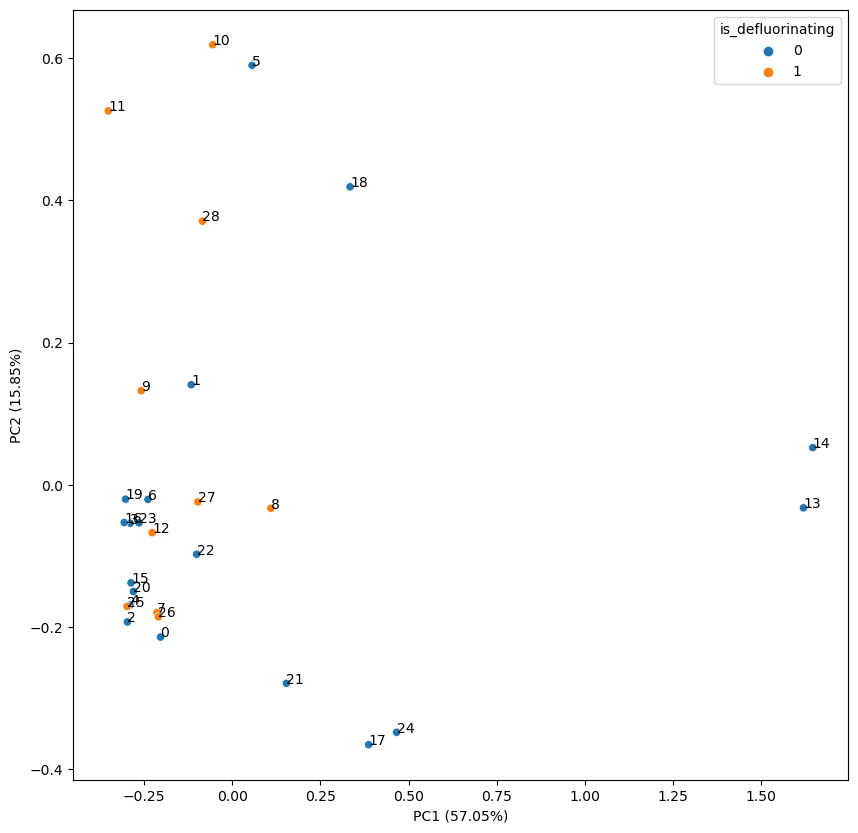

In [ ]:
# make a PCA and plot a feature table
pca = PCA(n_components=2)
pca.fit(feature_table)
X_pca = pca.transform(feature_table)

labels = labels[feature_table.index]

# plot the PCA and color by labels
plt.figure(figsize=(10, 10))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=labels)

# add variance to axes
plt.xlabel(f"PC1 ({round(pca.explained_variance_ratio_[0]*100, 2)}%)")
plt.ylabel(f"PC2 ({round(pca.explained_variance_ratio_[1]*100, 2)}%)")

# add numbers over dots
for i, txt in enumerate(feature_table.index):
    plt.text(X_pca[i, 0], X_pca[i, 1], txt)

plt.show()

In [ ]:
(annopro) (annopro) gldongmo@LAPTOP-76LGEJQB:~/AnnoPRO$ annopro -i "/mnt/c/Users/Gilles/Documents/Master_thesis/split_fasta_files/filtered_ARTHROV.fasta
"         -o "/mnt/c/Users/Gilles/Documents/Master_thesis/output_annopro/output_ARTHROV_annopro"

In [ ]:
(mdeepfri)  mDeepFRI predict-function -i /mnt/c/Users/Gilles/Documents/Master_thesis/rcsb_pdb_1S3P.fasta -d /mnt/c/Users/Gilles/Documents/Master_thesis/afdb_swissprot_v4 -w /mnt/c/Users/Gilles/Documents/Master_thesis/weights/folder -o /mnt/c/Users/Gilles/Documents/Master_the is/output_testing --overwrite 2> /mnt/c/Users/Gilles/Documents/Master_thesis/log.txt

In [ ]:
# fit the search
search.best_estimator_.fit(feature_table, labels)

RandomForestClassifier(max_depth=8, min_samples_split=4, n_estimators=200)

In [ ]:
start_dataset = "/nfs/cds-peta/exports/biol_micro_cds_gr_sunagawa/scratch/vbezshapkin/Metagenomic-DeepFRI/notebooks/data/halogenases_start_dataset/results.tsv"
start_df = pd.read_csv(start_dataset, sep='\t')
start_meta = "/nfs/cds-peta/exports/biol_micro_cds_gr_sunagawa/scratch/vbezshapkin/Metagenomic-DeepFRI/notebooks/data/248_HAD_start_dataset_fixed.csv"
start_meta_df = pd.read_csv(start_meta, sep=',')

In [ ]:
# select the mode
mode = "mf"
start_molecular_function = start_df.query(f"DeepFRI_mode =='{mode}'")
# convert dataset to matrix
start_feature_table = pd.pivot_table(start_molecular_function, index="Protein", columns="GO_term/EC_number", values="Score").fillna(0)

In [ ]:
# unify two datasets and then split again

full = pd.concat([feature_table, start_feature_table], axis=0).fillna(0)

<Figure size 300x300 with 0 Axes>

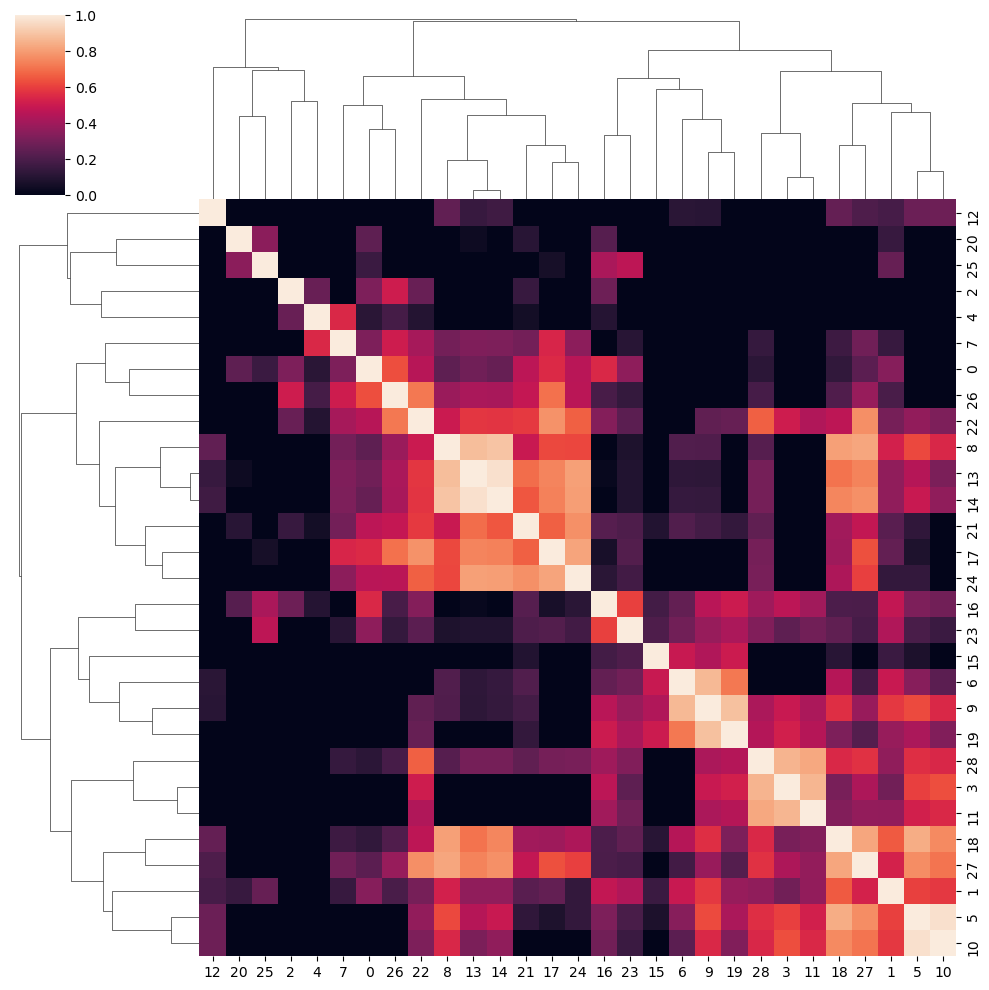

In [ ]:
# calculate cosine distances
from sklearn.metrics import pairwise_distances

cosine_distances = pairwise_distances(full, metric="cosine")
# transform to similarity
cosine_similarity = 1 - cosine_distances

# order and plot heatmap
plt.figure(figsize=(3, 3))
sns.clustermap(cosine_similarity[:29, :29])
plt.show();

/nfs/cds-peta/exports/biol_micro_cds_gr_sunagawa/scratch/vbezshapkin/conda-envs/data-analysis/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/nfs/cds-peta/exports/biol_micro_cds_gr_sunagawa/scratch/vbezshapkin/conda-envs/data-analysis/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 300x300 with 0 Axes>

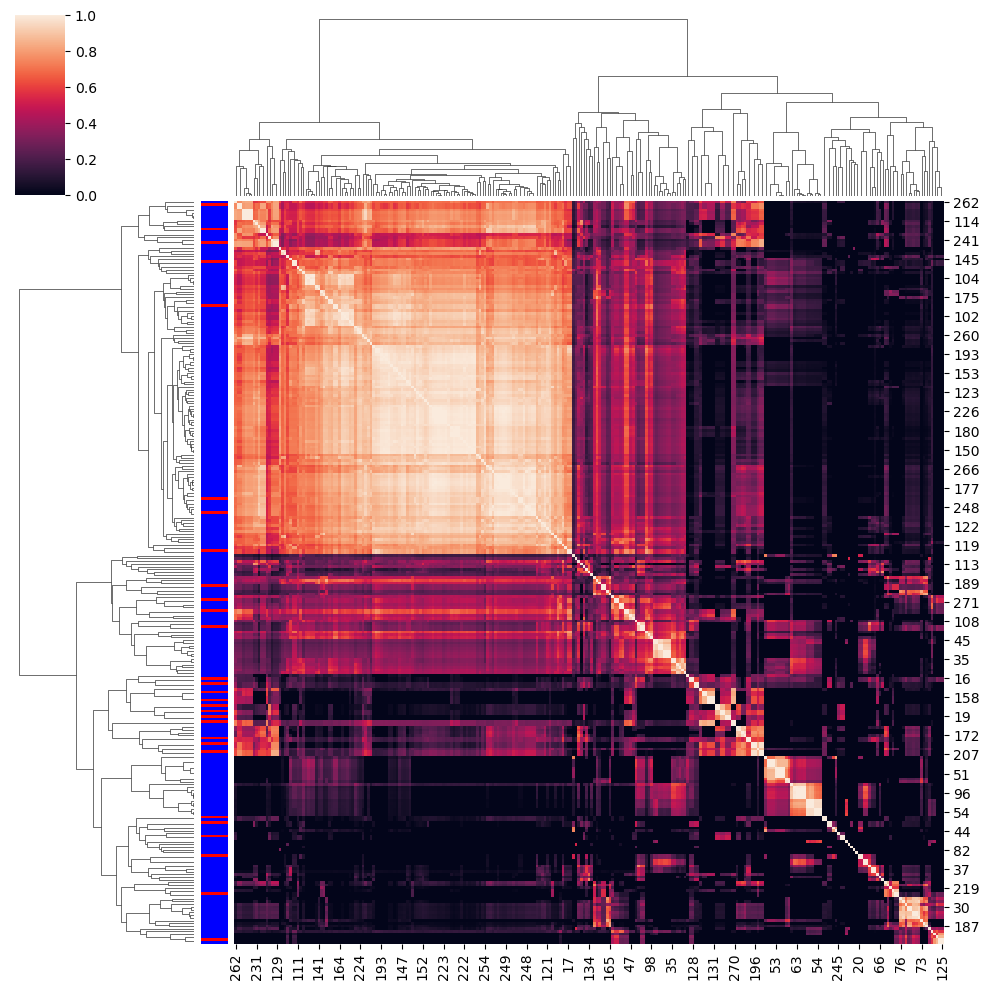

In [ ]:
# calculate cosine distances
from sklearn.metrics import pairwise_distances

cosine_distances = pairwise_distances(full, metric="cosine")
# transform to similarity
cosine_similarity = 1 - cosine_distances

# order and plot heatmap
plt.figure(figsize=(3, 3))
# color first 29 entries as red, and rest as blue
sns.clustermap(cosine_similarity, row_colors=[["red"]*29 + ["blue"]*244])
plt.show();

In [ ]:
%pip install annopro

     ---------------------------------------- 0.0/7.3 MB ? eta -:--:--
     -- ------------------------------------- 0.5/7.3 MB 3.4 MB/s eta 0:00:03
     -------- ------------------------------- 1.6/7.3 MB 4.0 MB/s eta 0:00:02
     -------------- ------------------------- 2.6/7.3 MB 4.7 MB/s eta 0:00:01
     -------------------- ------------------- 3.7/7.3 MB 4.7 MB/s eta 0:00:01
     ------------------------- -------------- 4.7/7.3 MB 4.9 MB/s eta 0:00:01
     ------------------------------- -------- 5.8/7.3 MB 4.8 MB/s eta 0:00:01
     ------------------------------------- -- 6.8/7.3 MB 4.9 MB/s eta 0:00:01
     ---------------------------------------- 7.3/7.3 MB 4.9 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): sti

  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [282 lines of output]
      setup.py:67: RuntimeWarning: NumPy 1.19.5 may not yet support Python 3.11.
        warnings.warn(
      Running from numpy source directory.
      setup.py:480: UserWarning: Unrecognized setuptools command, proceeding with generating Cython sources and expanding templates
        run_build = parse_setuppy_commands()
      Cythonizing sources
      Processing numpy/random\_bounded_integers.pxd.in
      Processing numpy/random\bit_generator.pyx
      Processing numpy/random\mtrand.pyx
      Processing numpy/random\_bounded_integers.pyx.in
      Processing numpy/random\_common.pyx
      Processing numpy/random\_generator.pyx
      Processing numpy/random\_mt19937.pyx
      Processing numpy/random\_pcg64.pyx
      Processing numpy/random\_philox.pyx
      Processing numpy/random\_sfc64.pyx
      blas_opt_info:
      blas_mkl_info:
   

In [ ]:
from Bio import SeqIO
import pandas as pd

# File paths (replace with actual paths)
tab_file = "MergedResults.tab"  # Your tab-delimited file with protein IDs
fasta_file = "cleaned_ARTHRO_5_Proteins_12Feb25.fasta"  # Your FASTA file with protein sequences
output_fasta = "filtered_proteins.fasta"  # Output FASTA file

# Load tab-delimited file and extract protein IDs (first column "Row.names")
df = pd.read_csv(tab_file, sep="\t")
protein_ids = df["Row.names"].str.split("|").str[0].tolist()  # Extract IDs before "|"

# Load FASTA sequences
fasta_sequences = SeqIO.to_dict(SeqIO.parse(fasta_file, "fasta"))

# Filter sequences that match the extracted IDs
filtered_sequences = [fasta_sequences[pid] for pid in protein_ids if pid in fasta_sequences]

# Save the filtered sequences to a new FASTA file
with open(output_fasta, "w") as output_handle:
    SeqIO.write(filtered_sequences, output_handle, "fasta")

print(f"✅ Extracted {len(filtered_sequences)} proteins and saved to '{output_fasta}'")


✅ Extracted 1280 proteins and saved to 'filtered_proteins.fasta'


In [ ]:
import pandas as pd

# File paths (update with your actual paths)
tab_file = "MergedResults.tab"  # Your tab-delimited file with protein IDs
tsv_file = "results_athrospira.tsv"  # Your original TSV file
output_tsv = "filtered_annotations.tsv"  # Output filtered TSV file

# Load tab-delimited file and extract protein IDs (first column "Row.names")
df_tab = pd.read_csv(tab_file, sep="\t")
protein_ids = df_tab["Row.names"].str.split("|").str[0].tolist()  # Extract IDs before "|"

# Load the original TSV file
df_tsv = pd.read_csv(tsv_file, sep="\t")

# Filter the annotations where Protein ID matches the extracted IDs
filtered_df = df_tsv[df_tsv["Protein"].isin(protein_ids)]

# Save the filtered data to a new TSV file
filtered_df.to_csv(output_tsv, sep="\t", index=False)

print(f"✅ Extracted {filtered_df.shape[0]} matching annotations and saved to '{output_tsv}'")


✅ Extracted 24872 matching annotations and saved to 'filtered_annotations.tsv'


In [ ]:
import pandas as pd

def jaccard_index(set1, set2):
    """Compute the Jaccard Index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0

# Load TSV files
file1_path = "uniprotkb_limnospira_indica_2025_03_03.tsv"
file2_path = "C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv"

df1 = pd.read_csv(file1_path, sep="\t")
df2 = pd.read_csv(file2_path, sep="\t")

# Define columns (Adjust if needed)
protein_col = df1[["Protein"]]  # Column containing protein IDs
go_col = "GO_Terms"         # Column containing GO terms (comma-separated)
category_col = "GO_Category"  # Column indicating BP or MF (if available)

# Convert GO terms to sets per protein
protein_annotations_1 = df1.groupby(protein_col)[go_col].apply(lambda x: set(','.join(x.dropna()).split(',')))
protein_annotations_2 = df2.groupby(protein_col)[go_col].apply(lambda x: set(','.join(x.dropna()).split(',')))

# Merge annotations from both tools
merged = pd.DataFrame({
    "Protein_ID": list(set(protein_annotations_1.index) | set(protein_annotations_2.index))
})

def compute_jaccard(row):
    """Compute Jaccard Index for each protein."""
    p_id = row["Protein_ID"]
    set1 = protein_annotations_1.get(p_id, set())
    set2 = protein_annotations_2.get(p_id, set())
    return jaccard_index(set1, set2)

# Compute Jaccard Index per protein
merged["Jaccard_Index"] = merged.apply(compute_jaccard, axis=1)

# Save results
output_path = "jaccard_results.tsv"
merged.to_csv(output_path, sep="\t", index=False)

print(f"Jaccard Index computed and saved to {output_path}")


In [ ]:
import pandas as pd

def jaccard_index(set1, set2):
    """Compute the Jaccard Index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0

# File paths

deepfri_file = "C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv"
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv"


# Load DeepFRI results
df_deepfri = pd.read_csv(deepfri_file, sep="\t")
df_uniprot = pd.read_csv(uniprot_file, sep="\t")

# Column names (Adjust if needed)
protein_col = "Protein"  # Protein ID in DeepFRI
go_col = "GO_term/EC_number"  # GO terms in DeepFRI
category_col = "DeepFRI_mode"  # BP or MF in DeepFRI

uniprot_protein_col = "Entry"  # Protein ID in UniProt
uniprot_go_col = "Gene Ontology IDs"  # GO terms in UniProt

# Convert DeepFRI GO terms to sets per protein & category
deepfri_annotations = df_deepfri.groupby([protein_col, category_col])[go_col].apply(lambda x: set(x.dropna()))

# Convert UniProt GO terms to sets per protein
df_uniprot[uniprot_go_col] = df_uniprot[uniprot_go_col].fillna("").apply(lambda x: set(x.split("; ")))
uniprot_annotations = df_uniprot.set_index(uniprot_protein_col)[uniprot_go_col].to_dict()

# Merge annotations per protein
proteins = set(deepfri_annotations.index.get_level_values(0)) | set(uniprot_annotations.keys())
results = []

for protein in proteins:
    # Get GO terms from both sources
    deepfri_bp = deepfri_annotations.get((protein, "bp"), set())
    deepfri_mf = deepfri_annotations.get((protein, "mf"), set())
    uniprot_go = uniprot_annotations.get(protein, set())

    # Compute Jaccard Index
    jaccard_bp = jaccard_index(deepfri_bp, uniprot_go)
    jaccard_mf = jaccard_index(deepfri_mf, uniprot_go)

    results.append([protein, jaccard_bp, jaccard_mf])

# Save results
df_results = pd.DataFrame(results, columns=["Protein_ID", "Jaccard_BP", "Jaccard_MF"])
output_file = "jaccard_results.tsv"
df_results.to_csv(output_file, sep="\t", index=False)

print(f"Jaccard Index results saved to {output_file}")


Jaccard Index results saved to jaccard_results.tsv


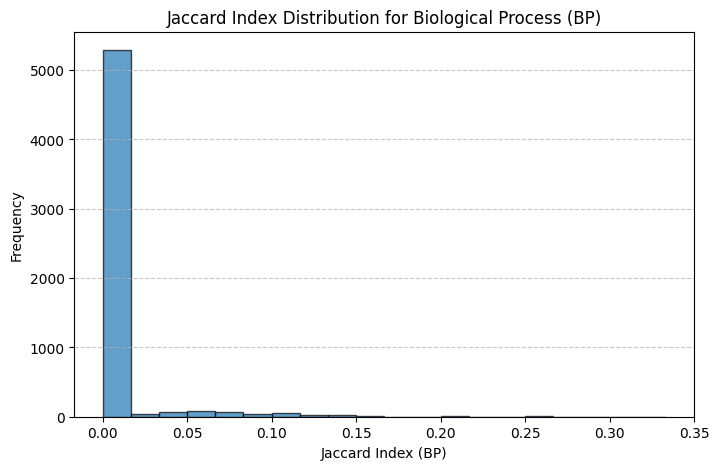

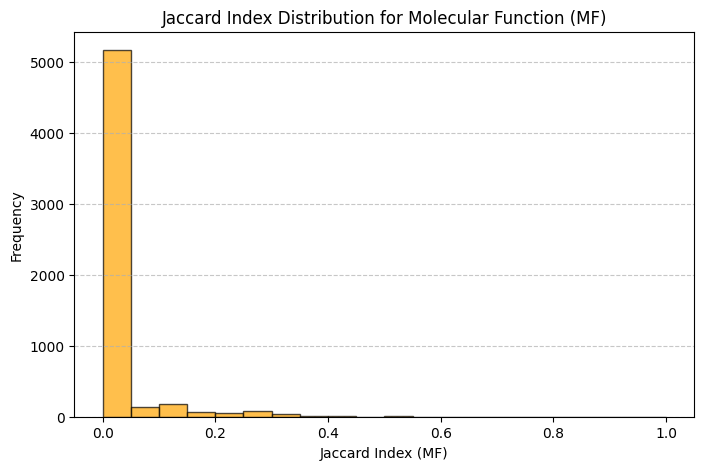

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load Jaccard results file
df_results = pd.read_csv("jaccard_results.tsv", sep="\t")

# Plot histogram for Biological Process (BP)
plt.figure(figsize=(8, 5))
plt.hist(df_results["Jaccard_BP"], bins=20, edgecolor="black", alpha=0.7)
plt.xlabel("Jaccard Index (BP)")
plt.ylabel("Frequency")
plt.title("Jaccard Index Distribution for Biological Process (BP)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

# Plot histogram for Molecular Function (MF)
plt.figure(figsize=(8, 5))
plt.hist(df_results["Jaccard_MF"], bins=20, edgecolor="black", alpha=0.7, color="orange")
plt.xlabel("Jaccard Index (MF)")
plt.ylabel("Frequency")
plt.title("Jaccard Index Distribution for Molecular Function (MF)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


In [ ]:
import pandas as pd

def jaccard_index(set1, set2):
    """Compute the Jaccard Index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0

# File paths




# Load DeepFRI results
df_deepfri = pd.read_csv(deepfri_file, sep="\t")
df_uniprot = pd.read_csv(uniprot_file, sep="\t")

# Column names (Adjust if needed)
protein_col = "Protein"  # Protein ID in DeepFRI
go_col = "GO_term/EC_number"  # GO terms in DeepFRI
category_col = "DeepFRI_mode"  # BP or MF in DeepFRI

uniprot_protein_col = "Entry"  # Protein ID in UniProt
uniprot_go_col = "Gene Ontology IDs"  # GO terms in UniProt

# Convert DeepFRI GO terms to sets per protein & category
deepfri_annotations = df_deepfri.groupby([protein_col, category_col])[go_col].apply(lambda x: set(x.dropna()))

# Convert UniProt GO terms to sets per protein
df_uniprot[uniprot_go_col] = df_uniprot[uniprot_go_col].fillna("").apply(lambda x: set(x.split("; ")))
uniprot_annotations = df_uniprot.set_index(uniprot_protein_col)[uniprot_go_col].to_dict()

# Merge annotations per protein
proteins = set(deepfri_annotations.index.get_level_values(0)) | set(uniprot_annotations.keys())
results = []

for protein in proteins:
    # Get GO terms from both sources
    deepfri_bp = deepfri_annotations.get((protein, "bp"), set())
    deepfri_mf = deepfri_annotations.get((protein, "mf"), set())
    uniprot_go = uniprot_annotations.get(protein, set())

    # Compute Jaccard Index
    jaccard_bp = jaccard_index(deepfri_bp, uniprot_go)
    jaccard_mf = jaccard_index(deepfri_mf, uniprot_go)

    results.append([protein, jaccard_bp, jaccard_mf])

# Save results
df_results = pd.DataFrame(results, columns=["Protein_ID", "Jaccard_BP", "Jaccard_MF"])
output_file = "jaccard_results_60_3200.tsv"
df_results.to_csv(output_file, sep="\t", index=False)

print(f"Jaccard Index results saved to {output_file}")


Jaccard Index results saved to jaccard_results_60_3200.tsv


In [15]:
import pandas as pd

# Define Jaccard Index function
def jaccard_index(set1, set2):
    """Compute the Jaccard Index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0

# File paths
deepfri_file = "C:/Users/Gilles/Documents/Master_thesis/output_limnospira_60_3200_length/results.tsv"
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv"

# Load DeepFRI results
df_deepfri = pd.read_csv(deepfri_file, sep="\t")

# Load UniProt results
df_uniprot = pd.read_csv(uniprot_file, sep="\t")

# Define column names (Adjust if needed)
protein_col = "Protein"  # Protein ID in DeepFRI
go_col = "GO_term/EC_number"  # GO terms in DeepFRI
category_col = "DeepFRI_mode"  # BP or MF in DeepFRI

uniprot_protein_col = "Entry"  # Protein ID in UniProt
uniprot_go_col = "Gene Ontology IDs"  # GO terms in UniProt

# Extract only GO terms (remove EC terms) from DeepFRI data
df_deepfri[go_col] = df_deepfri[go_col].fillna("").apply(lambda x: set(term for term in x.split("; ") if term.startswith("GO:")))

# Convert DeepFRI GO terms to sets per protein & category
deepfri_annotations = df_deepfri.groupby([protein_col, category_col])[go_col].apply(lambda x: set().union(*x))

# Extract only GO terms from UniProt data
df_uniprot[uniprot_go_col] = df_uniprot[uniprot_go_col].fillna("").apply(lambda x: set(term for term in x.split("; ") if term.startswith("GO:")))

# Convert UniProt GO terms to dictionary per protein
uniprot_annotations = df_uniprot.set_index(uniprot_protein_col)[uniprot_go_col].to_dict()

# Merge annotations per protein
proteins = set(deepfri_annotations.index.get_level_values(0)) | set(uniprot_annotations.keys())
results = []

for protein in proteins:
    # Get GO terms from both sources
    deepfri_bp = deepfri_annotations.get((protein, "bp"), set())
    deepfri_mf = deepfri_annotations.get((protein, "mf"), set())
    uniprot_go = uniprot_annotations.get(protein, set())

    # Compute Jaccard Index
    jaccard_bp = jaccard_index(deepfri_bp, uniprot_go)
    jaccard_mf = jaccard_index(deepfri_mf, uniprot_go)

    results.append([protein, jaccard_bp, jaccard_mf])

# Save results
df_results = pd.DataFrame(results, columns=["Protein_ID", "Jaccard_BP", "Jaccard_MF"])
output_file = "jaccard_results_60_3200.tsv"
df_results.to_csv(output_file, sep="\t", index=False)

print(f"Jaccard Index results saved to {output_file}")


Jaccard Index results saved to jaccard_results_60_3200.tsv


In [14]:
df_uniprot.shape

(5731, 15)

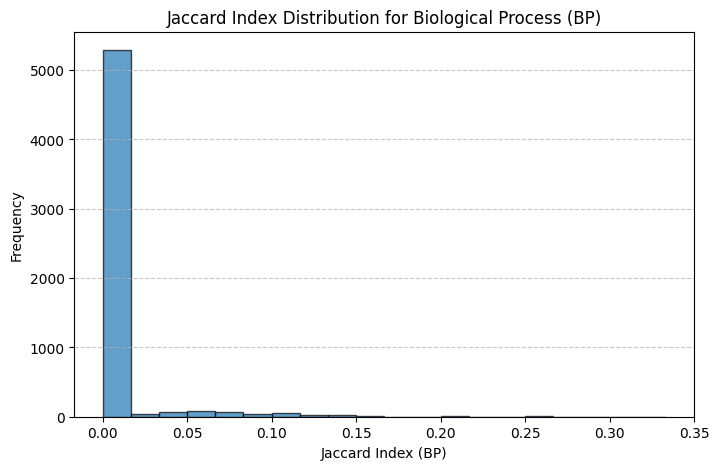

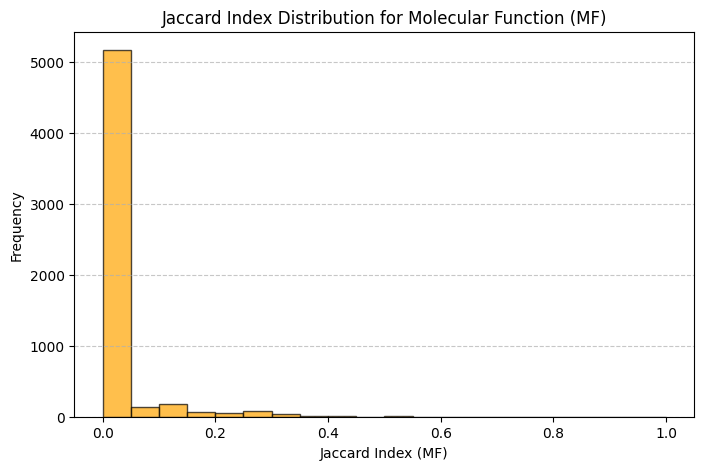

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load Jaccard results file
df_results = pd.read_csv("jaccard_results_60_3200.tsv", sep="\t")

# Plot histogram for Biological Process (BP)
plt.figure(figsize=(8, 5))
plt.hist(df_results["Jaccard_BP"], bins=20, edgecolor="black", alpha=0.7)
plt.xlabel("Jaccard Index (BP)")
plt.ylabel("Frequency")
plt.title("Jaccard Index Distribution for Biological Process (BP)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

# Plot histogram for Molecular Function (MF)
plt.figure(figsize=(8, 5))
plt.hist(df_results["Jaccard_MF"], bins=20, edgecolor="black", alpha=0.7, color="orange")
plt.xlabel("Jaccard Index (MF)")
plt.ylabel("Frequency")
plt.title("Jaccard Index Distribution for Molecular Function (MF)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


In [ ]:
import pandas as pd

def jaccard_index(set1, set2):
    """Compute the Jaccard Index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0

# File paths (Update these)
eggnog_file = "C:/Users/Gilles/Documents/Master_thesis/eggnog-mapper-2.1.12/test_limnospira_uniprot.emapper.annotations"
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv"

# Read eggNOG file and detect the header line (starting with #query)
with open(eggnog_file, "r") as f:
    for line in f:
        if line.startswith("#query"):  # Find the correct header line
            header = line.strip("#").strip().split("\t")
            break

# Load eggNOG file while skipping metadata lines (#)
df_eggnog = pd.read_csv(eggnog_file, sep="\t", comment="#", names=header, skiprows=1)


# Load eggNOG-mapper results (Skipping metadata lines starting with #)
#df_eggnog = pd.read_csv(eggnog_file, sep="\t", comment="#")

# Load UniProt annotations
df_uniprot = pd.read_csv(uniprot_file, sep="\t")

# Column names (Adjust if needed)
eggnog_protein_col = "query"  # Protein ID in eggNOG
eggnog_go_col = "GOs"  # GO terms in eggNOG

uniprot_protein_col = "Entry"  # Protein ID in UniProt
uniprot_go_col = "Gene Ontology IDs"  # GO terms in UniProt

# Convert eggNOG GO terms to sets per protein
df_eggnog[eggnog_go_col] = df_eggnog[eggnog_go_col].fillna("").apply(lambda x: set(x.split(",")))
eggnog_annotations = df_eggnog.set_index(eggnog_protein_col)[eggnog_go_col].to_dict()

# Convert UniProt GO terms to sets per protein
df_uniprot[uniprot_go_col] = df_uniprot[uniprot_go_col].fillna("").apply(lambda x: set(x.split("; ")))
uniprot_annotations = df_uniprot.set_index(uniprot_protein_col)[uniprot_go_col].to_dict()

# Merge annotations per protein
proteins = set(eggnog_annotations.keys()) | set(uniprot_annotations.keys())
results = []

for protein in proteins:
    # Get GO terms from both sources
    eggnog_go = eggnog_annotations.get(protein, set())
    uniprot_go = uniprot_annotations.get(protein, set())

    # Compute Jaccard Index
    jaccard_score = jaccard_index(eggnog_go, uniprot_go)

    results.append([protein, jaccard_score])

# Save results
df_results = pd.DataFrame(results, columns=["Protein_ID", "Jaccard_Index"])
output_file = "jaccard_results_eggnog_uniprot.tsv"
df_results.to_csv(output_file, sep="\t", index=False)

print(f"Jaccard Index results saved to {output_file}")


FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/Gilles/Documents/Master_thesis/eggnog-mapper-2.1.12/test_limnospira_uniprot.emapper.annotations'

In [ ]:
import pandas as pd

eggnog_file = "C:/Users/Gilles/Documents/Master_thesis/eggnog-mapper-2.1.12/test_limnospira_uniprot.emapper.annotations"

# Read eggNOG file and detect the header line (starting with #query)
with open(eggnog_file, "r") as f:
    for line in f:
        if line.startswith("#query"):  # Find the correct header line
            header = line.strip("#").strip().split("\t")
            break

# Load eggNOG file while skipping metadata lines (#)
df_eggnog = pd.read_csv(eggnog_file, sep="\t", comment="#", names=header, skiprows=1)

# Print available columns
print("Available columns in eggNOG file:", df_eggnog.columns)


Available columns in eggNOG file: Index(['query', 'seed_ortholog', 'evalue', 'score', 'eggNOG_OGs',
       'max_annot_lvl', 'COG_category', 'Description', 'Preferred_name', 'GOs',
       'EC', 'KEGG_ko', 'KEGG_Pathway', 'KEGG_Module', 'KEGG_Reaction',
       'KEGG_rclass', 'BRITE', 'KEGG_TC', 'CAZy', 'BiGG_Reaction', 'PFAMs'],
      dtype='object')


In [ ]:
df_eggnog.head(5)

,query,seed_ortholog,evalue,score,eggNOG_OGs,max_annot_lvl,COG_category,Description,Preferred_name,GOs,...,KEGG_ko,KEGG_Pathway,KEGG_Module,KEGG_Reaction,KEGG_rclass,BRITE,KEGG_TC,CAZy,BiGG_Reaction,PFAMs
0,A0A9P1KHL8,459495.SPLC1_S260640,1.750000e-295,810.0,"COG1207@1|root,COG1207@2|Bacteria,1FZW0@1117|C...",1117|Cyanobacteria,M,Catalyzes the last two sequential reactions in...,glmU,{-},...,ko:K04042,"ko00520,ko01100,ko01130,map00520,map01100,map0...",M00362,"R00416,R05332","RC00002,RC00004,RC00166","ko00000,ko00001,ko00002,ko01000",-,-,iJN678.glmU,"Hexapep,NTP_transf_3"
1,A0A9P1KAZ4,459495.SPLC1_S102020,5.990000e-268,732.0,"2DBBD@1|root,2Z87P@2|Bacteria,1G08A@1117|Cyano...",1117|Cyanobacteria,C,Photosystem II (PSII) is a light-driven water ...,psbA,{-},...,ko:K02703,"ko00195,ko01100,map00195,map01100",M00161,-,-,"ko00000,ko00001,ko00002,ko00194,ko01000",-,-,-,Photo_RC
2,A0A9P1KCL1,459495.SPLC1_S041310,1.690000e-297,812.0,"COG0452@1|root,COG0452@2|Bacteria,1FZX2@1117|C...",1117|Cyanobacteria,H,Catalyzes two steps in the biosynthesis of coe...,dfp,{-},...,ko:K13038,"ko00770,ko01100,map00770,map01100",M00120,"R03269,R04231","RC00064,RC00090,RC00822","ko00000,ko00001,ko00002,ko01000",-,-,-,"DFP,Flavoprotein"
3,A0A9P1KF24,459495.SPLC1_S520930,0.000000e+00,1062.0,"COG0062@1|root,COG0063@1|root,COG0062@2|Bacter...",1117|Cyanobacteria,G,Bifunctional enzyme that catalyzes the epimeri...,nnrD,{-},...,"ko:K17758,ko:K17759",-,-,-,-,"ko00000,ko01000",-,-,-,"Carb_kinase,YjeF_N"
4,A0A9P1KGE3,459495.SPLC1_S510680,0.000000e+00,1005.0,"COG0283@1|root,COG0414@1|root,COG0283@2|Bacter...",1117|Cyanobacteria,F,Catalyzes the condensation of pantoate with be...,panC/cmk,"{GO:1901360, GO:0004127, GO:0009123, GO:004423...",...,ko:K13799,"ko00240,ko00410,ko00770,ko01100,ko01110,map002...","M00052,M00119","R00158,R00512,R01665,R02473","RC00002,RC00096,RC00141","ko00000,ko00001,ko00002,ko01000",-,-,-,"Cytidylate_kin,Pantoate_ligase"


In [ ]:
import pandas as pd

# Load the dataset
#file_path = "eggong_df.csv"  # Update with the correct file path
#df = pd.read_csv(file_path)
df = df_eggnog
# Define column names (update if needed)
protein_col = "query"  # Column containing Protein IDs
go_col = "GOs"  # Column containing GO terms

# Function to split GO terms and expand them into multiple rows
def expand_go_terms(df, protein_col, go_col):
    """Expands GO terms into multiple rows while keeping the corresponding protein ID."""
    df = df[[protein_col, go_col]].copy()
    df[go_col] = df[go_col].astype(str).str.strip("{}")  # Remove curly braces
    df = df.assign(GO_Term=df[go_col].str.split(", ")).explode("GO_Term")  # Split and expand
    df = df.drop(columns=[go_col])  # Remove original GO column
    return df

# Expand GO terms into separate rows
df_expanded = expand_go_terms(df, protein_col, go_col)

# Save the updated dataset
output_file = "expanded_eggong_go_terms.csv"
df_expanded.to_csv(output_file, index=False)

print(f"Expanded dataset saved as {output_file}")


Expanded dataset saved as expanded_eggong_go_terms.csv


In [ ]:
import pandas as pd

def jaccard_index(set1, set2):
    """Compute the Jaccard Index between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0




# Load eggNOG-mapper results (Skipping metadata lines starting with #)
#df_eggnog = pd.read_csv(eggnog_file, sep="\t", comment="#")

# Load UniProt annotations
df_uniprot = pd.read_csv(uniprot_file, sep="\t")

# Column names (Adjust if needed)
eggnog_protein_col = "query"  # Protein ID in eggNOG
eggnog_go_col = "GOs"  # GO terms in eggNOG

uniprot_protein_col = "Entry"  # Protein ID in UniProt
uniprot_go_col = "Gene Ontology IDs"  # GO terms in UniProt

# Convert eggNOG GO terms to sets per protein
df_eggnog[eggnog_go_col] = df_eggnog[eggnog_go_col].fillna("").apply(lambda x: set(x.split(",")))
eggnog_annotations = df_eggnog.set_index(eggnog_protein_col)[eggnog_go_col].to_dict()

# Convert UniProt GO terms to sets per protein
df_uniprot[uniprot_go_col] = df_uniprot[uniprot_go_col].fillna("").apply(lambda x: set(x.split("; ")))
uniprot_annotations = df_uniprot.set_index(uniprot_protein_col)[uniprot_go_col].to_dict()

# Merge annotations per protein
proteins = set(eggnog_annotations.keys()) | set(uniprot_annotations.keys())
results = []

for protein in proteins:
    # Get GO terms from both sources
    eggnog_go = eggnog_annotations.get(protein, set())
    uniprot_go = uniprot_annotations.get(protein, set())

    # Compute Jaccard Index
    jaccard_score = jaccard_index(eggnog_go, uniprot_go)

    results.append([protein, jaccard_score])

# Save results
df_results = pd.DataFrame(results, columns=["Protein_ID", "Jaccard_Index"])
output_file = "jaccard_results_eggnog_uniprot.tsv"
df_results.to_csv(output_file, sep="\t", index=False)

print(f"Jaccard Index results saved to {output_file}")


NameError: name 'uniprot_file' is not defined

In [ ]:
df_eggnog.to_csv("eggong_df.csv", sep="\t", index=False)

In [ ]:
import pandas as pd

# Load the dataset
file_path = "C:/Users/Gilles/Documents/Master_thesis/Metagenomic-DeepFRI-main/notebooks/eggong_df.csv"  # Update the path

# Try different delimiters: comma, tab, or semicolon
try:
    df = pd.read_csv(file_path, sep=",")  # Default CSV
except:
    try:
        df = pd.read_csv(file_path, sep="\t")  # Tab-separated
    except:
        df = pd.read_csv(file_path, sep=";")  # Semicolon-separated



# Define COG category to GO term mapping
cog_to_go = {
    "M": "BP",  # Metabolism-related COGs -> Biological Process
    "C": "BP",  # Energy production and conversion -> Biological Process
    "H": "BP",  # Coenzyme metabolism -> Biological Process
    "G": "BP",  # Carbohydrate metabolism -> Biological Process
    "E": "BP",  # Amino acid metabolism -> Biological Process
    "F": "BP",  # Nucleotide metabolism -> Biological Process
    "I": "BP",  # Lipid metabolism -> Biological Process
    "P": "BP",  # Inorganic ion transport -> Biological Process
    "Q": "BP",  # Secondary metabolites -> Biological Process
    "J": "CC",  # Translation -> Cellular Component
    "A": "CC",  # RNA processing and modification -> Cellular Component
    "B": "CC",  # Chromatin structure and dynamics -> Cellular Component
    "Y": "CC",  # Nuclear structure -> Cellular Component
    "Z": "CC",  # Cytoskeleton -> Cellular Component
    "U": "CC",  # Intracellular trafficking -> Cellular Component
    "L": "CC",  # Replication, recombination, and repair -> Cellular Component
    "D": "MF",  # Cell cycle control, mitosis, and meiosis -> Molecular Function
    "T": "MF",  # Signal transduction -> Molecular Function
    "O": "MF",  # Post-translational modification -> Molecular Function
    "K": "MF",  # Transcription -> Molecular Function
    "V": "MF",  # Defense mechanisms -> Molecular Function
    "N": "MF",  # Cell motility -> Molecular Function
    "X": "MF",  # Unknown function -> Molecular Function
    "-": "Unknown"  # Unclassified
}

# Map the COG category to GO terms
df["GO_Category"] = df["COG_category"].apply(lambda x: ", ".join(set(cog_to_go.get(c, "Unknown") for c in str(x))))

# Save the updated file
output_file = "eggong_df_with_GO_category.csv"
df.to_csv(output_file, index=False)

print(f"Updated file saved as {output_file}")


Updated file saved as eggong_df_with_GO_category.csv


In [ ]:
import pandas as pd

file_path = "C:/Users/Gilles/Documents/Master_thesis/Metagenomic-DeepFRI-main/notebooks/eggong_df.csv"

# Try different delimiters: comma, tab, or semicolon
try:
    df = pd.read_csv(file_path, sep=",")  # Default CSV
except:
    try:
        df = pd.read_csv(file_path, sep="\t")  # Tab-separated
    except:
        df = pd.read_csv(file_path, sep=";")  # Semicolon-separated

# Show first few rows
print(df.head())


        query         seed_ortholog         evalue   score  \
0  A0A9P1KHL8  459495.SPLC1_S260640  1.750000e-295   810.0   
1  A0A9P1KAZ4  459495.SPLC1_S102020  5.990000e-268   732.0   
2  A0A9P1KCL1  459495.SPLC1_S041310  1.690000e-297   812.0   
3  A0A9P1KF24  459495.SPLC1_S520930   0.000000e+00  1062.0   
4  A0A9P1KGE3  459495.SPLC1_S510680   0.000000e+00  1005.0   

                                          eggNOG_OGs       max_annot_lvl  \
0  COG1207@1|root,COG1207@2|Bacteria,1FZW0@1117|C...  1117|Cyanobacteria   
1  2DBBD@1|root,2Z87P@2|Bacteria,1G08A@1117|Cyano...  1117|Cyanobacteria   
2  COG0452@1|root,COG0452@2|Bacteria,1FZX2@1117|C...  1117|Cyanobacteria   
3  COG0062@1|root,COG0063@1|root,COG0062@2|Bacter...  1117|Cyanobacteria   
4  COG0283@1|root,COG0414@1|root,COG0283@2|Bacter...  1117|Cyanobacteria   

  COG_category                                        Description  \
0            M  Catalyzes the last two sequential reactions in...   
1            C  Photosystem II (

In [ ]:
# Function to determine GO category
import re
def get_go_category(go_id):
    """Categorize a GO term as MF, BP, or CC."""
    if go_id.startswith("GO:0003674"):  # Molecular Function (MF)
        return "MF"
    elif go_id.startswith("GO:0008150"):  # Biological Process (BP)
        return "BP"
    elif go_id.startswith("GO:0005575"):  # Cellular Component (CC)
        return "CC"
    else:
        return "Other"  # If not classified


# Process GO terms
if eggnog_go_col in df_eggnog.columns:
    df_eggnog[eggnog_go_col] = df_eggnog[eggnog_go_col].fillna("").apply(lambda x: re.findall(r'GO:\d+', x))

    # Create a new column mapping each GO term to its category
    df_eggnog["GO_Category"] = df_eggnog[eggnog_go_col].apply(lambda go_list: [f"{go}: {get_go_category(go)}" for go in go_list])

    # Convert list format to string for saving
    df_eggnog["GO_Category"] = df_eggnog["GO_Category"].apply(lambda x: "; ".join(x) if x else "")

TypeError: expected string or bytes-like object, got 'set'

In [ ]:

# Process GO terms
if eggnog_go_col in df_eggnog.columns:
    df_eggnog[eggnog_go_col] = df_eggnog[eggnog_go_col].fillna("").apply(lambda x: re.findall(r'GO:\d+', x))

    # Create a new column mapping each GO term to its category
    df_eggnog["GO_Category"] = df_eggnog[eggnog_go_col].apply(lambda go_list: [f"{go}: {get_go_category(go)}" for go in go_list])

    # Convert list format to string for saving
    df_eggnog["GO_Category"] = df_eggnog["GO_Category"].apply(lambda x: "; ".join(x) if x else "")

In [ ]:
# Extract COG categories from the dataset
cog_categories = df_eggnog["COG_category"].dropna().unique()

# Map COG categories to their meanings
cog_meanings = {
    "J": "Translation, ribosomal structure, and biogenesis",
    "A": "RNA processing and modification",
    "K": "Transcription",
    "L": "Replication, recombination, and repair",
    "B": "Chromatin structure and dynamics",
    "D": "Cell cycle control, cell division, chromosome partitioning",
    "Y": "Nuclear structure",
    "V": "Defense mechanisms",
    "T": "Signal transduction mechanisms",
    "M": "Cell wall/membrane/envelope biogenesis",
    "N": "Cell motility",
    "Z": "Cytoskeleton",
    "W": "Extracellular structures",
    "U": "Intracellular trafficking, secretion, and vesicular transport",
    "O": "Posttranslational modification, protein turnover, chaperones",
    "C": "Energy production and conversion",
    "G": "Carbohydrate transport and metabolism",
    "E": "Amino acid transport and metabolism",
    "F": "Nucleotide transport and metabolism",
    "H": "Coenzyme transport and metabolism",
    "I": "Lipid transport and metabolism",
    "P": "Inorganic ion transport and metabolism",
    "Q": "Secondary metabolites biosynthesis, transport, and catabolism",
    "R": "General function prediction only",
    "S": "Function unknown"
}

# Interpret COG categories
cog_interpretation = {cog: cog_meanings.get(cog, "Unknown") for cog in cog_categories}

# Display the interpretation
for cog, meaning in cog_interpretation.items():
    print(f"{cog}: {meaning}")

In [ ]:
import pandas as pd

from goatools.obo_parser import GODag

# Load the GO DAG
go_dag = GODag("go-basic.obo")

# Function to classify GO terms
def classify_go_terms(go_terms):
    mf_terms = set()
    bp_terms = set()
    cc_terms = set()
    
    for go_term in go_terms:
        if go_term in go_dag:
            go_obj = go_dag[go_term]
            if go_obj.namespace == 'molecular_function':
                mf_terms.add(go_term)
            elif go_obj.namespace == 'biological_process':
                bp_terms.add(go_term)
            elif go_obj.namespace == 'cellular_component':
                cc_terms.add(go_term)
    
    return mf_terms, bp_terms, cc_terms

# Example usage with your dataset
df = pd.read_csv("your_dataset.csv")  # Replace with your actual dataset file
df["GO_terms"] = df["GO_terms"].apply(lambda x: set(x.split("; ")))

# Classify GO terms
df["MF_terms"], df["BP_terms"], df["CC_terms"] = zip(*df["GO_terms"].apply(classify_go_terms))

# Display the classified terms
print(df[["GO_terms", "MF_terms", "BP_terms", "CC_terms"]].head())

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load Jaccard results file
df_results = pd.read_csv("jaccard_results_eggnog_uniprot.tsv", sep="\t")

# Plot histogram for Biological Process (BP)
plt.figure(figsize=(8, 5))
plt.hist(df_results["Jaccard_BP"], bins=20, edgecolor="black", alpha=0.7)
plt.xlabel("Jaccard Index (BP)")
plt.ylabel("Frequency")
plt.title("Jaccard Index Distribution for Biological Process (BP)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

# Plot histogram for Molecular Function (MF)
plt.figure(figsize=(8, 5))
plt.hist(df_results["Jaccard_MF"], bins=20, edgecolor="black", alpha=0.7, color="orange")
plt.xlabel("Jaccard Index (MF)")
plt.ylabel("Frequency")
plt.title("Jaccard Index Distribution for Molecular Function (MF)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


KeyError: 'Jaccard_BP'

<Figure size 800x500 with 0 Axes>

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Load DeepFRI prediction datasets
bp_file = "DeepFRI_BP_predictions.csv"
cc_file = "DeepFRI_CC_predictions.csv"
mf_file = "DeepFRI_MF_predictions.csv"

bp_df = pd.read_csv(bp_file)
#cc_df = pd.read_csv(cc_file, skiprows=1, usecols=["Protein", "GO_term/EC_number", "Score"], names=["Protein", "GO_term", "Score"])
#mf_df = pd.read_csv(mf_file, skiprows=1, usecols=["Protein", "GO_term/EC_number", "Score"], names=["Protein", "GO_term", "Score"])
bp_df.head()

,Protein,GO_term/EC_number,Score,GO_term/EC_number name
0,A0A9P1KHL8,GO:1901137,0.99976,carbohydrate derivative biosynthetic process
1,A0A9P1KHL8,GO:1903509,0.99932,liposaccharide metabolic process
2,A0A9P1KHL8,GO:1901135,0.99929,carbohydrate derivative metabolic process
3,A0A9P1KHL8,GO:0016051,0.99748,carbohydrate biosynthetic process
4,A0A9P1KHL8,GO:0005975,0.99608,carbohydrate metabolic process


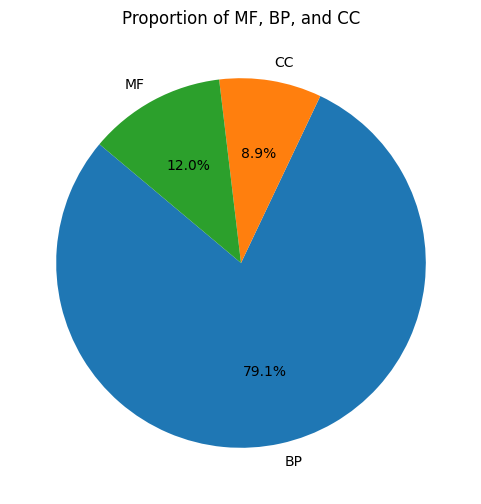

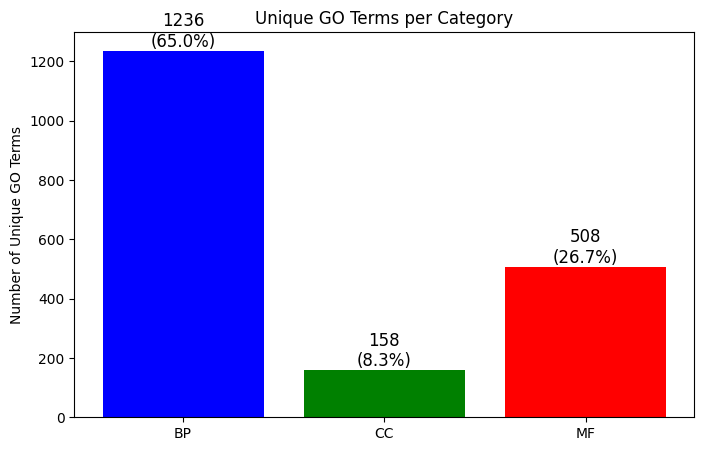

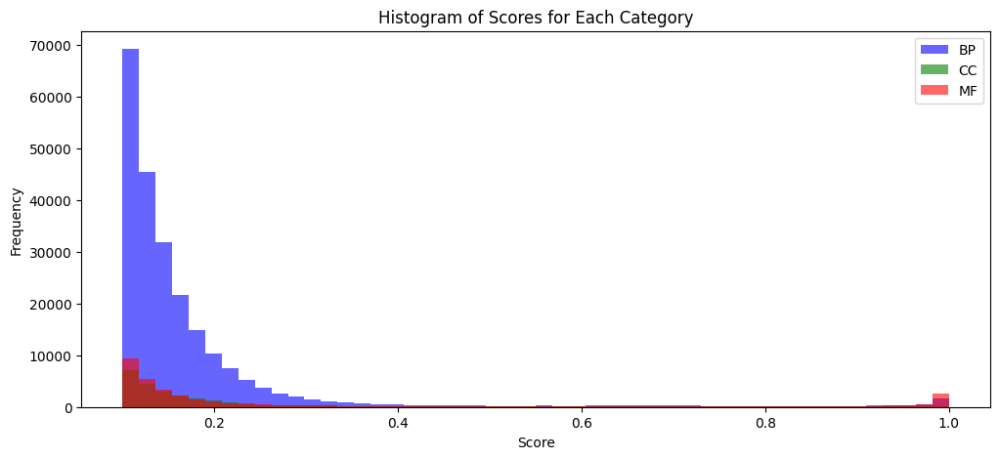

Total unique annotated proteins: 5725
Jaccard Index - BP: 0.0000, CC: 0.0000, MF: 0.0003


In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Load DeepFRI prediction datasets
bp_file = "DeepFRI_BP_predictions.csv"
cc_file = "DeepFRI_CC_predictions.csv"
mf_file = "DeepFRI_MF_predictions.csv"

bp_df = pd.read_csv(bp_file)
cc_df = pd.read_csv(cc_file)
mf_df = pd.read_csv(mf_file)

# Convert Score column to numeric
bp_df["Score"] = pd.to_numeric(bp_df["Score"], errors="coerce")
cc_df["Score"] = pd.to_numeric(cc_df["Score"], errors="coerce")
mf_df["Score"] = pd.to_numeric(mf_df["Score"], errors="coerce")

# Proportion of MF, BP, and CC
category_sizes = {"BP": len(bp_df), "CC": len(cc_df), "MF": len(mf_df)}
plt.figure(figsize=(6, 6))
plt.pie(category_sizes.values(), labels=category_sizes.keys(), autopct="%1.1f%%", startangle=140)
plt.title("Proportion of MF, BP, and CC")
plt.show()

# Unique GO terms per category
unique_go_counts = {"BP": len(bp_df["GO_term/EC_number"].unique()), "CC": len(cc_df["GO_term/EC_number"].unique()), "MF": len(mf_df["GO_term/EC_number"].unique())}
plt.figure(figsize=(8, 5))
bars = plt.bar(unique_go_counts.keys(), unique_go_counts.values(), color=['blue', 'green', 'red'])
for bar, count in zip(bars, unique_go_counts.values()):
    percentage = (count / sum(unique_go_counts.values())) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{count}\n({percentage:.1f}%)", ha='center', va='bottom', fontsize=12)
plt.ylabel("Number of Unique GO Terms")
plt.title("Unique GO Terms per Category")
plt.show()

# Histograms of Scores
plt.figure(figsize=(12, 5))
plt.hist(bp_df["Score"], bins=50, alpha=0.6, color='blue', label="BP")
plt.hist(cc_df["Score"], bins=50, alpha=0.6, color='green', label="CC")
plt.hist(mf_df["Score"], bins=50, alpha=0.6, color='red', label="MF")
plt.xlabel("Score")
plt.ylabel("Frequency")
plt.title("Histogram of Scores for Each Category")
plt.legend()
plt.show()

# Number of unique proteins annotated
all_annotated_proteins = set(bp_df["Protein"]).union(set(cc_df["Protein"])).union(set(mf_df["Protein"]))
total_annotated_proteins = len(all_annotated_proteins)
print(f"Total unique annotated proteins: {total_annotated_proteins}")

# Load UniProt annotations
uniprot_file = "uniprotkb_limnospira_indica_2025_03_03.tsv"
uniprot_df = pd.read_csv(uniprot_file, sep="\t")

# Extract GO term mappings from UniProt dataset
def extract_go_terms(df, go_column):
    go_mapping = {}
    for _, row in df.dropna().iterrows():
        protein = row["Entry"]
        go_terms = {term.split(" [")[1][:-1] for term in row[go_column].split("; ") if " [" in term}
        go_mapping[protein] = go_terms
    return go_mapping

uniprot_bp_mapping = extract_go_terms(uniprot_df, "Gene Ontology (biological process)")
uniprot_cc_mapping = extract_go_terms(uniprot_df, "Gene Ontology (cellular component)")
uniprot_mf_mapping = extract_go_terms(uniprot_df, "Gene Ontology (molecular function)")

def deepfri_go_terms(df):
    return df.groupby("Protein")["GO_term/EC_number"].apply(set).to_dict()

deepfri_bp_mapping = deepfri_go_terms(bp_df)
deepfri_cc_mapping = deepfri_go_terms(cc_df)
deepfri_mf_mapping = deepfri_go_terms(mf_df)

def calculate_jaccard(deepfri_mapping, uniprot_mapping):
    jaccard_scores = []
    for protein, deepfri_go in deepfri_mapping.items():
        uniprot_go = uniprot_mapping.get(protein, set())
        if deepfri_go or uniprot_go:
            intersection = len(deepfri_go & uniprot_go)
            union = len(deepfri_go | uniprot_go)
            jaccard = intersection / union if union > 0 else 0
            jaccard_scores.append(jaccard)
    return sum(jaccard_scores) / len(jaccard_scores) if jaccard_scores else 0

# Compute Jaccard Index for each category
jaccard_bp = calculate_jaccard(deepfri_bp_mapping, uniprot_bp_mapping)
jaccard_cc = calculate_jaccard(deepfri_cc_mapping, uniprot_cc_mapping)
jaccard_mf = calculate_jaccard(deepfri_mf_mapping, uniprot_mf_mapping)

print(f"Jaccard Index - BP: {jaccard_bp:.4f}, CC: {jaccard_cc:.4f}, MF: {jaccard_mf:.4f}")


In [10]:
import pandas as pd

def extract_go_terms(go_column):
    """Extract GO term IDs from the UniProt dataset."""
    if pd.isna(go_column):
        return set()
    return set([term.split("[")[1].split("]")[0] for term in go_column.split("; ") if "[" in term and "]" in term])

def jaccard_index(set1, set2):
    """Compute Jaccard index between two sets."""
    intersection = len(set1 & set2)
    union = len(set1 | set2)
    return intersection / union if union > 0 else 0

# Load datasets

# Load UniProt dataset
uniprot_df = pd.read_csv("uniprotkb_limnospira_indica_2025_03_03.tsv", sep="\t")

# Extract GO terms from UniProt dataset
uniprot_df["BP_GO_Terms"] = uniprot_df["Gene Ontology (biological process)"].apply(extract_go_terms)
uniprot_df["CC_GO_Terms"] = uniprot_df["Gene Ontology (cellular component)"].apply(extract_go_terms)
uniprot_df["MF_GO_Terms"] = uniprot_df["Gene Ontology (molecular function)"].apply(extract_go_terms)

# Create lookup dictionaries for DeepFRI predictions
bp_lookup = bp_df.groupby("Protein")["GO_term/EC_number"].apply(set).to_dict()
cc_lookup = cc_df.groupby("Protein")["GO_term/EC_number"].apply(set).to_dict()
mf_lookup = mf_df.groupby("Protein")["GO_term/EC_number"].apply(set).to_dict()

# Compute Jaccard index per protein per category
jaccard_per_category = []

for _, row in uniprot_df.iterrows():
    protein_id = row["Entry"]
    
    # Get GO terms from UniProt dataset
    bp_uniprot = row["BP_GO_Terms"]
    cc_uniprot = row["CC_GO_Terms"]
    mf_uniprot = row["MF_GO_Terms"]
    
    # Get GO terms from DeepFRI dataset using lookup dictionaries
    bp_deepfri = bp_lookup.get(protein_id, set())
    cc_deepfri = cc_lookup.get(protein_id, set())
    mf_deepfri = mf_lookup.get(protein_id, set())
    
    # Compute Jaccard indices
    jaccard_bp = jaccard_index(bp_uniprot, bp_deepfri)
    jaccard_cc = jaccard_index(cc_uniprot, cc_deepfri)
    jaccard_mf = jaccard_index(mf_uniprot, mf_deepfri)
    
    # Append results
    jaccard_per_category.append(["BP", protein_id, jaccard_bp])
    jaccard_per_category.append(["CC", protein_id, jaccard_cc])
    jaccard_per_category.append(["MF", protein_id, jaccard_mf])

# Convert results into DataFrame
jaccard_category_df = pd.DataFrame(jaccard_per_category, columns=["Category", "Protein", "Jaccard_Index"])

# Save results to a CSV file
jaccard_category_df.to_csv("Jaccard_Index_per_Protein_Category.csv", index=False)

# Display output
display(jaccard_category_df.head())


,Category,Protein,Jaccard_Index
0,BP,A0A9P1KHL8,0.092308
1,CC,A0A9P1KHL8,0.000000
2,MF,A0A9P1KHL8,0.083333
3,BP,A0A9P1KAZ4,0.000000
4,CC,A0A9P1KAZ4,0.052632


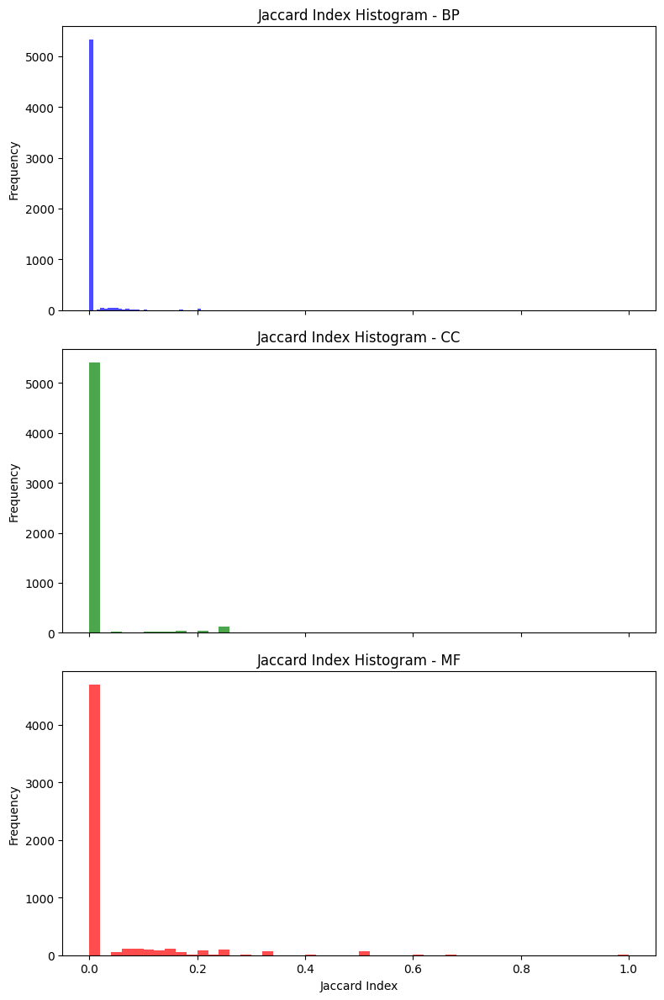

In [11]:
# Create separate histograms for each category
fig, axes = plt.subplots(3, 1, figsize=(8, 12), sharex=True)

# Define categories and colors
categories = ["BP", "CC", "MF"]
colors = ["blue", "green", "red"]

# Plot individual histograms
for ax, category, color in zip(axes, categories, colors):
    subset = jaccard_category_df[jaccard_category_df["Category"] == category]
    ax.hist(subset["Jaccard_Index"], bins=50, alpha=0.7, color=color)
    ax.set_title(f"Jaccard Index Histogram - {category}")
    ax.set_ylabel("Frequency")

axes[-1].set_xlabel("Jaccard Index")

# Show the plots
plt.tight_layout()
plt.show()

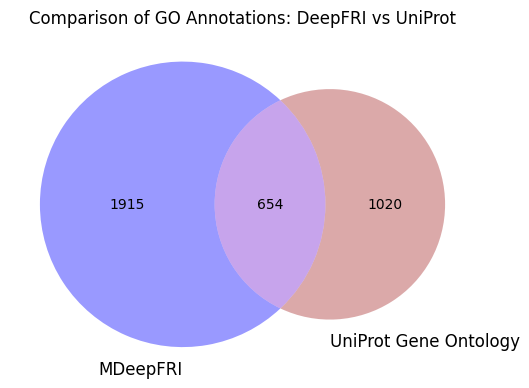

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2


# File paths
deepfri_file = "C:/Users/Gilles/Documents/Master_thesis/output_limnospira_60_3200_length/results.tsv"
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv"

# Load DeepFRI results dataset
#deepfri_file = "results.tsv"
deepfri_df = pd.read_csv(deepfri_file, sep="\t")

# Load UniProt dataset
#uniprot_file = "uniprotkb_limnospira_indica_2025_03_03.tsv"
uniprot_df = pd.read_csv(uniprot_file, sep="\t")

# Extract GO terms from DeepFRI
deepfri_go_terms = set(deepfri_df["GO_term/EC_number"].dropna().unique())

# Extract GO terms from UniProt
uniprot_go_terms = set()
if "Gene Ontology IDs" in uniprot_df.columns:
    for go_terms in uniprot_df["Gene Ontology IDs"].dropna():
        uniprot_go_terms.update(go_terms.split("; "))

# Find unique and common GO terms
unique_deepfri = len(deepfri_go_terms - uniprot_go_terms)
unique_uniprot = len(uniprot_go_terms - deepfri_go_terms)
common_terms = len(deepfri_go_terms & uniprot_go_terms)

# Plot the Venn diagram
plt.figure(figsize=(6, 6))
venn2(subsets=(unique_deepfri, unique_uniprot, common_terms), 
      set_labels=("MDeepFRI", "UniProt Gene Ontology"), set_colors=("blue", "brown"))

# Add counts to the diagram
plt.title("Comparison of GO Annotations: DeepFRI vs UniProt")
plt.show()

In [ ]:
#%pip install matplotlib_venn

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for matplotlib_venn: filename=matplotlib_venn-1.1.2-py3-none-any.whl size=45404 sha256=ce758669b85e05992f529022cc64b9c7edbd0bad1e83b2deb92d789b047892ec
  Stored in directory: c:\users\gilles\appdata\local\pip\cache\wheels\c4\16\4a\93374cd955bbe0553a8ce74db7f0fbd5fcc876e19fb78bd601
Successfully built matplotlib_venn
Note: you may need to restart the kernel to use updated packages.


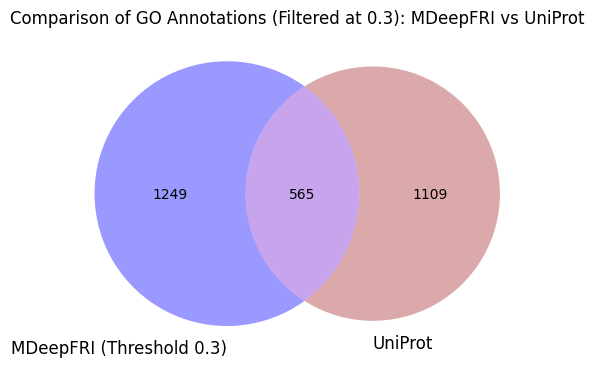

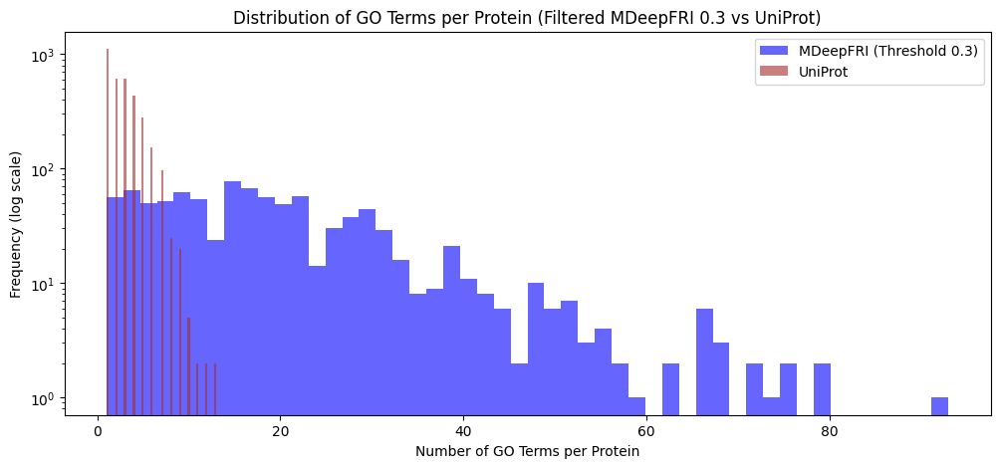

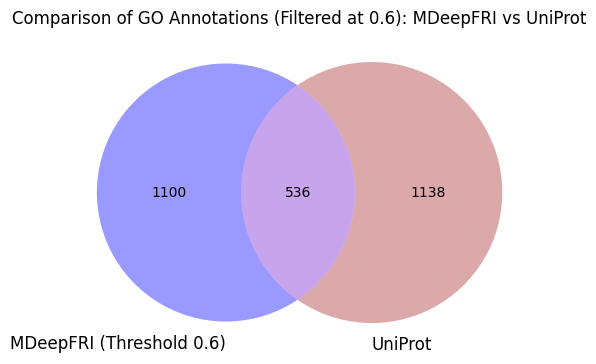

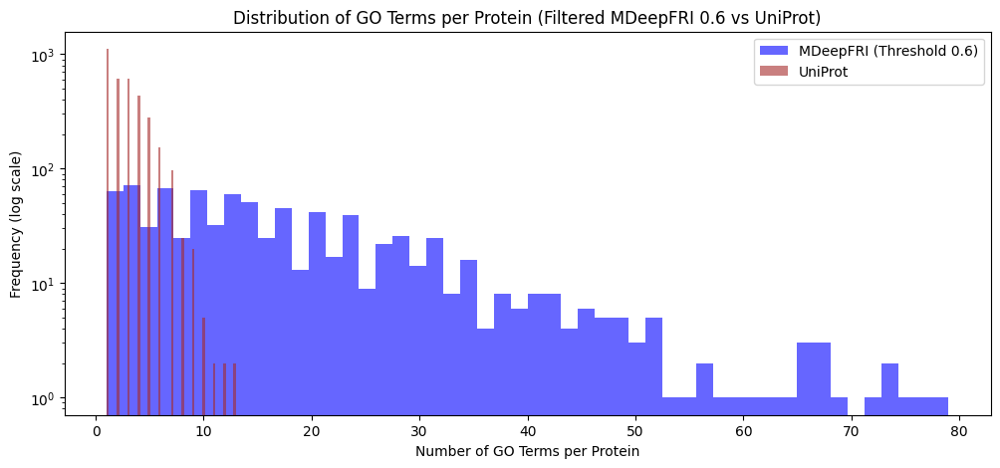

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Load datasets

# File paths
mdeepfri_file = "C:/Users/Gilles/Documents/Master_thesis/output_limnospira_60_3200_length/results.tsv"
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv"


# Read the MDeepFRI results dataset
mdeepfri_df = pd.read_csv(mdeepfri_file, sep="\t")

# Read the UniProt dataset
uniprot_df = pd.read_csv(uniprot_file, sep="\t")

# Extract GO terms from UniProt
uniprot_go_terms = set()
if "Gene Ontology IDs" in uniprot_df.columns:
    for go_terms in uniprot_df["Gene Ontology IDs"].dropna():
        uniprot_go_terms.update(go_terms.split("; "))

# Ensure Score column is numeric
mdeepfri_df["Score"] = pd.to_numeric(mdeepfri_df["Score"], errors="coerce")

# Define confidence thresholds
thresholds = [0.3, 0.6]

for threshold in thresholds:
    # Filter MDeepFRI dataset based on confidence score
    mdeepfri_filtered = mdeepfri_df[mdeepfri_df["Score"] >= threshold]

    # Extract filtered GO terms from MDeepFRI dataset
    mdeepfri_filtered_go_terms = set(mdeepfri_filtered["GO_term/EC_number"].dropna().unique())

    # Find unique and common GO terms after filtering
    unique_mdeepfri_filtered = len(mdeepfri_filtered_go_terms - uniprot_go_terms)
    unique_uniprot_filtered = len(uniprot_go_terms - mdeepfri_filtered_go_terms)
    common_terms_filtered = len(mdeepfri_filtered_go_terms & uniprot_go_terms)

    # Plot the Venn diagram for the threshold
    plt.figure(figsize=(6, 6))
    venn2(subsets=(unique_mdeepfri_filtered, unique_uniprot_filtered, common_terms_filtered), 
          set_labels=(f"MDeepFRI (Threshold {threshold})", "UniProt"), set_colors=("blue", "brown"))

    # Add counts to the diagram
    plt.title(f"Comparison of GO Annotations (Filtered at {threshold}): MDeepFRI vs UniProt")
    plt.show()

    # Count number of GO terms per protein after filtering
    mdeepfri_filtered_go_per_protein = mdeepfri_filtered.groupby("Protein")["GO_term/EC_number"].nunique()

    # Count number of GO terms per protein in UniProt
    uniprot_go_per_protein = {}
    if "Entry" in uniprot_df.columns and "Gene Ontology IDs" in uniprot_df.columns:
        for _, row in uniprot_df.dropna(subset=["Gene Ontology IDs"]).iterrows():
            protein_id = row["Entry"]
            go_terms = set(row["Gene Ontology IDs"].split("; "))
            uniprot_go_per_protein[protein_id] = len(go_terms)

    # Convert UniProt GO term counts to DataFrame
    uniprot_go_per_protein_df = pd.DataFrame.from_dict(uniprot_go_per_protein, orient="index", columns=["GO_term_count"])

    # Plot histograms of the number of GO terms per protein after filtering
    plt.figure(figsize=(12, 5))
    plt.hist(mdeepfri_filtered_go_per_protein, bins=50, alpha=0.6, color='blue', label=f"MDeepFRI (Threshold {threshold})", log=True)
    plt.hist(uniprot_go_per_protein_df["GO_term_count"], bins=50, alpha=0.6, color='brown', label="UniProt", log=True)

    plt.xlabel("Number of GO Terms per Protein")
    plt.ylabel("Frequency (log scale)")
    plt.title(f"Distribution of GO Terms per Protein (Filtered MDeepFRI {threshold} vs UniProt)")
    plt.legend()
    plt.show()


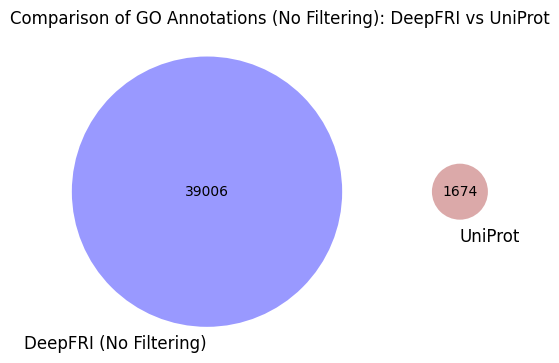

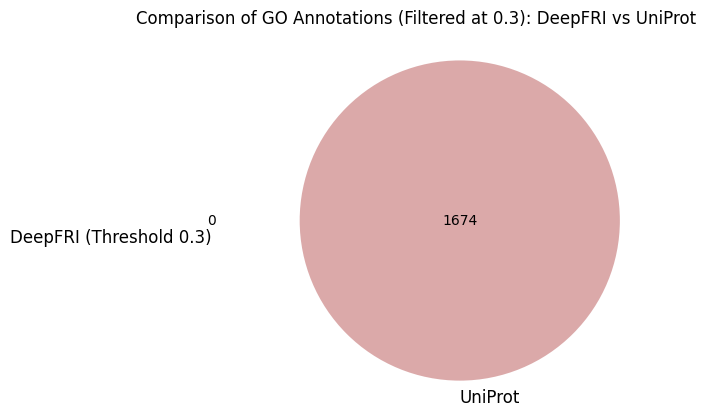

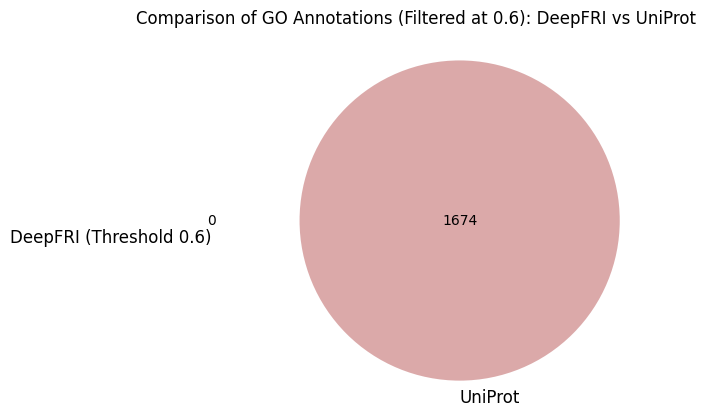

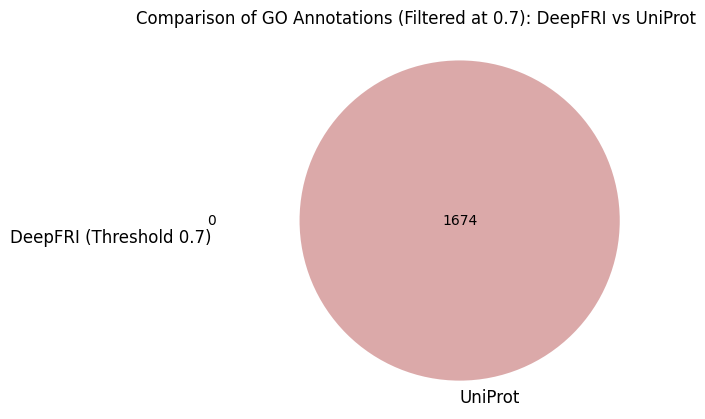

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Load datasets
bp_file = "DeepFRI_BP_predictions.csv"
cc_file = "DeepFRI_CC_predictions.csv"
mf_file = "DeepFRI_MF_predictions.csv"
uniprot_file = "uniprotkb_limnospira_indica_2025_03_03.tsv"

# Read DeepFRI datasets (Skipping metadata row)
bp_df = pd.read_csv(bp_file, skiprows=1, names=["Protein", "GO_term/EC_number", "Score"], dtype=str)
cc_df = pd.read_csv(cc_file, skiprows=1, names=["Protein", "GO_term/EC_number", "Score"], dtype=str)
mf_df = pd.read_csv(mf_file, skiprows=1,  names=["Protein", "GO_term/EC_number", "Score"], dtype=str)

# Read UniProt dataset
uniprot_df = pd.read_csv(uniprot_file, sep="\t")

# Normalize GO term formats in DeepFRI datasets
bp_df["GO_term"] = bp_df["GO_term/EC_number"].str.strip()
cc_df["GO_term"] = cc_df["GO_term/EC_number"].str.strip()
mf_df["GO_term"] = mf_df["GO_term/EC_number"].str.strip()

# Extract GO terms from UniProt, ensuring correct format
uniprot_go_terms = set()
if "Gene Ontology IDs" in uniprot_df.columns:
    for go_terms in uniprot_df["Gene Ontology IDs"].dropna():
        go_list = [go.strip() for go in go_terms.split("; ")]
        uniprot_go_terms.update(go_list)

# Ensure Score column is numeric
bp_df["Score"] = pd.to_numeric(bp_df["Score"], errors="coerce")
cc_df["Score"] = pd.to_numeric(cc_df["Score"], errors="coerce")
mf_df["Score"] = pd.to_numeric(mf_df["Score"], errors="coerce")

# Extract all GO terms from DeepFRI datasets (No Filtering)
deepfri_all_go_terms = set(bp_df["GO_term"].dropna().unique()) | \
                        set(cc_df["GO_term"].dropna().unique()) | \
                        set(mf_df["GO_term"].dropna().unique())

# Find unique and common GO terms without filtering
unique_deepfri_all = len(deepfri_all_go_terms - uniprot_go_terms)
unique_uniprot_all = len(uniprot_go_terms - deepfri_all_go_terms)
common_terms_all = len(deepfri_all_go_terms & uniprot_go_terms)

# Plot the Venn diagram without filtering
plt.figure(figsize=(6, 6))
venn2(subsets=(unique_deepfri_all, unique_uniprot_all, common_terms_all), 
      set_labels=("DeepFRI (No Filtering)", "UniProt"), set_colors=("blue", "brown"))

plt.title("Comparison of GO Annotations (No Filtering): DeepFRI vs UniProt")
plt.show()

# Define confidence thresholds
thresholds = [0.3, 0.6, 0.7]

for threshold in thresholds:
    # Filter DeepFRI datasets based on confidence score
    bp_filtered = bp_df[bp_df["Score"] >= threshold]
    cc_filtered = cc_df[cc_df["Score"] >= threshold]
    mf_filtered = mf_df[mf_df["Score"] >= threshold]

    # Extract filtered GO terms from DeepFRI datasets
    deepfri_filtered_go_terms = set(bp_filtered["GO_term"].dropna().unique()) | \
                                set(cc_filtered["GO_term"].dropna().unique()) | \
                                set(mf_filtered["GO_term"].dropna().unique())

    # Find unique and common GO terms after filtering
    unique_deepfri_filtered = len(deepfri_filtered_go_terms - uniprot_go_terms)
    unique_uniprot_filtered = len(uniprot_go_terms - deepfri_filtered_go_terms)
    common_terms_filtered = len(deepfri_filtered_go_terms & uniprot_go_terms)

    # Plot the Venn diagram for the threshold
    plt.figure(figsize=(6, 6))
    venn2(subsets=(unique_deepfri_filtered, unique_uniprot_filtered, common_terms_filtered), 
          set_labels=(f"DeepFRI (Threshold {threshold})", "UniProt"), set_colors=("blue", "brown"))

    plt.title(f"Comparison of GO Annotations (Filtered at {threshold}): DeepFRI vs UniProt")
    plt.show()


In [ ]:
bf

In [ ]:
bp_df.head()

,Protein,GO_term/EC_number,Score,GO_term
A0A9P1KHL8,GO:1901137,0.99976,NaN,0.99976
A0A9P1KHL8,GO:1903509,0.99932,NaN,0.99932
A0A9P1KHL8,GO:1901135,0.99929,NaN,0.99929
A0A9P1KHL8,GO:0016051,0.99748,NaN,0.99748
A0A9P1KHL8,GO:0005975,0.99608,NaN,0.99608


: 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the files
original_df = pd.read_csv("uniprotkb_limnospira_indica_2025_03_03.tsv", sep='\t')
results_df = pd.read_csv("results.tsv", sep='\t')

# Extract only GO IDs (skip EC numbers)
def extract_go_only(row):
    go_ids = set()
    if pd.notna(row['Gene Ontology IDs']):
        go_ids.update([x.strip() for x in row['Gene Ontology IDs'].split(';')])
    return go_ids

original_annotations = original_df[['Entry', 'Gene Ontology IDs']].copy()
original_annotations['GO_Only'] = original_annotations.apply(extract_go_only, axis=1)
entry_to_go = dict(zip(original_annotations['Entry'], original_annotations['GO_Only']))

# Group predicted annotations from results
predicted_annotations = results_df.groupby('Protein')['GO_term/EC_number'].apply(set)

# Recompute Jaccard Index based only on GO terms
jaccard_go_only_scores = []

for protein, predicted_set in predicted_annotations.items():
    actual_go_set = entry_to_go.get(protein, set())
    intersection = predicted_set & actual_go_set
    union = predicted_set | actual_go_set
    jaccard_index = len(intersection) / len(union) if union else 0.0
    jaccard_go_only_scores.append((protein, jaccard_index, len(intersection), len(union)))

# Create new DataFrame for GO-only Jaccard
jaccard_go_df = pd.DataFrame(jaccard_go_only_scores, columns=['Protein', 'Jaccard_Index_GO_Only', 'Intersection_Size', 'Union_Size'])

# Plot the GO-only Jaccard distribution
plt.figure(figsize=(10, 6))
plt.hist(jaccard_go_df['Jaccard_Index_GO_Only'], bins=30, edgecolor='black')
plt.title('Distribution of Jaccard Index (GO Terms Only)')
plt.xlabel('Jaccard Index (GO Only)')
plt.ylabel('Number of Proteins')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your files
original_df = pd.read_csv("uniprotkb_limnospira_indica_2025_03_03.tsv", sep='\t')
results_df = pd.read_csv("results.tsv", sep='\t')

# Extract only GO annotations from the UniProt file
def extract_go_only(row):
    go_ids = set()
    if pd.notna(row['Gene Ontology IDs']):
        go_ids.update([x.strip() for x in row['Gene Ontology IDs'].split(';')])
    return go_ids

original_annotations = original_df[['Entry', 'Gene Ontology IDs']].copy()
original_annotations['GO_Only'] = original_annotations.apply(extract_go_only, axis=1)
entry_to_go = dict(zip(original_annotations['Entry'], original_annotations['GO_Only']))

# Get sets of proteins
predicted_proteins = set(results_df['Protein'].unique())
annotated_in_uniprot = {entry for entry, gos in entry_to_go.items() if len(gos) > 0}
predicted_and_annotated_in_uniprot = predicted_proteins & annotated_in_uniprot
predicted_but_unannotated_in_uniprot = predicted_proteins - annotated_in_uniprot

# Counts
counts = {
    'Annotated in both': len(predicted_and_annotated_in_uniprot),
    'Only in MdeepFRI': len(predicted_but_unannotated_in_uniprot)
}

# Plot
plt.figure(figsize=(8, 5))
bars = plt.bar(counts.keys(), counts.values(), edgecolor='black')

# Add value labels
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, f'{yval}', ha='center', va='bottom', fontsize=12)

plt.title('Protein Annotation Comparison')
plt.ylabel('Number of Proteins')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Updated counts
counts = {
    'Annotated in both': 934,
    'Only in MdeepFRI': 46
}

# Create bar plot
plt.figure(figsize=(8, 5))
bars = plt.bar(counts.keys(), counts.values(), edgecolor='black')

# Add value labels above each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, f'{yval}', ha='center', va='bottom', fontsize=12)

plt.title('Protein Annotation Comparison')
plt.ylabel('Number of Proteins')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [ ]:
#%pip install goatools


  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached requests-2.32.3-py3-none-any.whl.metadata (4.6 kB)
  Using cached charset_normalizer-3.4.1-cp311-cp311-win_amd64.whl.metadata (36 kB)
  Using cached idna-3.10-py3-none-any.whl.metadata (10 kB)
  Using cached urllib3-2.3.0-py3-none-any.whl.metadata (6.5 kB)
  Using cached certifi-2025.1.31-py3-none-any.whl.metadata (2.5 kB)
   ---------------------------------------- 0.0/15.8 MB ? eta -:--:--
   - -------------------------------------- 0.5/15.8 MB 2.4 MB/s eta 0:00:07
   - -------------------------------------- 0.8/15.8 MB 2.8 MB/s eta 0:00:06
   --- ------------------------------------ 1.3/15.8 MB 2.0 MB/s eta 0:00:08
   --- ----------------------

In [3]:
import urllib.request

url = "http://purl.obolibrary.org/obo/go/go-basic.obo"
urllib.request.urlretrieve(url, "go-basic.obo")
print("Downloaded go-basic.obo")



Downloaded go-basic.obo


In [6]:
import pandas as pd
from goatools.obo_parser import GODag

# Load the TSV file
df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv", sep="\t")

# Load the GO DAG
go_dag = GODag("go-basic.obo")

# Assuming GO terms are in a column named 'GO_terms'
# and separated by semicolons (edit this if needed)
def get_parents(go_id):
    if go_id in go_dag:
        term = go_dag[go_id]
        return [parent.id for parent in term.parents]
    return []

# Add a new column with parent GO terms
df["Parent_GO_terms"] = df["GO_term/EC_number"].apply(
    lambda terms: ";".join(
        set(
            parent
            for go in terms.split(";")
            for parent in get_parents(go.strip())
        )
    )
)

# Save the result
df.to_csv("results_with_parents.tsv", sep="\t", index=False)


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms


In [1]:
# 1. Install goatools in the correct environment
#import sys
#!{sys.executable} -m pip install goatools

# 2. Import libraries
import pandas as pd
import urllib.request
from goatools.obo_parser import GODag

# 3. Load the input TSV file
df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv", sep="\t")

# 4. Filter for rows with GO terms only (those starting with "GO:")
go_only_df = df[df["GO_term/EC_number"].str.startswith("GO:")].copy()

# 5. Extract unique GO terms
unique_go_terms = set(go_only_df["GO_term/EC_number"].str.strip())

print(f"Found {len(unique_go_terms)} unique GO terms.")

# 6. Download GO ontology file (OBO format)
obo_url = "http://purl.obolibrary.org/obo/go/go-basic.obo"
obo_file = "go-basic.obo"
urllib.request.urlretrieve(obo_url, obo_file)

# 7. Load the GO DAG
go_dag = GODag(obo_file)

# 8. Function to get direct parent GO terms
def get_parents(go_id):
    if go_id in go_dag:
        return [parent.id for parent in go_dag[go_id].parents]
    return []

# 9. Map each GO term to its direct parents
go_to_parents = {
    go_id: get_parents(go_id)
    for go_id in unique_go_terms
}

# 10. Convert to a DataFrame
parent_df = pd.DataFrame([
    {"GO_term": go_id, "Parent_terms": ";".join(parents)}
    for go_id, parents in go_to_parents.items()
])

# 11. Save the result
parent_df.to_csv("go_terms_with_parents.tsv", sep="\t", index=False)
print("Saved parent GO annotations to 'go_terms_with_parents.tsv'.")

# Optional: Preview the first few rows
parent_df.head()


Found 2082 unique GO terms.
go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
Saved parent GO annotations to 'go_terms_with_parents.tsv'.


,GO_term,Parent_terms
0,GO:0006729,GO:0042559;GO:0046146;GO:0034312
1,GO:0032273,GO:0031334;GO:0032271
2,GO:0070647,GO:0043687
3,GO:0008216,GO:0006595
4,GO:0043094,GO:0009058


In [2]:
# Step 1: Install goatools in the current environment
#import sys
#!{sys.executable} -m pip install goatools

# Step 2: Import libraries
import pandas as pd
import urllib.request
from goatools.obo_parser import GODag

# Step 3: Load the input TSV file
df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/output_limnospira_uniprotkb/results.tsv", sep="\t")

# Step 4: Filter for GO terms only (skip EC numbers)
go_only_df = df[df["GO_term/EC_number"].str.startswith("GO:")].copy()

# Step 5: Download the GO hierarchy (OBO file)
obo_url = "http://purl.obolibrary.org/obo/go/go-basic.obo"
obo_file = "go-basic.obo"
urllib.request.urlretrieve(obo_url, obo_file)

# Step 6: Load the GO DAG
go_dag = GODag(obo_file)

# Step 7: Define function to get direct parent GO terms
def get_parents(go_id):
    if go_id in go_dag:
        return [parent.id for parent in go_dag[go_id].parents]
    return []

# Step 8: Add Parent_terms column to the DataFrame
go_only_df["Parent_terms"] = go_only_df["GO_term/EC_number"].map(lambda go: ";".join(get_parents(go)))

# Step 9: Save the final DataFrame
go_only_df.to_csv("results_with_parents.tsv", sep="\t", index=False)
print("✅ Done! File saved as 'results_with_parents.tsv'.")

# Optional: Preview the result
go_only_df.head()


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
✅ Done! File saved as 'results_with_parents.tsv'.


,Protein,GO_term/EC_number,Score,Annotation,Neural_net,DeepFRI_mode,DB_hit,DB_name,Identity,Parent_terms
0,A0A9P1KA40,GO:0006793,0.362413,phosphorus metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306,GO:0008152
1,A0A9P1KA40,GO:0006796,0.345974,phosphate-containing compound metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306,GO:0006793
2,A0A9P1KA40,GO:0006082,0.339020,organic acid metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306,GO:0044281
3,A0A9P1KA40,GO:0043436,0.316965,oxoacid metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306,GO:0006082
4,A0A9P1KA40,GO:0019752,0.314215,carboxylic acid metabolic process,gcn,bp,3igf_B,pdb100_230517,0.568306,GO:0043436


In [10]:
import pandas as pd

# Load the original results file
df = pd.read_csv("results_with_parents.tsv", sep="\t")

# Prepare a list to store flattened rows
expanded_rows = []

# Loop through each row and flatten GO and parent terms
for _, row in df.iterrows():
    protein = row["Protein"]
    go_term = row["GO_term/EC_number"]
    
    # Skip rows with no parent terms
    if not isinstance(row["Parent_terms"], str):
        continue

    # Split parent terms and add one row per parent
    parent_terms = [p.strip() for p in row["Parent_terms"].split(";") if p.strip()]
    for parent in parent_terms:
        expanded_rows.append({
            "Protein": protein,
            "GO_term": go_term,
            "Parent_GO_term": parent
        })

# Convert to a DataFrame
flat_df = pd.DataFrame(expanded_rows)

# Save to TSV
flat_df.to_csv("flat_results_protein_go_parent.tsv", sep="\t", index=False)
print("✅ Saved as 'flat_results_protein_go_parent.tsv'")

# Optional: Preview
flat_df.head()


✅ Saved as 'flat_results_protein_go_parent.tsv'


,Protein,GO_term,Parent_GO_term
0,A0A9P1KA40,GO:0006793,GO:0008152
1,A0A9P1KA40,GO:0006796,GO:0006793
2,A0A9P1KA40,GO:0006082,GO:0044281
3,A0A9P1KA40,GO:0043436,GO:0006082
4,A0A9P1KA40,GO:0019752,GO:0043436


In [6]:
df.head()

,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Gene Ontology (biological process),Gene Ontology (GO),Gene Ontology (cellular component),Gene Ontology (molecular function),Gene Ontology IDs,EC number,Sequence similarities,Motif
0,A0A9P1KHL8,unreviewed,A0A9P1KHL8_9CYAN,Bifunctional protein GlmU [Includes: UDP-N-ace...,glmU ARTHRO_50153,Limnospira indica PCC 8005,455,cell morphogenesis [GO:0000902]; cell wall org...,carboxysome [GO:0031470]; cytoplasm [GO:000573...,carboxysome [GO:0031470]; cytoplasm [GO:000573...,glucosamine-1-phosphate N-acetyltransferase ac...,GO:0000287; GO:0000902; GO:0003977; GO:0005737...,2.3.1.157; 2.7.7.23,SIMILARITY: In the C-terminal section; belongs...,NaN
1,A0A9P1KAZ4,unreviewed,A0A9P1KAZ4_9CYAN,Photosystem II protein D1 (PSII D1 protein) (E...,psbA2 psbA ARTHRO_10312,Limnospira indica PCC 8005,359,photosynthetic electron transport in photosyst...,photosystem II [GO:0009523]; plasma membrane-d...,photosystem II [GO:0009523]; plasma membrane-d...,chlorophyll binding [GO:0016168]; electron tra...,GO:0005506; GO:0009523; GO:0009635; GO:0009772...,1.10.3.9,SIMILARITY: Belongs to the reaction center Puf...,NaN
2,A0A9P1KCL1,unreviewed,A0A9P1KCL1_9CYAN,Coenzyme A biosynthesis bifunctional protein C...,coaBC ARTHRO_11326,Limnospira indica PCC 8005,418,coenzyme A biosynthetic process [GO:0015937]; ...,phosphopantothenoylcysteine decarboxylase comp...,phosphopantothenoylcysteine decarboxylase comp...,FMN binding [GO:0010181]; metal ion binding [G...,GO:0004632; GO:0004633; GO:0010181; GO:0015937...,4.1.1.36; 6.3.2.5,SIMILARITY: In the C-terminal section; belongs...,NaN
3,A0A9P1KF24,unreviewed,A0A9P1KF24_9CYAN,Bifunctional NAD(P)H-hydrate repair enzyme (Ni...,nnrD nnrE ARTHRO_30833,Limnospira indica PCC 8005,537,metabolite repair [GO:0110051]; nicotinamide n...,ADP-dependent NAD(P)H-hydrate dehydratase acti...,NaN,ADP-dependent NAD(P)H-hydrate dehydratase acti...,GO:0005524; GO:0016301; GO:0046496; GO:0046872...,4.2.1.136; 5.1.99.6,SIMILARITY: Belongs to the NnrD/CARKD family. ...,NaN
4,A0A9P1KGE3,unreviewed,A0A9P1KGE3_9CYAN,Bifunctional pantoate ligase/cytidylate kinase...,panC/cmk ARTHRO_40129,Limnospira indica PCC 8005,524,nucleobase-containing small molecule interconv...,cytosol [GO:0005829]; (d)CMP kinase activity [...,cytosol [GO:0005829],(d)CMP kinase activity [GO:0004127]; ATP bindi...,GO:0004127; GO:0004592; GO:0005524; GO:0005829...,2.7.4.25; 6.3.2.1,SIMILARITY: Belongs to the cytidylate kinase f...,NaN


In [7]:
# Step 1: Install goatools in the notebook's environment
#import sys
#!{sys.executable} -m pip install goatools

# Step 2: Import necessary libraries
import pandas as pd
import urllib.request
from goatools.obo_parser import GODag

# Step 3: Load your UniProtKB dataset
df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv", sep="\t")

# Step 4: Filter rows with non-null GO terms
go_ids_df = df[["Entry", "Gene Ontology IDs"]].dropna().copy()

# Step 5: Expand multiple GO terms per row into separate rows
go_ids_df = go_ids_df.assign(
    GO_term=go_ids_df["Gene Ontology IDs"].str.split("; ")
).explode("GO_term")

# Step 6: Clean whitespace and keep valid GO terms
go_ids_df["GO_term"] = go_ids_df["GO_term"].str.strip()
go_ids_df = go_ids_df[go_ids_df["GO_term"].str.startswith("GO:")]

# Step 7: Download the GO DAG (Gene Ontology hierarchy)
obo_url = "http://purl.obolibrary.org/obo/go/go-basic.obo"
obo_file = "go-basic.obo"
urllib.request.urlretrieve(obo_url, obo_file)

# Step 8: Load the GO hierarchy
go_dag = GODag(obo_file)

# Step 9: Function to get direct parent GO terms
def get_parents(go_id):
    if go_id in go_dag:
        return [parent.id for parent in go_dag[go_id].parents]
    return []

# Step 10: Map each GO term to its parents
go_ids_df["Parent_terms"] = go_ids_df["GO_term"].map(lambda go: ";".join(get_parents(go)))

# Step 11: Rename column for clarity
go_ids_df.rename(columns={"GO_term": "Gene Ontology ID"}, inplace=True)

# Step 12: Save to file
go_ids_df.to_csv("uniprot_go_terms_with_parents.tsv", sep="\t", index=False)
print("✅ Done! File saved as 'uniprot_go_terms_with_parents.tsv'.")

# Optional: Preview first few rows
go_ids_df.head()


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
✅ Done! File saved as 'uniprot_go_terms_with_parents.tsv'.


,Entry,Gene Ontology IDs,Gene Ontology ID,Parent_terms
0,A0A9P1KHL8,GO:0000287; GO:0000902; GO:0003977; GO:0005737...,GO:0000287,GO:0046872
0,A0A9P1KHL8,GO:0000287; GO:0000902; GO:0003977; GO:0005737...,GO:0000902,GO:0009653
0,A0A9P1KHL8,GO:0000287; GO:0000902; GO:0003977; GO:0005737...,GO:0003977,GO:0070569
0,A0A9P1KHL8,GO:0000287; GO:0000902; GO:0003977; GO:0005737...,GO:0005737,GO:0110165
0,A0A9P1KHL8,GO:0000287; GO:0000902; GO:0003977; GO:0005737...,GO:0006048,GO:0006047;GO:0009226;GO:0046349


In [9]:
# Step 1: Install goatools
#"import sys
#!{sys.executable} -m pip install goatools

# Step 2: Import libraries
import pandas as pd
import urllib.request
from goatools.obo_parser import GODag

# Step 3: Load dataset
df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv", sep="\t")

# Step 4: Extract GO terms (skip rows with no GO IDs)
go_ids_df = df[["Entry", "Gene Ontology IDs"]].dropna().copy()

# Step 5: Expand multiple GO terms into individual rows
go_ids_df = go_ids_df.assign(
    GO_term=go_ids_df["Gene Ontology IDs"].str.split("; ")
).explode("GO_term")

# Step 6: Clean and keep valid GO terms only
go_ids_df["GO_term"] = go_ids_df["GO_term"].str.strip()
go_ids_df = go_ids_df[go_ids_df["GO_term"].str.startswith("GO:")]

# Step 7: Download and load GO DAG
obo_url = "http://purl.obolibrary.org/obo/go/go-basic.obo"
obo_file = "go-basic.obo"
urllib.request.urlretrieve(obo_url, obo_file)

go_dag = GODag(obo_file)

# Step 8: Function to return list of parent GO terms
def get_parents(go_id):
    if go_id in go_dag:
        return [parent.id for parent in go_dag[go_id].parents]
    return []

# Step 9: Create flat list of (Entry, GO_term, Parent_term)
rows = []
for _, row in go_ids_df.iterrows():
    entry = row["Entry"]
    go_term = row["GO_term"]
    parents = get_parents(go_term)
    if not parents:
        rows.append({"Entry": entry, "Gene Ontology ID": go_term, "Parent_term": ""})
    else:
        for parent in parents:
            rows.append({"Entry": entry, "Gene Ontology ID": go_term, "Parent_term": parent})

flat_df = pd.DataFrame(rows)

# Step 10: Save to file
flat_df.to_csv("uniprot_go_terms_flat_with_parents.tsv", sep="\t", index=False)
print("✅ Done! Saved as 'uniprot_go_terms_flat_with_parents.tsv'.")

# Optional: Preview
flat_df.head()


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
✅ Done! Saved as 'uniprot_go_terms_flat_with_parents.tsv'.


,Entry,Gene Ontology ID,Parent_term
0,A0A9P1KHL8,GO:0000287,GO:0046872
1,A0A9P1KHL8,GO:0000902,GO:0009653
2,A0A9P1KHL8,GO:0003977,GO:0070569
3,A0A9P1KHL8,GO:0005737,GO:0110165
4,A0A9P1KHL8,GO:0006048,GO:0006047


In [11]:
# Step 1: Install goatools
#import sys
#!{sys.executable} -m pip install goatools

# Step 2: Import libraries
import pandas as pd
import urllib.request
from goatools.obo_parser import GODag

# Step 3: Load DeepFRI prediction files "\DeepFRI_BP_predictions.csv"
df_bp = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI-master/limnospira_predictions/DeepFRI_BP_predictions.csv")
df_cc = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI-master/limnospira_predictions/DeepFRI_CC_predictions.csv")
df_mf = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI-master/limnospira_predictions/DeepFRI_MF_predictions.csv")

# Step 4: Combine them into one DataFrame
df_all = pd.concat([df_bp, df_cc, df_mf], ignore_index=True)

# Step 5: Download and parse the GO ontology
obo_file = "go-basic.obo"
urllib.request.urlretrieve("http://purl.obolibrary.org/obo/go/go-basic.obo", obo_file)
go_dag = GODag(obo_file)

# Step 6: Define a function to get parent GO terms
def get_parents(go_id):
    if go_id in go_dag:
        return [parent.id for parent in go_dag[go_id].parents]
    return []

# Step 7: Filter to only valid GO terms
df_all = df_all[df_all["GO_term/EC_number"].astype(str).str.startswith("GO:")].copy()

# Step 8: Flatten the rows: one protein, one GO, one parent per row
flattened_rows = []

for _, row in df_all.iterrows():
    protein = row["Protein"]
    go_term = row["GO_term/EC_number"]
    
    # Get parent GO terms
    parents = get_parents(go_term)
    
    # If no parent terms, still keep the row with empty parent
    if not parents:
        flattened_rows.append({
            "Protein": protein,
            "GO_term": go_term,
            "Parent_GO_term": ""
        })
    else:
        for parent in parents:
            flattened_rows.append({
                "Protein": protein,
                "GO_term": go_term,
                "Parent_GO_term": parent
            })

# Step 9: Convert to DataFrame and save
flat_df = pd.DataFrame(flattened_rows)
flat_df.to_csv("DeepFRI_flat_with_parents.tsv", sep="\t", index=False)

print("✅ Saved as 'DeepFRI_flat_with_parents.tsv'")
flat_df.head()


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
✅ Saved as 'DeepFRI_flat_with_parents.tsv'


,Protein,GO_term,Parent_GO_term
0,A0A9P1KHL8,GO:1901137,GO:0009058
1,A0A9P1KHL8,GO:1901137,GO:1901135
2,A0A9P1KHL8,GO:1903509,GO:0006629
3,A0A9P1KHL8,GO:1903509,GO:1901135
4,A0A9P1KHL8,GO:1901135,GO:0008152


Analysis of the protein involving just the selected proteins

In [1]:
import pandas as pd
from Bio import SeqIO

# Load the dataset
file_path = "ProteinGroups-filtered-raw-log_norm-imputed.txt"
df = pd.read_csv(file_path, sep="\t")

# Extract only the UniProt ID from the UniProtId column
df["UniProtId"] = df["UniProtId"].str.extract(r'^\w+\|(\w+)\|')


# Load the dataset and extract UniProt IDs
df = pd.read_csv("ProteinGroups-filtered-raw-log_norm-imputed.txt", sep="\t")
uniprot_ids = df["UniProtId"].str.extract(r'^\w+\|(\w+)\|')[0].dropna().unique().tolist()

# Filter the FASTA file
input_fasta = "cleanedlim.fasta"
output_fasta = "filtered_proteins.fasta"

filtered_records = [
    record for record in SeqIO.parse(input_fasta, "fasta")
    if any(uid in record.id for uid in uniprot_ids)
]

# Save the filtered FASTA
SeqIO.write(filtered_records, output_fasta, "fasta")



1180

In [1]:
import os
import requests
import time
import csv

# === CONFIGURATION ===
alphafold_dir = "C:/Gilles/Users/Documents/Master_thesis"  # <-- UPDATE THIS
output_csv = "uniprot_id_mapping.csv"

# === STEP 1: Extract UniProt IDs from filenames ===
old_ids = []
for filename in os.listdir(alphafold_dir):
    if filename.startswith("AF-") and filename.endswith(".pdb"):
        uniprot_id = filename.split("-")[1]
        old_ids.append(uniprot_id)

# === STEP 2: Submit job to UniProt API ===
def submit_uniprot_mapping(ids):
    url = "https://rest.uniprot.org/idmapping/run"
    params = {
        "from": "UniProtKB_AC-ID",
        "to": "UniProtKB",
        "ids": ",".join(ids)
    }
    response = requests.post(url, data=params)
    response.raise_for_status()
    return response.json()["jobId"]

# === STEP 3: Poll for results ===
def poll_job(job_id):
    status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
    while True:
        response = requests.get(status_url)
        response.raise_for_status()
        status = response.json()
        if status["jobStatus"] == "FINISHED":
            break
        time.sleep(3)

# === STEP 4: Download results ===
def download_results(job_id):
    url = f"https://rest.uniprot.org/idmapping/uniprotkb/results/{job_id}"
    response = requests.get(url)
    response.raise_for_status()
    results = response.json()["results"]
    return {item["from"]: item["to"] for item in results}

# === Execute full mapping pipeline ===
print(f"Submitting {len(old_ids)} UniProt IDs for mapping...")
job_id = submit_uniprot_mapping(old_ids)
poll_job(job_id)
id_mapping = download_results(job_id)
print(f"Retrieved {len(id_mapping)} ID mappings.")

# === STEP 5: Save to CSV ===
with open(output_csv, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(["Old_ID", "New_ID"])
    for old_id in old_ids:
        new_id = id_mapping.get(old_id, "NOT_FOUND")
        writer.writerow([old_id, new_id])

print(f"Mapping saved to {output_csv}.")


Submitting 5677 UniProt IDs for mapping...


KeyError: 'jobStatus'

In [ ]:
import os
import shutil
import requests
import time

# === CONFIGURATION ===
npz_dir = "C:/Gilles/Users/Documents/Master_thesis"           # folder with original .npz files
output_dir = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"        # where to save renamed .npz files

os.makedirs(output_dir, exist_ok=True)

# === STEP 1: Extract old UniProt IDs from filenames ===
old_ids = []
file_map = {}  # maps old_id -> full npz path
for filename in os.listdir(npz_dir):
    if filename.startswith("AF-") and filename.endswith(".npz"):
        parts = filename.split("-")
        if len(parts) > 1:
            old_id = parts[1]
            old_ids.append(old_id)
            file_map[old_id] = os.path.join(npz_dir, filename)

# === STEP 2: UniProt mapping API ===
def submit_uniprot_mapping(ids):
    url = "https://rest.uniprot.org/idmapping/run"
    params = {
        "from": "UniProtKB_AC-ID",
        "to": "UniProtKB",
        "ids": ",".join(ids)
    }
    response = requests.post(url, data=params)
    response.raise_for_status()
    return response.json()["jobId"]

def poll_job(job_id):
    status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
    while True:
        response = requests.get(status_url)
        response.raise_for_status()
        status = response.json()
        if status["jobStatus"] == "FINISHED":
            break
        time.sleep(3)

def download_results(job_id):
    url = f"https://rest.uniprot.org/idmapping/uniprotkb/results/{job_id}"
    response = requests.get(url)
    response.raise_for_status()
    results = response.json()["results"]
    return {item["from"]: item["to"] for item in results}

# === STEP 3: Map old → new IDs ===
print(f"Submitting {len(old_ids)} UniProt IDs for mapping...")
job_id = submit_uniprot_mapping(old_ids)
poll_job(job_id)
id_mapping = download_results(job_id)
print(f"Retrieved {len(id_mapping)} mappings.")

# === STEP 4: Rename and copy files ===
not_found = []
renamed_count = 0

for old_id, old_file in file_map.items():
    new_id = id_mapping.get(old_id)
    if new_id:
        new_file = os.path.join(output_dir, f"{new_id}.npz")
        shutil.copyfile(old_file, new_file)
        renamed_count += 1
    else:
        not_found.append(old_id)

print(f"\n✅ Renamed and copied {renamed_count} files to '{output_dir}'")

if not_found:
    print(f"⚠️ Could not find updated UniProt ID for {len(not_found)} entries:")
    for missing_id in not_found[:10]:  # show first 10
        print(f"  - {missing_id}")


Submitting 0 UniProt IDs for mapping...


KeyError: 'jobStatus'

In [6]:
import os
import shutil
import requests
import time

# === CONFIGURATION ===
npz_dir = "C:/Gilles/Users/Documents/alphafold_predictions"
output_dir = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"
BATCH_SIZE = 500

os.makedirs(output_dir, exist_ok=True)

# === STEP 1: Extract old UniProt IDs from filenames ===
old_ids = []
file_map = {}
for filename in os.listdir(npz_dir):
    if filename.startswith("AF-") and filename.endswith(".npz"):
        parts = filename.split("-")
        if len(parts) > 1:
            old_id = parts[1]
            old_ids.append(old_id)
            file_map[old_id] = os.path.join(npz_dir, filename)

# === UniProt Mapping Functions ===
def submit_mapping(ids):
    url = "https://rest.uniprot.org/idmapping/run"
    params = {
        "from": "UniProtKB_AC-ID",
        "to": "UniProtKB",
        "ids": ",".join(ids)
    }
    response = requests.post(url, data=params)
    response.raise_for_status()
    return response.json()["jobId"]

def wait_for_job(job_id):
    status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
    while True:
        response = requests.get(status_url)
        response.raise_for_status()
        status = response.json()
        if status["jobStatus"] == "FINISHED":
            break
        time.sleep(3)

def fetch_results(job_id):
    url = f"https://rest.uniprot.org/idmapping/uniprotkb/results/{job_id}"
    response = requests.get(url)
    response.raise_for_status()
    results = response.json()["results"]
    return {item["from"]: item["to"] for item in results}

# === STEP 2: Process in batches ===
id_mapping = {}
for i in range(0, len(old_ids), BATCH_SIZE):
    batch = old_ids[i:i + BATCH_SIZE]
    print(f"Mapping batch {i + 1} to {i + len(batch)}...")
    try:
        job_id = submit_mapping(batch)
        wait_for_job(job_id)
        results = fetch_results(job_id)
        id_mapping.update(results)
    except Exception as e:
        print(f"⚠️ Failed to map batch {i}-{i+len(batch)}: {e}")

# === STEP 3: Rename and copy files ===
not_found = []
renamed_count = 0

for old_id, old_file in file_map.items():
    new_id = id_mapping.get(old_id)
    if new_id:
        new_file = os.path.join(output_dir, f"{new_id}.npz")
        shutil.copyfile(old_file, new_file)
        renamed_count += 1
    else:
        not_found.append(old_id)

print(f"\n✅ Renamed and copied {renamed_count} files to '{output_dir}'")

if not_found:
    print(f"\n⚠️ Could not find updated UniProt ID for {len(not_found)} entries:")
    for missing in not_found[:10]:
        print(f"  - {missing}")



✅ Renamed and copied 0 files to 'C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold'


In [8]:
import os
import shutil
import requests
import time

# === CONFIGURATION ===
pdb_dir = "C:/Gilles/Users/Documents/alphafold_predictions"
output_dir = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"
BATCH_SIZE = 500

os.makedirs(output_dir, exist_ok=True)

# === STEP 1: Extract old UniProt IDs from filenames ===
old_ids = []
file_map = {}

for filename in os.listdir(pdb_dir):
    if filename.startswith("AF-") and filename.endswith(".pdb"):
        parts = filename.split("-")
        if len(parts) > 1:
            old_id = parts[1]
            old_ids.append(old_id)
            file_map[old_id] = os.path.join(pdb_dir, filename)

# === UniProt Mapping Functions ===
def submit_mapping(ids):
    url = "https://rest.uniprot.org/idmapping/run"
    params = {
        "from": "UniProtKB_AC-ID",
        "to": "UniProtKB",
        "ids": ",".join(ids)
    }
    response = requests.post(url, data=params)
    response.raise_for_status()
    return response.json()["jobId"]

def wait_for_job(job_id, max_retries=10):
    status_url = f"https://rest.uniprot.org/idmapping/status/{job_id}"
    retries = 0
    while retries < max_retries:
        response = requests.get(status_url)
        if response.status_code != 200:
            print(f"  🔁 Waiting: status code {response.status_code}, retrying...")
            time.sleep(5)
            retries += 1
            continue

        data = response.json()
        if 'jobStatus' in data:
            if data['jobStatus'] == 'FINISHED':
                return True
            elif data['jobStatus'] in ['RUNNING', 'NEW']:
                time.sleep(3)
                retries += 1
                continue
            else:
                print(f"  ❌ Unexpected job status: {data['jobStatus']}")
                return False
        else:
            print(f"  ❌ 'jobStatus' key not in response, response was: {data}")
            return False

    print(f"  ❌ Max retries reached while waiting for job {job_id}")
    return False


def fetch_results(job_id):
    url = f"https://rest.uniprot.org/idmapping/uniprotkb/results/{job_id}"
    response = requests.get(url)
    response.raise_for_status()
    results = response.json()["results"]
    return {item["from"]: item["to"] for item in results}

# === STEP 2: Process in batches ===
id_mapping = {}
for i in range(0, len(old_ids), BATCH_SIZE):
    batch = old_ids[i:i + BATCH_SIZE]
    print(f"Mapping batch {i + 1} to {i + len(batch)}...")
    try:
        job_id = submit_mapping(batch)
        print(f"  🔄 Submitted. Waiting for job {job_id}...")
        if wait_for_job(job_id):
            results = fetch_results(job_id)
            id_mapping.update(results)
            print(f"  ✅ Batch mapped: {len(results)} entries")
        else:
            print(f"  ⚠️ Failed to complete job {job_id}")
    except Exception as e:
        print(f"⚠️ Failed to map batch {i}-{i+len(batch)}: {e}")

i
# === STEP 3: Rename and copy files ===
not_found = []
renamed_count = 0

for old_id, old_file in file_map.items():
    new_id = id_mapping.get(old_id)
    if new_id:
        new_file = os.path.join(output_dir, f"{new_id}.pdb")
        shutil.copyfile(old_file, new_file)
        renamed_count += 1
    else:
        not_found.append(old_id)

print(f"\n✅ Renamed and copied {renamed_count} files to '{output_dir}'")

if not_found:
    print(f"\n⚠️ Could not find updated UniProt ID for {len(not_found)} entries:")
    for missing in not_found[:10]:
        print(f"  - {missing}")


Mapping batch 1 to 500...
  🔄 Submitted. Waiting for job 2a2dc88344e9f834a527c306cea7d28ea4a8be85...
  ❌ 'jobStatus' key not in response, response was: {'results': [{'from': 'G9BMY6', 'to': {'entryType': 'UniProtKB unreviewed (TrEMBL)', 'primaryAccession': 'G9BMY6', 'uniProtkbId': 'G9BMY6_9CYAN', 'entryAudit': {'firstPublicDate': '2012-02-22', 'lastAnnotationUpdateDate': '2025-02-05', 'lastSequenceUpdateDate': '2012-02-22', 'entryVersion': 53, 'sequenceVersion': 1}, 'annotationScore': 2.0, 'organism': {'scientificName': 'Limnospira indica PCC 8005', 'taxonId': 376219, 'evidences': [{'evidenceCode': 'ECO:0000313', 'source': 'EMBL', 'id': 'AET14647.1'}], 'lineage': ['Bacteria', 'Bacillati', 'Cyanobacteriota', 'Cyanophyceae', 'Oscillatoriophycideae', 'Oscillatoriales', 'Sirenicapillariaceae', 'Limnospira']}, 'proteinExistence': '3: Inferred from homology', 'proteinDescription': {'recommendedName': {'fullName': {'evidences': [{'evidenceCode': 'ECO:0000256', 'source': 'HAMAP-Rule', 'id': 'M

In [9]:
test_ids = ["H1W5W9", "G9BN14", "G9BN15", "G9BN16"]
job_id = submit_mapping(test_ids)
if wait_for_job(job_id):
    results = fetch_results(job_id)
    print(results)


  ❌ 'jobStatus' key not in response, response was: {'results': [{'from': 'H1W5W9', 'to': {'entryType': 'Inactive', 'primaryAccession': 'H1W5W9', 'uniProtkbId': 'H1W5W9_9CYAN', 'annotationScore': 0.0, 'inactiveReason': {'inactiveReasonType': 'DELETED', 'deletedReason': 'Deleted from sequence source (EMBL)'}, 'extraAttributes': {'uniParcId': 'UPI0001E2A89A'}}}, {'from': 'G9BN14', 'to': {'entryType': 'UniProtKB unreviewed (TrEMBL)', 'primaryAccession': 'G9BN14', 'uniProtkbId': 'G9BN14_9CYAN', 'entryAudit': {'firstPublicDate': '2012-02-22', 'lastAnnotationUpdateDate': '2025-02-05', 'lastSequenceUpdateDate': '2012-02-22', 'entryVersion': 30, 'sequenceVersion': 1}, 'annotationScore': 1.0, 'organism': {'scientificName': 'Limnospira indica PCC 8005', 'taxonId': 376219, 'evidences': [{'evidenceCode': 'ECO:0000313', 'source': 'EMBL', 'id': 'AET14675.1'}], 'lineage': ['Bacteria', 'Bacillati', 'Cyanobacteriota', 'Cyanophyceae', 'Oscillatoriophycideae', 'Oscillatoriales', 'Sirenicapillariaceae', 'L

In [11]:
import os
import shutil
import requests
import time

# === CONFIGURATION ===
pdb_dir = "C:/Gilles/Users/Documents/alphafold_predictions"
output_dir = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"
os.makedirs(output_dir, exist_ok=True)

# === STEP 1: Extract old UniProt IDs from AlphaFold file names ===
old_ids = []
file_map = {}

for filename in os.listdir(pdb_dir):
    if filename.startswith("AF-") and filename.endswith(".pdb"):
        parts = filename.split("-")
        if len(parts) > 1:
            old_id = parts[1]
            old_ids.append(old_id)
            file_map[old_id] = os.path.join(pdb_dir, filename)

# === STEP 2: Query UniParc for each ID ===
def query_uniparc(old_id):
    url = f"https://rest.uniprot.org/uniparc/search?query=uniprot:{old_id}&format=json"
    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()

        if 'results' not in data or len(data['results']) == 0:
            return None

        # Look through all cross-references to find a current UniProtKB ID
        for result in data["results"]:
            for xref in result.get("uniParcCrossReferences", []):
                if xref.get("database") == "UniProtKB" and not xref.get("inactive", False):
                    return xref.get("id")  # This is the updated UniProt ID
    except Exception as e:
        print(f"  ⚠️ Error querying UniParc for {old_id}: {e}")
    return None

# === STEP 3: Process and rename files ===
id_mapping = {}
not_found = []
renamed = 0

for old_id in old_ids:
    new_id = query_uniparc(old_id)
    if new_id:
        id_mapping[old_id] = new_id
        old_file = file_map[old_id]
        new_file = os.path.join(output_dir, f"{new_id}.pdb")
        shutil.copyfile(old_file, new_file)
        renamed += 1
    else:
        not_found.append(old_id)

# === STEP 4: Summary ===
print(f"\n✅ Renamed and copied {renamed} files to '{output_dir}'")

if not_found:
    print(f"⚠️ Could not resolve {len(not_found)} IDs via UniParc:")
    for missing in not_found[:10]:
        print(f"  - {missing}")


  ⚠️ Error querying UniParc for G9BMY6: 400 Client Error: Bad Request for url: https://rest.uniprot.org/uniparc/search?query=uniprot:G9BMY6&format=json
  ⚠️ Error querying UniParc for G9BMZ1: 400 Client Error: Bad Request for url: https://rest.uniprot.org/uniparc/search?query=uniprot:G9BMZ1&format=json
  ⚠️ Error querying UniParc for G9BMZ2: 400 Client Error: Bad Request for url: https://rest.uniprot.org/uniparc/search?query=uniprot:G9BMZ2&format=json
  ⚠️ Error querying UniParc for G9BMZ3: 400 Client Error: Bad Request for url: https://rest.uniprot.org/uniparc/search?query=uniprot:G9BMZ3&format=json
  ⚠️ Error querying UniParc for G9BN11: 400 Client Error: Bad Request for url: https://rest.uniprot.org/uniparc/search?query=uniprot:G9BN11&format=json
  ⚠️ Error querying UniParc for G9BN13: 400 Client Error: Bad Request for url: https://rest.uniprot.org/uniparc/search?query=uniprot:G9BN13&format=json
  ⚠️ Error querying UniParc for G9BN14: 400 Client Error: Bad Request for url: https://r

In [14]:
import os
import shutil
import requests

# === CONFIGURATION ===
input_dir = "C:/Gilles/Users/Documents/alphafold_predictions"  # Change to your folder with AlphaFold PDBs
output_dir = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"
mapping_log = os.path.join(output_dir, "id_mapping_log.txt")
unmapped_log = os.path.join(output_dir, "unmapped_ids.txt")

os.makedirs(output_dir, exist_ok=True)

# === STEP 1: Extract old UniProt IDs from AlphaFold .pdb filenames ===
old_ids = []
file_map = {}

for filename in os.listdir(input_dir):
    if filename.startswith("AF-") and filename.endswith(".pdb"):
        parts = filename.split("-")
        if len(parts) > 1:
            old_id = parts[1]
            old_ids.append(old_id)
            file_map[old_id] = os.path.join(input_dir, filename)

print(f"🔍 Found {len(old_ids)} AlphaFold PDB files.")

# === STEP 2: Query UniParc API for updated UniProt ID ===
def query_uniparc_for_active_uniprot(old_id):
    url = f"https://rest.uniprot.org/uniparc/search?query={old_id}&format=json"
    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()

        if 'results' not in data or not data['results']:
            return None

        accessions = data['results'][0].get("uniProtKBAccessions", [])
        if accessions:
            # Prefer any accession that doesn't start with the old ID (i.e., not H1W5W9.1)
            for acc in accessions:
                if not acc.startswith(old_id):
                    return acc
            return accessions[0]  # fallback to any
    except Exception as e:
        print(f"  ⚠️ Error querying UniParc for {old_id}: {e}")
    return None

# === STEP 3: Resolve IDs and rename files ===
id_mapping = {}
not_found = []
renamed = 0

for old_id in old_ids:
    new_id = query_uniparc_for_active_uniprot(old_id)
    if new_id:
        old_file = file_map[old_id]
        new_file = os.path.join(output_dir, f"{new_id}.pdb")
        shutil.copyfile(old_file, new_file)
        id_mapping[old_id] = new_id
        renamed += 1
        print(f"  ✅ {old_id} → {new_id}")
    else:
        not_found.append(old_id)
        print(f"  ❌ No active UniProtKB ID found for {old_id}")

# === STEP 4: Write mapping and unmapped logs ===
with open(mapping_log, "w") as map_file:
    for old_id, new_id in id_mapping.items():
        map_file.write(f"{old_id}\t{new_id}\n")

with open(unmapped_log, "w") as fail_file:
    for old_id in not_found:
        fail_file.write(f"{old_id}\n")

# === DONE ===
print(f"\n✅ Completed: {renamed} files renamed and copied to: {output_dir}")
print(f"📄 Mapping log saved to: {mapping_log}")
print(f"⚠️ {len(not_found)} IDs could not be mapped (see {unmapped_log})")


🔍 Found 5677 AlphaFold PDB files.
  ✅ G9BMY6 → A7XMG7
  ✅ G9BMZ1 → A0A3Q8G5F2
  ✅ G9BMZ2 → W6SN87.1
  ✅ G9BMZ3 → B5W9E3
  ✅ G9BN11 → A0A9J7B8Y6.1
  ✅ G9BN13 → G9BN13
  ✅ G9BN14 → G9BN14
  ✅ G9BN15 → W6S9X2.1
  ✅ G9BN16 → G9BN16
  ✅ H1W5W9 → A0A9P1KGR4
  ✅ H1W5X0 → A0A328VC44.1
  ✅ H1W5X1 → A0A9P1KGG5
  ✅ H1W5X2 → A0A9J7B906.1
  ✅ H1W5X3 → W6SE02.1
  ✅ H1W5X4 → A0A9P1KHX9
  ✅ H1W5X5 → W6SAL8.1
  ✅ H1W5X6 → W6SIJ5.1
  ✅ H1W5X7 → W6SBF2.1
  ✅ H1W5X8 → A0A9P1NZ45
  ✅ H1W5X9 → K1X2T9.1
  ✅ H1W5Y0 → A0A9P1KFH5
  ✅ H1W5Y1 → A0A7G7VNX9.1
  ✅ H1W5Y2 → W6SBF5.1
  ✅ H1W5Y3 → A0A9P1KHD6
  ✅ H1W5Y4 → A0A9P1KGS2
  ✅ H1W5Y5 → A0A9P1KGG8
  ✅ H1W5Y6 → A0A9P1KGH6
  ✅ H1W5Y7 → W6SBF8.1
  ✅ H1W5Y8 → A0A9P1KGK2
  ✅ H1W5Y9 → A0A9J7B4P2.1
  ✅ H1W5Z0 → A0A9P1NZF2
  ✅ H1W5Z1 → W6SIK6.1
  ✅ H1W5Z2 → W6SBG3.1
  ✅ H1W5Z3 → W6SE19.1
  ✅ H1W5Z4 → A0A9P1P1F0
  ✅ H1W5Z5 → B5W9F3
  ✅ H1W5Z6 → A0A9P1KH34
  ✅ H1W5Z7 → A0A9P1KHS0
  ✅ H1W5Z8 → A0A9P1KHE6
  ✅ H1W5Z9 → K1W5E8.1
  ✅ H1W600 → W6SAP0.1
  ✅ H1W601 → A0A9W3ZR05.

In [15]:
#removing the .1 in the renamed files
import os

# === CONFIGURATION ===
folder = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"  # path to renamed .pdb files

renamed_count = 0

for filename in os.listdir(folder):
    if filename.endswith(".pdb") and '.' in filename:
        name_part = filename[:-4]  # remove .pdb
        if name_part.count('.') == 1:
            base_id = name_part.split('.')[0]  # remove .1 or .2 etc.
            new_filename = f"{base_id}.pdb"
            old_path = os.path.join(folder, filename)
            new_path = os.path.join(folder, new_filename)

            if not os.path.exists(new_path):  # avoid overwrite
                os.rename(old_path, new_path)
                renamed_count += 1
                print(f"✅ Renamed: {filename} → {new_filename}")
            else:
                print(f"⚠️ Skipped (already exists): {new_filename}")

print(f"\n🎉 Done! {renamed_count} files were renamed in: {folder}")


⚠️ Skipped (already exists): A0A067RMV8.pdb
⚠️ Skipped (already exists): A0A067RRI7.pdb
⚠️ Skipped (already exists): A0A067RU63.pdb
⚠️ Skipped (already exists): A0A067RUM5.pdb
⚠️ Skipped (already exists): A0A067RV74.pdb
⚠️ Skipped (already exists): A0A067RVK7.pdb
⚠️ Skipped (already exists): A0A067RYA7.pdb
⚠️ Skipped (already exists): A0A067RYF7.pdb
⚠️ Skipped (already exists): A0A067RZK1.pdb
⚠️ Skipped (already exists): A0A067S141.pdb
⚠️ Skipped (already exists): A0A067S1N4.pdb
⚠️ Skipped (already exists): A0A067S426.pdb
⚠️ Skipped (already exists): A0A067S434.pdb
⚠️ Skipped (already exists): A0A067S7D4.pdb
⚠️ Skipped (already exists): A0A067S8Z1.pdb
⚠️ Skipped (already exists): A0A067SA95.pdb
⚠️ Skipped (already exists): A0A143CW93.pdb
⚠️ Skipped (already exists): A0A143CWC3.pdb
⚠️ Skipped (already exists): A0A143CWD0.pdb
⚠️ Skipped (already exists): A0A143CX25.pdb
⚠️ Skipped (already exists): A0A143CXH6.pdb
⚠️ Skipped (already exists): A0A143CYT9.pdb
⚠️ Skipped (already exists): A0A

In [16]:
import os
import shutil
from Bio import SeqIO

# === CONFIGURATION ===
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/filtered_proteins.fasta"
pdb_folder = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"
output_folder = "C:/Users/Gilles/Documents/Master_thesis/matched_pdbs"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# === STEP 1: Parse FASTA headers to get protein IDs ===
fasta_ids = set()
with open(fasta_file, "r") as fasta_handle:
    for record in SeqIO.parse(fasta_handle, "fasta"):
        fasta_ids.add(record.id.strip())

# === STEP 2: Copy matching PDB files ===
matched_count = 0

for filename in os.listdir(pdb_folder):
    if filename.endswith(".pdb"):
        pdb_id = filename.replace(".pdb", "")
        if pdb_id in fasta_ids:
            src = os.path.join(pdb_folder, filename)
            dst = os.path.join(output_folder, filename)
            shutil.copyfile(src, dst)
            matched_count += 1

print(f"\n✅ Total matched .pdb files: {matched_count}")
print(f"📂 Copied to folder: {output_folder}")



✅ Total matched .pdb files: 342
📂 Copied to folder: C:/Users/Gilles/Documents/Master_thesis/matched_pdbs


In [1]:
import pandas as pd

df = pd.read_csv("results_P1.tsv", sep="\t", header=None)
df.columns = ["Peptide_ID", "Protein_ID", "E_value", "BitScore", "AlignmentLen", "Identities", "Positives", "Gaps", "QueryStart", "QueryEnd", "TargetStart", "TargetEnd"]



In [ ]:
# Optional: filter
filtered = df[df["BitScore"] > 50]

# Save filtered
filtered.to_csv("filtered_results_P1.tsv", sep="\t", index=False)

In [2]:
df.head()

,Peptide_ID,Protein_ID,E_value,BitScore,AlignmentLen,Identities,Positives,Gaps,QueryStart,QueryEnd,TargetStart,TargetEnd
0,P1_505155,A0A9P1KM56,0.680,20,6,0,2,21,609,627,0.000935,30
1,P1_275141,A0A9P1KE29,0.548,30,13,0,1,30,50,79,0.000048,34
2,P1_462469,A0A9P1KKL0,1.000,13,0,0,3,15,554,566,0.000173,32
3,P1_532423,A0A9P1KHH0,0.625,23,8,0,1,23,156,177,0.000406,31
4,P1_466088,A0A9P1KE29,0.511,31,15,0,1,31,49,79,0.000184,33


In [3]:
import pandas as pd

df_p3 = pd.read_csv("results_P3.tsv", sep="\t", header=None)
df_p3.columns = ["Peptide_ID", "Protein_ID", "E_value", "BitScore", "AlignmentLen", "Identities", "Positives", "Gaps", "QueryStart", "QueryEnd", "TargetStart", "TargetEnd"]



In [4]:
df_p3.head()

,Peptide_ID,Protein_ID,E_value,BitScore,AlignmentLen,Identities,Positives,Gaps,QueryStart,QueryEnd,TargetStart,TargetEnd
0,P3_593472,A0A9P1KBV0,0.906,15,1,0,6,20,96,110,0.000525,31
1,P3_759424,A0A4Y5T2P3,0.942,15,1,0,3,17,3,17,0.000144,32
2,P3_759424,A0A9P1KE29,0.942,15,1,0,3,17,3,17,0.000144,32
3,P3_570891,A0A9P1KDH5,0.666,22,6,0,2,23,17,36,0.000214,32
4,P3_360749,A0A9P1KBV0,0.656,23,7,0,1,22,91,113,0.000105,33


In [5]:
# Load MMseqs2 results
cols = ["Peptide_ID", "Protein_ID", "E_value", "BitScore", "AlignmentLen", "Identities", "Positives", "Gaps", "QueryStart", "QueryEnd", "TargetStart", "TargetEnd"]

p1_hits = pd.read_csv("results_P1.tsv", sep="\t", names=cols)
p3_hits = pd.read_csv("results_P3.tsv", sep="\t", names=cols)

# Optional: Filter by bit score or identity
p1_filtered = p1_hits[p1_hits["BitScore"] > 50]
p3_filtered = p3_hits[p3_hits["BitScore"] > 50]

# Save filtered results
p1_filtered.to_csv("filtered_results_P1.tsv", sep="\t", index=False)
p3_filtered.to_csv("filtered_results_P3.tsv", sep="\t", index=False)

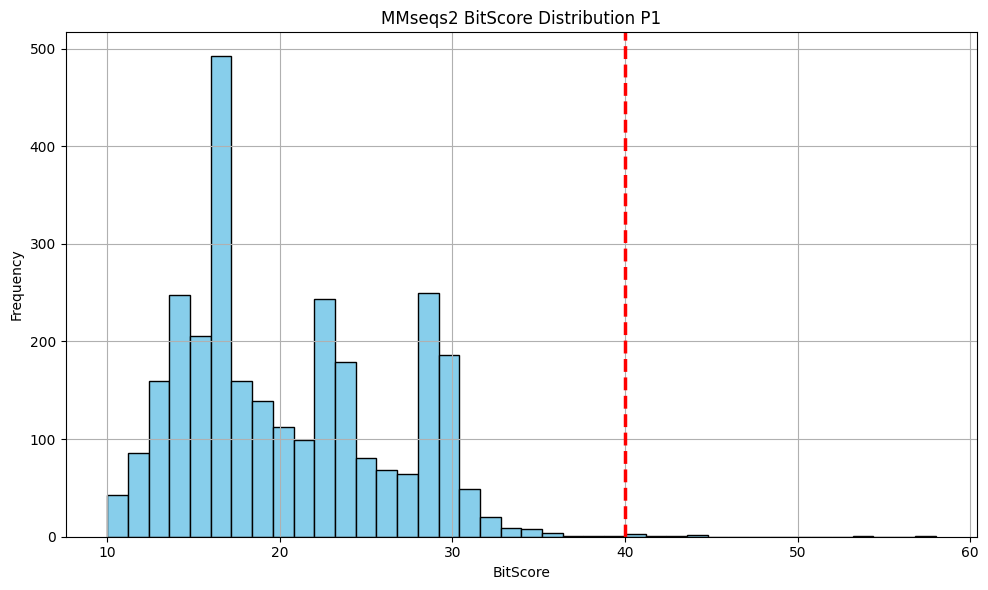

In [45]:

plt.figure(figsize=(10, 6))
plt.hist(p1_hits["BitScore"], bins=40, color="skyblue", edgecolor="black")
plt.axvline(x=40, color='red', linewidth=2.5, linestyle='--', label='BitScore = 40')
plt.title("MMseqs2 BitScore Distribution P1")
plt.xlabel("BitScore")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

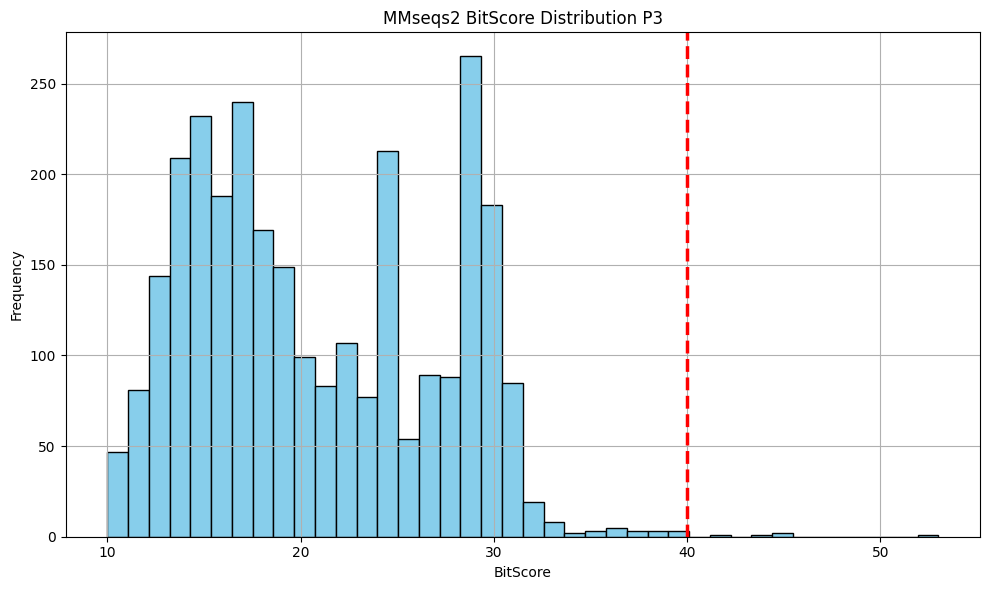

In [44]:
plt.figure(figsize=(10, 6))
plt.hist(p3_hits["BitScore"], bins=40, color="skyblue", edgecolor="black")
plt.axvline(x=40, color='red', linewidth=2.5, linestyle='--', label='BitScore = 40')
plt.title("MMseqs2 BitScore Distribution P3")
plt.xlabel("BitScore")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

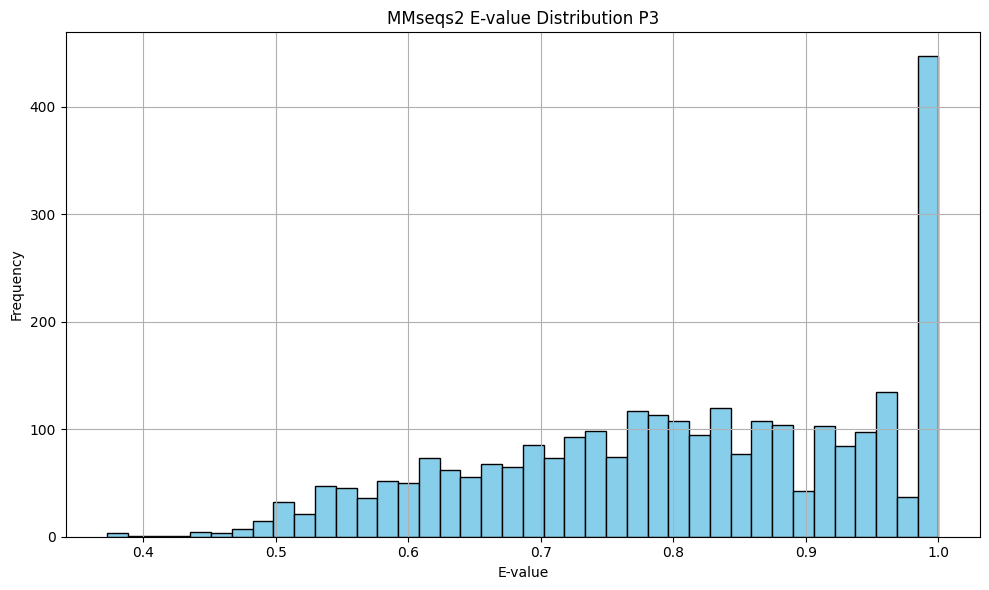

In [28]:
plt.figure(figsize=(10, 6))
plt.hist(p3_hits["E_value"], bins=40, color="skyblue", edgecolor="black")
plt.title("MMseqs2 E-value Distribution P3")
plt.xlabel("E-value")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

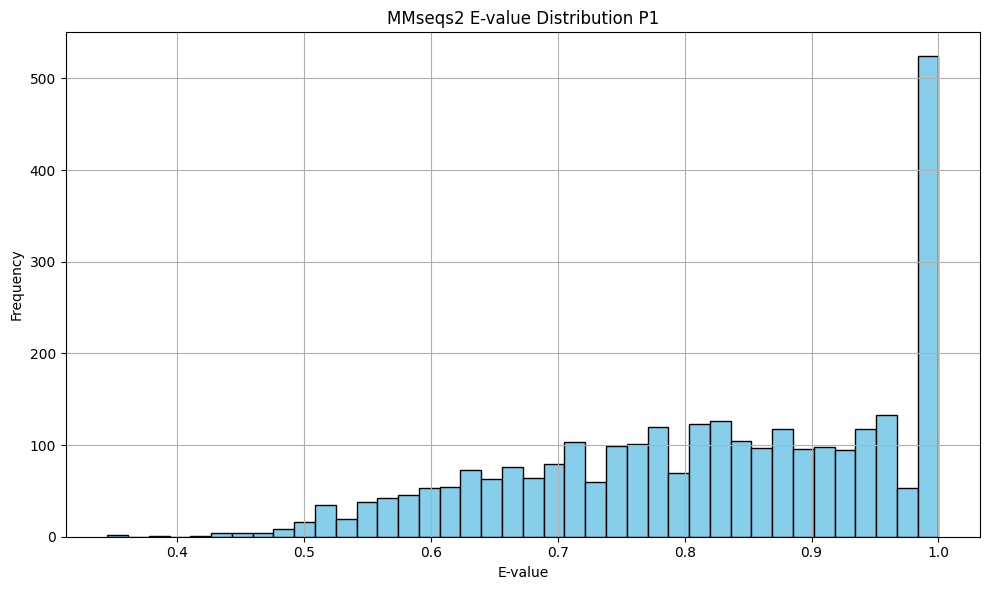

In [29]:
plt.figure(figsize=(10, 6))
plt.hist(p1_hits["E_value"], bins=40, color="skyblue", edgecolor="black")
plt.title("MMseqs2 E-value Distribution P1")
plt.xlabel("E-value")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

In [9]:
p1_hits.shape, p3_hits.shape

((2917, 12), (2853, 12))

In [33]:
#blastp results
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np  
import os
columns = [
    "qseqid", "sseqid", "pident", "length", "mismatch", "gapopen",
    "qstart", "qend", "sstart", "send", "evalue", "bitscore"
]
df_p1 = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/blastp_P1_results.tsv", sep="\t", names=columns)
df_p1.head()

,qseqid,sseqid,pident,length,mismatch,gapopen,qstart,qend,sstart,send,evalue,bitscore
0,P1_1295,A0A9J7BC40,70.37,27,8,0,6,32,53,79,6.470000e-08,40.4
1,P1_1778,H1WBF5,100.00,22,0,0,5,26,43,64,1.620000e-10,47.8
2,P1_1778,H1WAQ6,100.00,22,0,0,5,26,97,118,2.190000e-10,47.4
3,P1_1778,W6SK27,100.00,22,0,0,5,26,133,154,2.290000e-10,47.4
4,P1_1778,W6S3A5,100.00,22,0,0,5,26,125,146,2.360000e-10,47.4


In [19]:
columns = [
    "qseqid", "sseqid", "pident", "length", "mismatch", "gapopen",
    "qstart", "qend", "sstart", "send", "evalue", "bitscore"
]
df_p3 = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/blastp_P1_results.tsv", sep="\t", names=columns)
df_p3.head()
df_p3.to_csv("C:/Users/Gilles/Documents/Master_thesis/blastp_P3_results.tsv", sep="\t", index=False)
df_p3.head()    
df_p1 = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/blastp_P1_results.tsv", sep="\t", names=columns)

df_p1.head()
df_p1.to_csv("C:/Users/Gilles/Documents/Master_thesis/blastp_P1_results.tsv", sep="\t", index=False)

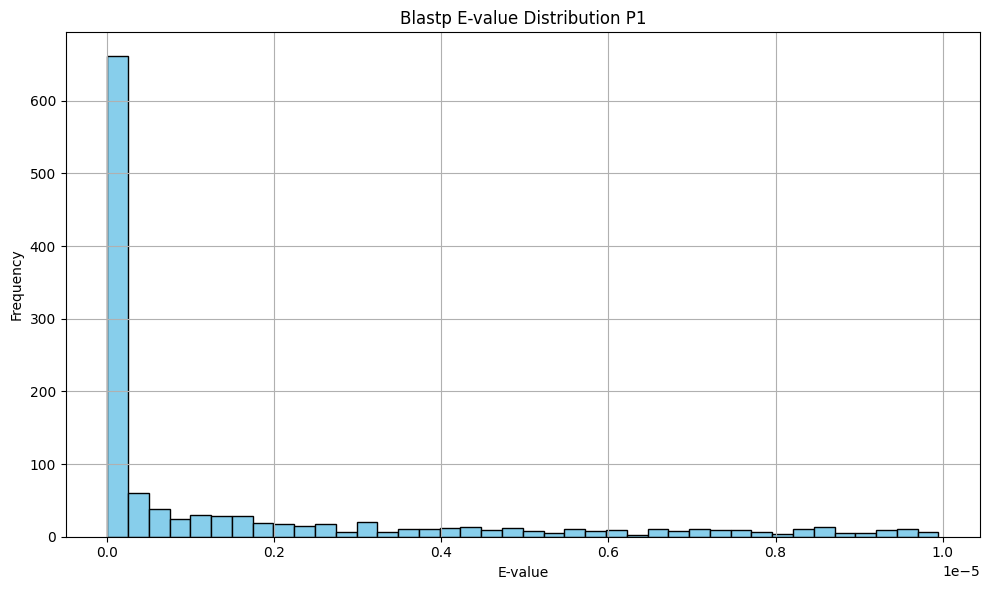

In [35]:
plt.figure(figsize=(10, 6))
plt.hist(df_p1["evalue"], bins=40, color="skyblue", edgecolor="black")
plt.title("Blastp E-value Distribution P1")
plt.xlabel("E-value")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

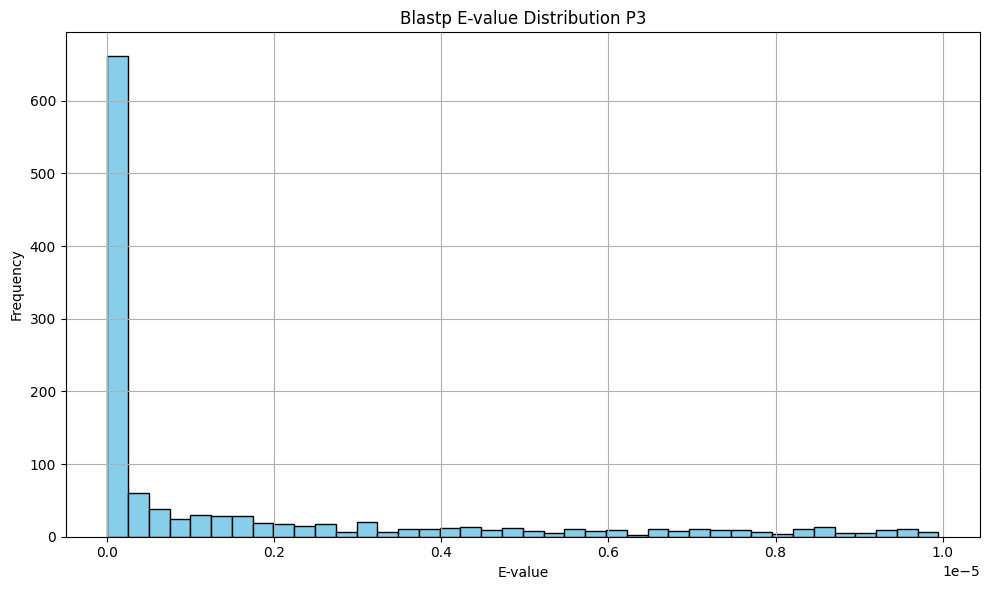

In [37]:
plt.figure(figsize=(10, 6))
plt.hist(df_p3["evalue"], bins=40, color="skyblue", edgecolor="black")
plt.title("Blastp E-value Distribution P3")
plt.xlabel("E-value")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

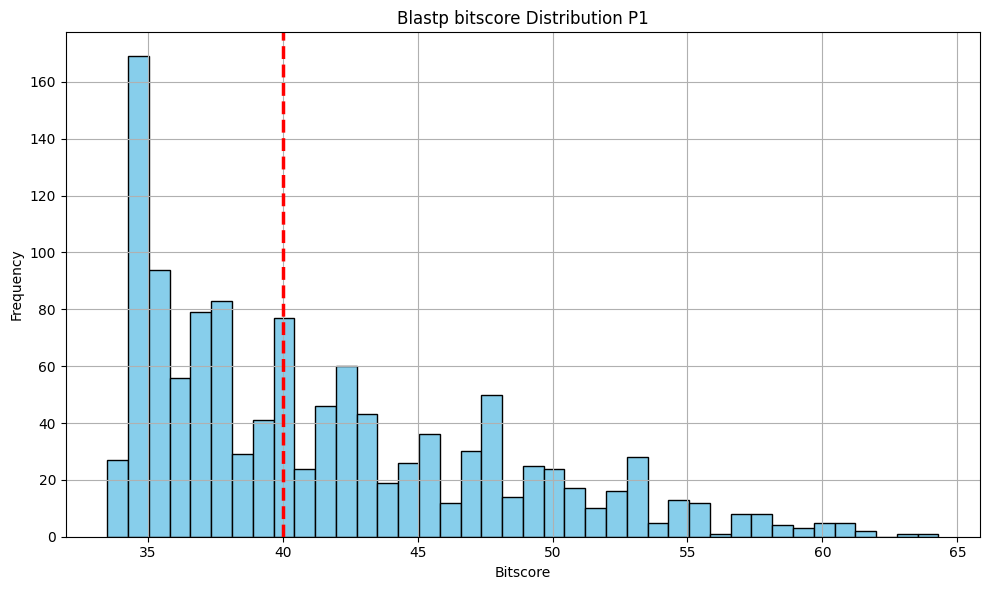

In [42]:
plt.figure(figsize=(10, 6))
plt.hist(df_p1["bitscore"], bins=40, color="skyblue", edgecolor="black")
plt.axvline(x=40, color='red', linewidth=2.5, linestyle='--', label='BitScore = 40')
plt.title("Blastp bitscore Distribution P1")
plt.xlabel("Bitscore")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

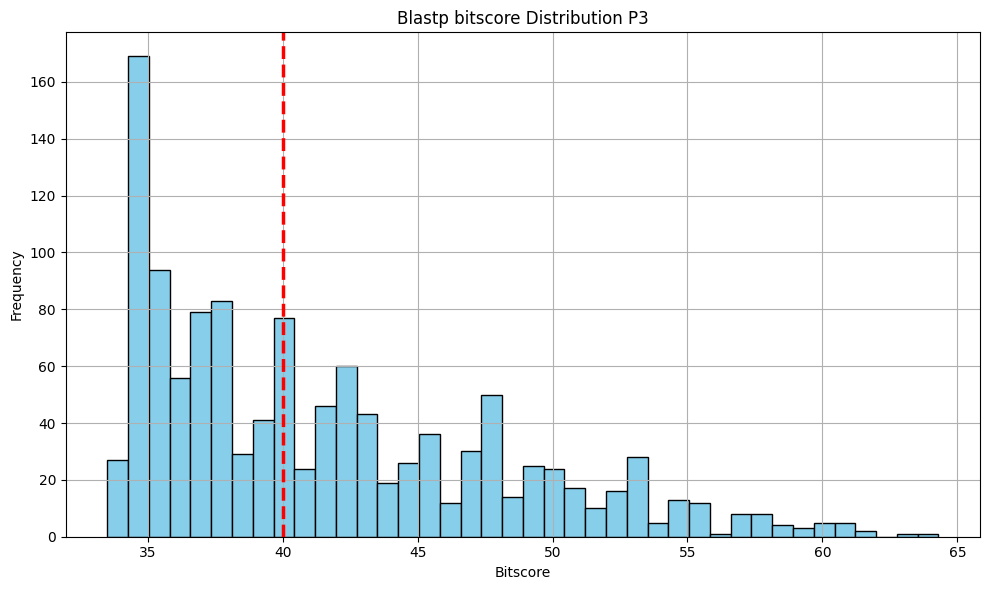

In [43]:
plt.figure(figsize=(10, 6))
plt.hist(df_p3["bitscore"], bins=40, color="skyblue", edgecolor="black")
plt.axvline(x=40, color='red', linewidth=2.5, linestyle='--', label='BitScore = 40')
plt.title("Blastp bitscore Distribution P3")
plt.xlabel("Bitscore")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import os
import shutil
from Bio import SeqIO

# === CONFIGURATION ===
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/filtered_proteins.fasta"
pdb_folder = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"
output_folder = "C:/Users/Gilles/Documents/Master_thesis/matched_pdbs"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# === STEP 1: Parse FASTA headers to get protein IDs ===
fasta_ids = set()
with open(fasta_file, "r") as fasta_handle:
    for record in SeqIO.parse(fasta_handle, "fasta"):
        fasta_ids.add(record.id.strip())

# === STEP 2: Copy matching PDB files ===
matched_count = 0

for filename in os.listdir(pdb_folder):
    if filename.endswith(".pdb"):
        pdb_id = filename.replace(".pdb", "")
        if pdb_id in fasta_ids:
            src = os.path.join(pdb_folder, filename)
            dst = os.path.join(output_folder, filename)
            shutil.copyfile(src, dst)
            matched_count += 1

print(f"\n✅ Total matched .pdb files: {matched_count}")
print(f"📂 Copied to folder: {output_folder}")

In [18]:
#resutls for diamon

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

columns = ["Query", "Target", "Identity", "Length", "Mismatches", "Gaps",
             "Qstart", "Qend", "Sstart", "Send", "Evalue", "Bitscore"]
df_p1_diamond = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/diamond_P1.tsv", sep="\t", names=columns)
df_p1_diamond.head()
df_p1_diamond.to_csv("C:/Users/Gilles/Documents/Master_thesis/diamond_P1.tsv", sep="\t", index=False)
df_p3_diamond = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/diamond_P3.tsv", sep="\t", names=columns)
df_p3_diamond.head()
df_p3_diamond.to_csv ("C:/Users/Gilles/Documents/Master_thesis/diamond_P3.tsv", sep="\t", index=False)

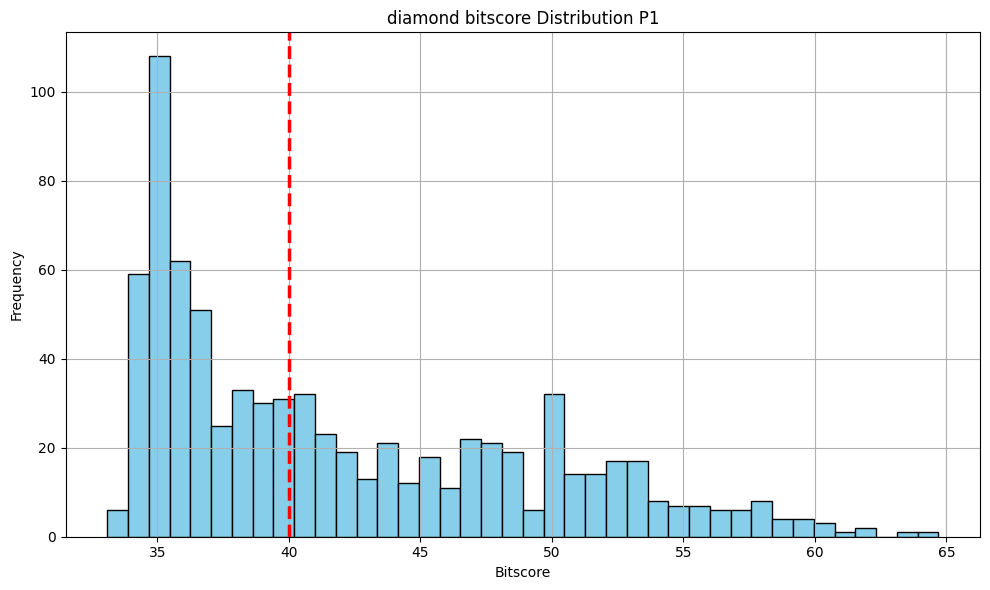

In [50]:
plt.figure(figsize=(10, 6))
plt.hist(df_p1_diamond["Bitscore"], bins=40, color="skyblue", edgecolor="black")
plt.axvline(x=40, color='red', linewidth=2.5, linestyle='--', label='BitScore = 40')
plt.title("diamond bitscore Distribution P1")
plt.xlabel("Bitscore")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

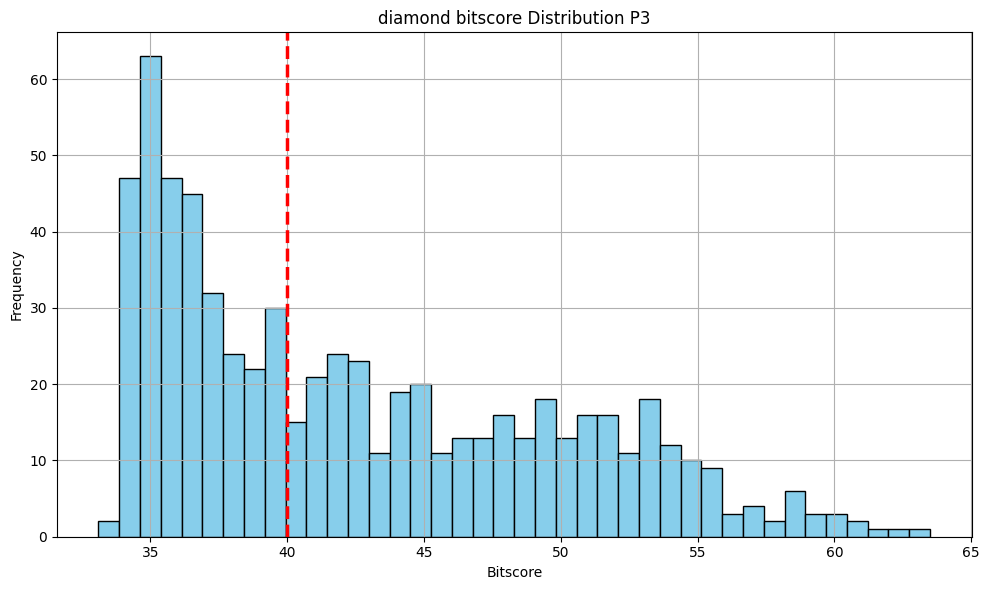

In [52]:
df_p3_diamond = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/diamond_P3.tsv", sep="\t", names=columns)
df_p3_diamond.head()
plt.figure(figsize=(10, 6))
plt.hist(df_p3_diamond["Bitscore"], bins=40, color="skyblue", edgecolor="black")
plt.axvline(x=40, color='red', linewidth=2.5, linestyle='--', label='BitScore = 40')
plt.title("diamond bitscore Distribution P3")
plt.xlabel("Bitscore")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

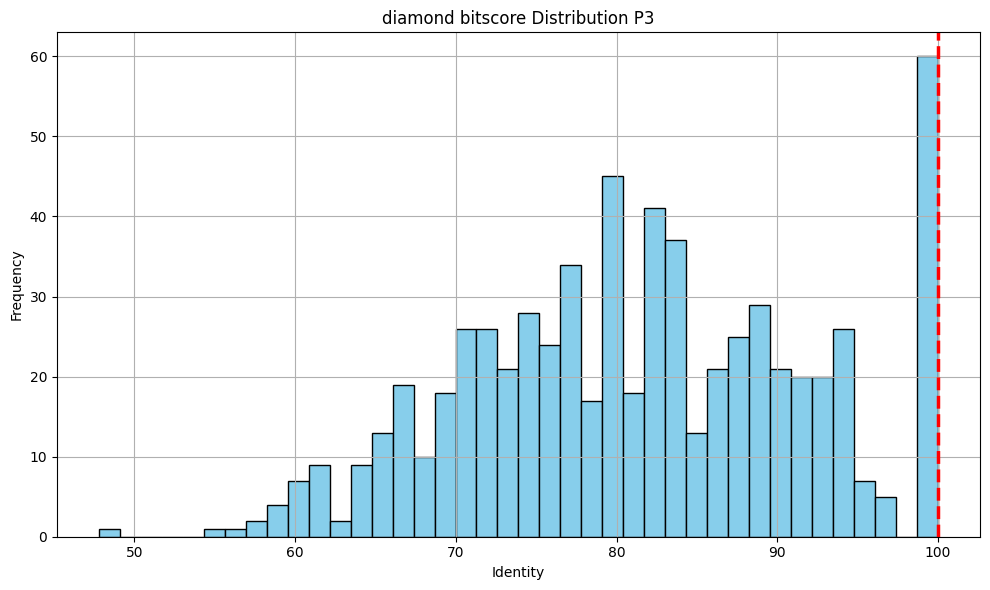

In [53]:
plt.figure(figsize=(10, 6))
plt.hist(df_p3_diamond["Identity"], bins=40, color="skyblue", edgecolor="black")
plt.axvline(x=100, color='red', linewidth=2.5, linestyle='--', label='identity = 100')
plt.title("diamond bitscore Distribution P3")
plt.xlabel("Identity")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

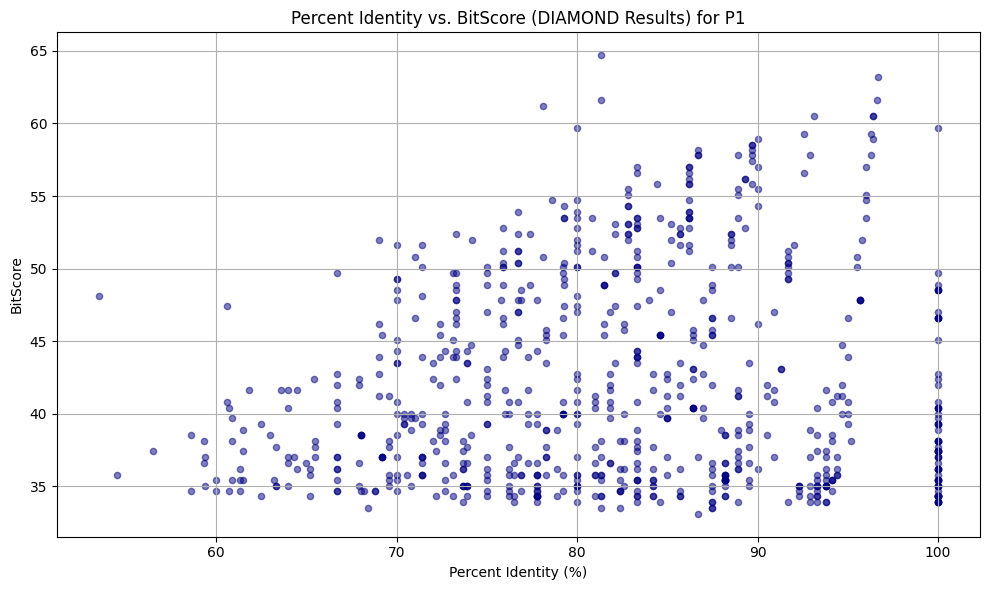

In [55]:
# === Scatter Plot: Identity vs. BitScore ===
plt.figure(figsize=(10, 6))
plt.scatter(df_p1_diamond["Identity"], df_p1_diamond["Bitscore"], alpha=0.5, s=20, color="navy")

plt.title("Percent Identity vs. BitScore (DIAMOND Results) for P1")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.tight_layout()
plt.show()

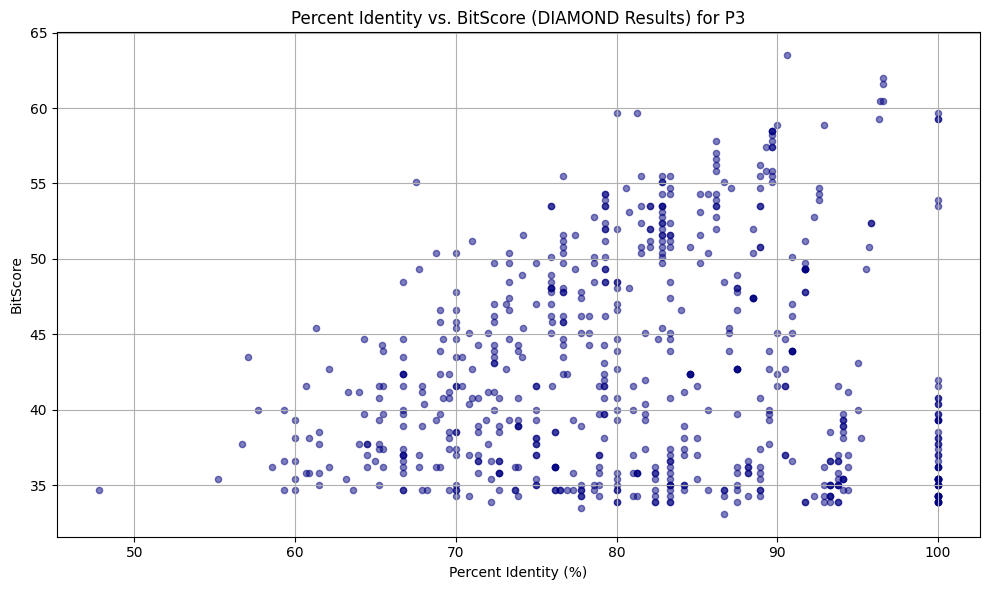

In [56]:
# === Scatter Plot: Identity vs. BitScore ===
plt.figure(figsize=(10, 6))
plt.scatter(df_p3_diamond["Identity"], df_p3_diamond["Bitscore"], alpha=0.5, s=20, color="navy")

plt.title("Percent Identity vs. BitScore (DIAMOND Results) for P3")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.tight_layout()
plt.show()

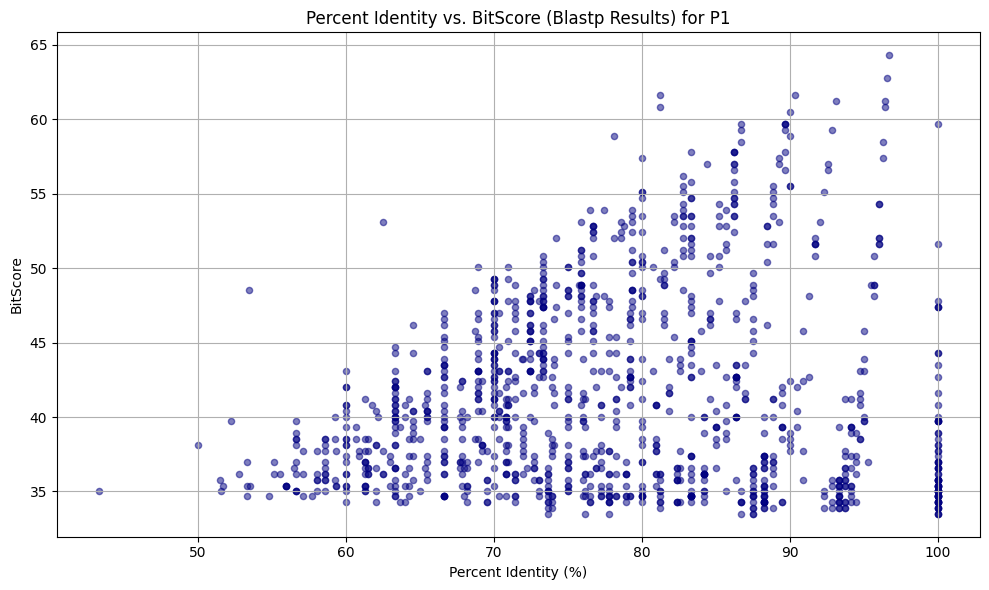

In [57]:
plt.figure(figsize=(10, 6))
plt.scatter(df_p1["pident"], df_p1["bitscore"], alpha=0.5, s=20, color="navy")

plt.title("Percent Identity vs. BitScore (Blastp Results) for P1")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.tight_layout()
plt.show()

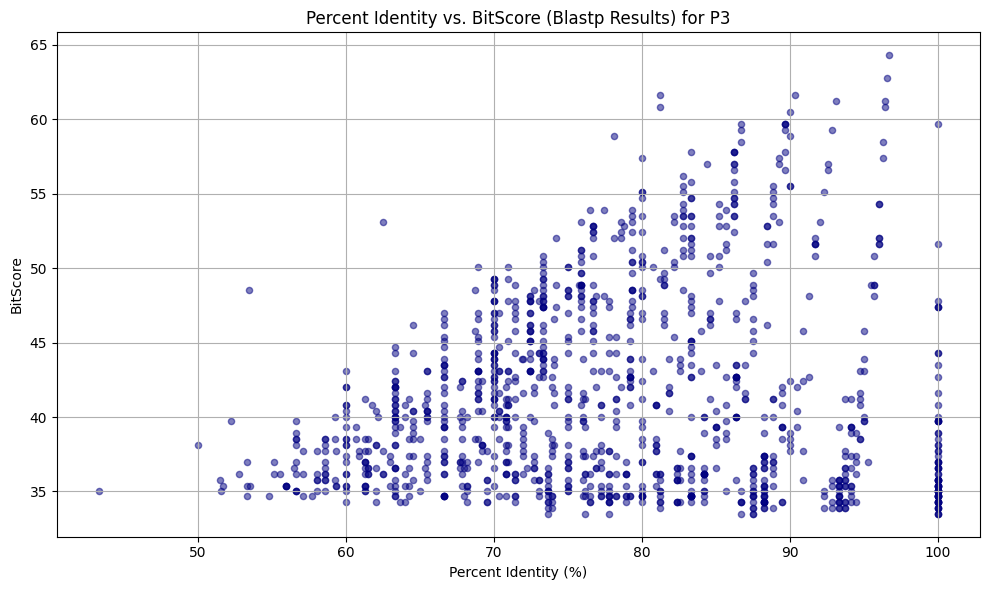

In [58]:
plt.figure(figsize=(10, 6))
plt.scatter(df_p3["pident"], df_p3["bitscore"], alpha=0.5, s=20, color="navy")

plt.title("Percent Identity vs. BitScore (Blastp Results) for P3")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.tight_layout()
plt.show()

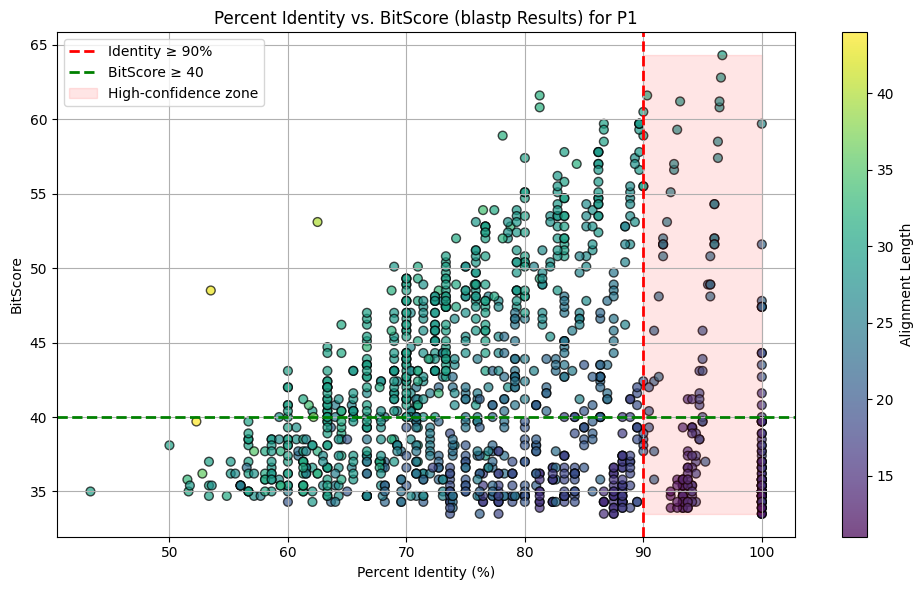

In [72]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_p1["pident"], df_p1["bitscore"], c=df_p1["length"],
                      cmap="viridis", alpha=0.7, edgecolor="k", s=40)

# Add colorbar to show alignment length
cbar = plt.colorbar(scatter)
cbar.set_label("Alignment Length")
# === Highlight high-confidence region ===
plt.axvline(x=90, color="red", linestyle="--", linewidth=2, label="Identity ≥ 90%")
plt.axhline(y=40, color="green", linestyle="--", linewidth=2, label="BitScore ≥ 40")

# Optional: shaded region for high-confidence hits
plt.fill_betweenx(y=[df_p1["bitscore"].min(), df_p1["bitscore"].max()],
                  x1=90, x2=100,
                  color='red', alpha=0.1, label="High-confidence zone")

# === Final plot settings ===
plt.title("Percent Identity vs. BitScore (blastp Results) for P1")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

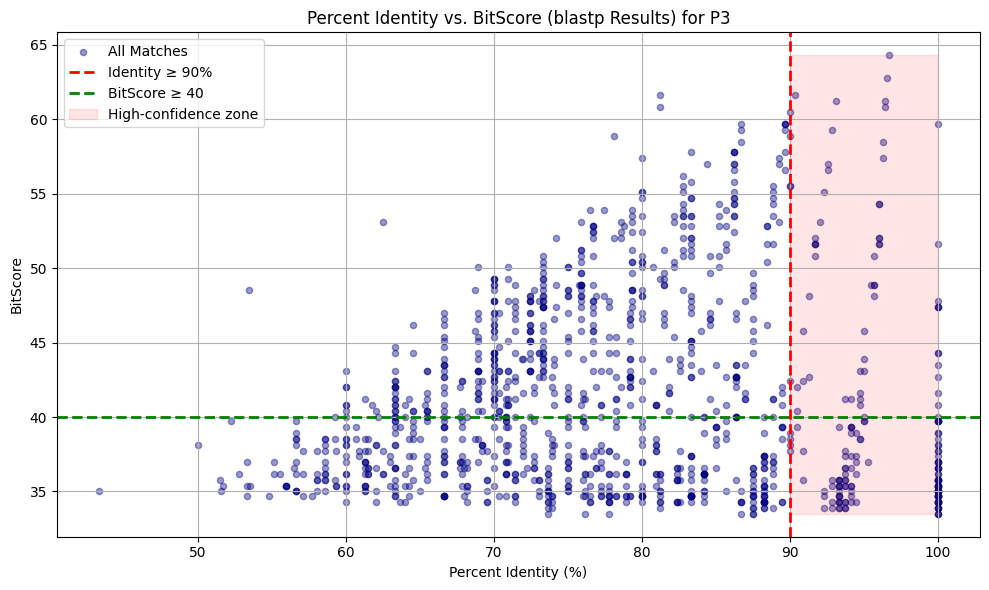

In [61]:
plt.figure(figsize=(10, 6))
plt.scatter(df_p3["pident"], df_p3["bitscore"], alpha=0.4, s=20, color="navy", label="All Matches")

# === Highlight high-confidence region ===
plt.axvline(x=90, color="red", linestyle="--", linewidth=2, label="Identity ≥ 90%")
plt.axhline(y=40, color="green", linestyle="--", linewidth=2, label="BitScore ≥ 40")

# Optional: shaded region for high-confidence hits
plt.fill_betweenx(y=[df_p3["bitscore"].min(), df_p3["bitscore"].max()],
                  x1=90, x2=100,
                  color='red', alpha=0.1, label="High-confidence zone")

# === Final plot settings ===
plt.title("Percent Identity vs. BitScore (blastp Results) for P3")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

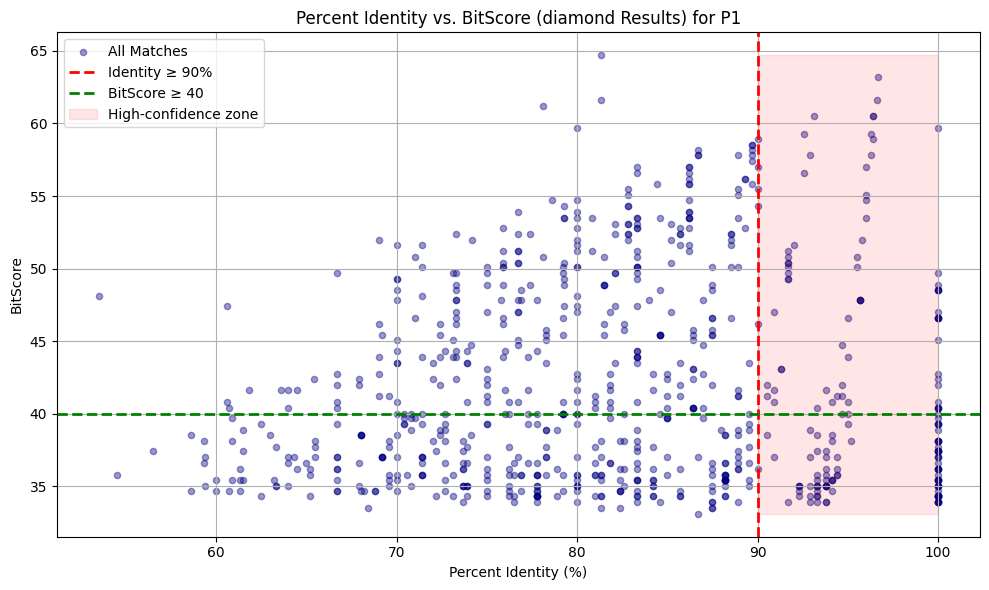

In [62]:
plt.figure(figsize=(10, 6))
plt.scatter(df_p1_diamond["Identity"], df_p1_diamond["Bitscore"], alpha=0.4, s=20, color="navy", label="All Matches")

# === Highlight high-confidence region ===
plt.axvline(x=90, color="red", linestyle="--", linewidth=2, label="Identity ≥ 90%")
plt.axhline(y=40, color="green", linestyle="--", linewidth=2, label="BitScore ≥ 40")

# Optional: shaded region for high-confidence hits
plt.fill_betweenx(y=[df_p1_diamond["Bitscore"].min(), df_p1_diamond["Bitscore"].max()],
                  x1=90, x2=100,
                  color='red', alpha=0.1, label="High-confidence zone")

# === Final plot settings ===
plt.title("Percent Identity vs. BitScore (diamond Results) for P1")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

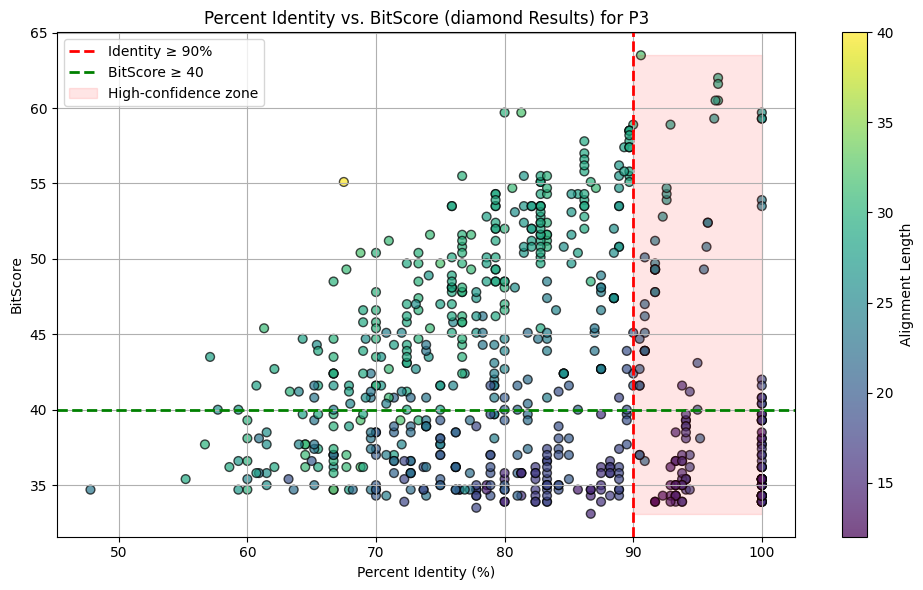

In [71]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_p3_diamond["Identity"], df_p3_diamond["Bitscore"], c=df_p3_diamond["Length"],
                      cmap="viridis", alpha=0.7, edgecolor="k", s=40)

# Add colorbar to show alignment length
cbar = plt.colorbar(scatter)
cbar.set_label("Alignment Length")

# === Highlight high-confidence region ===
plt.axvline(x=90, color="red", linestyle="--", linewidth=2, label="Identity ≥ 90%")
plt.axhline(y=40, color="green", linestyle="--", linewidth=2, label="BitScore ≥ 40")

# Optional: shaded region for high-confidence hits
plt.fill_betweenx(y=[df_p3_diamond["Bitscore"].min(), df_p3_diamond["Bitscore"].max()],
                  x1=90, x2=100,
                  color='red', alpha=0.1, label="High-confidence zone")

# === Final plot settings ===
plt.title("Percent Identity vs. BitScore (diamond Results) for P3")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

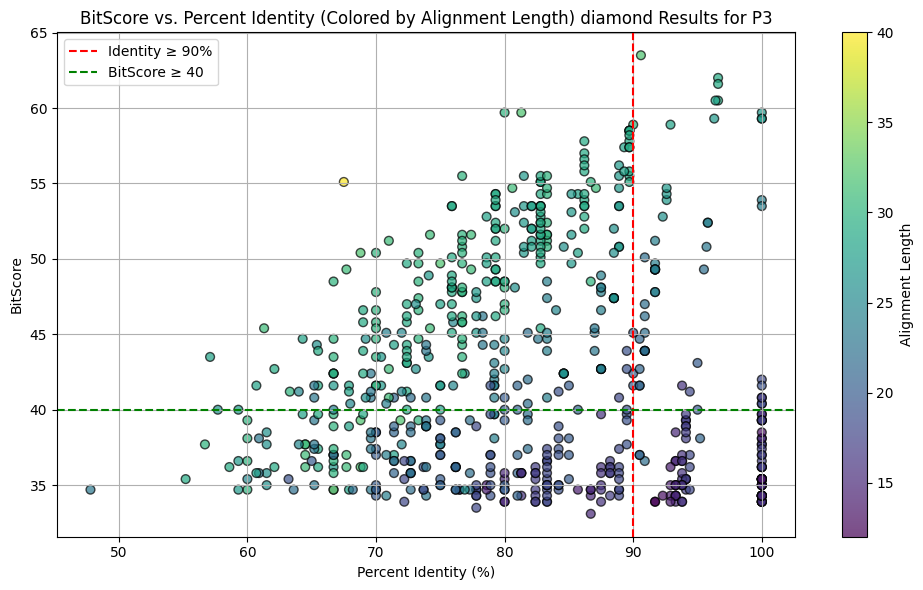

In [70]:
import pandas as pd
import matplotlib.pyplot as plt



# === Scatter plot: identity vs. bitscore, color = alignment length ===
plt.figure(figsize=(10, 6))
scatter = plt.scatter(df_p3_diamond["Identity"], df_p3_diamond["Bitscore"], c=df_p3_diamond["Length"],
                      cmap="viridis", alpha=0.7, edgecolor="k", s=40)

# Add colorbar to show alignment length
cbar = plt.colorbar(scatter)
cbar.set_label("Alignment Length")

# Add threshold lines
plt.axvline(x=90, color="red", linestyle="--", linewidth=1.5, label="Identity ≥ 90%")
plt.axhline(y=40, color="green", linestyle="--", linewidth=1.5, label="BitScore ≥ 40")

# Labels and legend
plt.title("BitScore vs. Percent Identity (Colored by Alignment Length) diamond Results for P3")
plt.xlabel("Percent Identity (%)")
plt.ylabel("BitScore")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


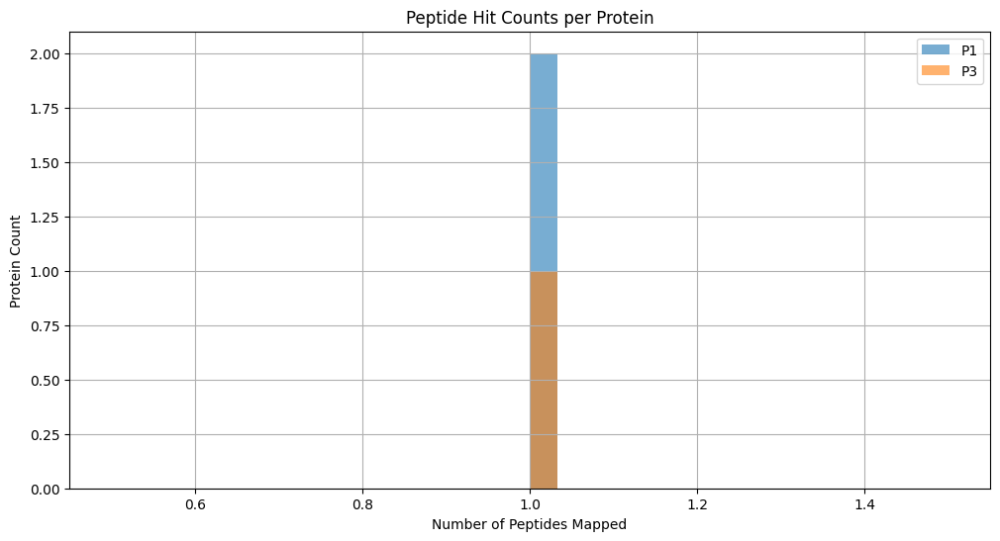

In [6]:
import matplotlib.pyplot as plt

# Histogram of number of hits per protein
p1_counts = p1_filtered["Protein_ID"].value_counts()
p3_counts = p3_filtered["Protein_ID"].value_counts()

plt.figure(figsize=(12, 6))
p1_counts.hist(alpha=0.6, bins=30, label="P1")
p3_counts.hist(alpha=0.6, bins=30, label="P3")
plt.title("Peptide Hit Counts per Protein")
plt.xlabel("Number of Peptides Mapped")
plt.ylabel("Protein Count")
plt.legend()
plt.grid(True)
plt.show()

In [7]:
# Get sets of unique protein IDs
proteins_p1 = set(p1_filtered["Protein_ID"])
proteins_p3 = set(p3_filtered["Protein_ID"])

# Compare overlap
shared_proteins = proteins_p1 & proteins_p3
unique_p1 = proteins_p1 - proteins_p3
unique_p3 = proteins_p3 - proteins_p1

print(f"Shared proteins: {len(shared_proteins)}")
print(f"Unique to P1: {len(unique_p1)}")
print(f"Unique to P3: {len(unique_p3)}")

# Save results
pd.DataFrame({"Shared_Proteins": list(shared_proteins)}).to_csv("shared_proteins.tsv", sep="\t", index=False)
pd.DataFrame({"P1_Unique_Proteins": list(unique_p1)}).to_csv("p1_unique_proteins.tsv", sep="\t", index=False)
pd.DataFrame({"P3_Unique_Proteins": list(unique_p3)}).to_csv("p3_unique_proteins.tsv", sep="\t", index=False)

Shared proteins: 0
Unique to P1: 2
Unique to P3: 1


In [1]:
from Bio import SeqIO
import requests
import os

# === CONFIGURATION ===
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/filtered_proteins.fasta"  # The input FASTA file with old UniProt IDs
output_fasta = "updated_filtered_proteins.fasta"
mapping_log = "uniprot_id_mapping_log.txt"
unmapped_log = "unmapped_ids.txt"

# === STEP 1: Extract UniProt IDs from FASTA headers ===
old_id_map = {}  # {old_id: SeqRecord}

for record in SeqIO.parse(fasta_file, "fasta"):
    old_id = record.id.split("|")[1] if "|" in record.id else record.id
    old_id_map[old_id] = record

print(f"🔍 Found {len(old_id_map)} protein entries in FASTA.")

# === STEP 2: Query UniParc API for updated UniProt IDs ===
def query_uniparc_for_active_uniprot(old_id):
    url = f"https://rest.uniprot.org/uniparc/search?query={old_id}&format=json"
    try:
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()

        if 'results' not in data or not data['results']:
            return None

        accessions = data['results'][0].get("uniProtKBAccessions", [])
        if accessions:
            for acc in accessions:
                if not acc.startswith(old_id):
                    return acc
            return accessions[0]
    except Exception as e:
        print(f"  ⚠️ Error querying UniParc for {old_id}: {e}")
    return None

# === STEP 3: Map IDs and write updated FASTA ===
updated_records = []
id_mapping = {}
unmapped = []

for old_id, record in old_id_map.items():
    new_id = query_uniparc_for_active_uniprot(old_id)
    if new_id:
        record.id = new_id
        record.description = record.description.replace(old_id, new_id)
        updated_records.append(record)
        id_mapping[old_id] = new_id
        print(f"  ✅ {old_id} → {new_id}")
    else:
        unmapped.append(old_id)
        print(f"  ❌ No mapping found for {old_id}")

# Write updated FASTA
SeqIO.write(updated_records, output_fasta, "fasta")

# Write logs
with open(mapping_log, "w") as map_file:
    for old_id, new_id in id_mapping.items():
        map_file.write(f"{old_id}\t{new_id}\n")

with open(unmapped_log, "w") as unmapped_file:
    for old_id in unmapped:
        unmapped_file.write(f"{old_id}\n")

print(f"\n✅ Updated FASTA written to: {output_fasta}")
print(f"📄 Mapping log saved to: {mapping_log}")
print(f"⚠️ {len(unmapped)} IDs could not be mapped (see {unmapped_log})")


🔍 Found 1180 protein entries in FASTA.
  ✅ A0A9P1KHL8 → W6SQ02.1
  ✅ A0A9P1KJW2 → W6SF70.1
  ✅ A0A9P1KKP0 → K1W942.1
  ✅ A0A9P1NXC1 → H1W6U5.1
  ✅ A0A9P1NYP7 → A0A6H2AIP8.1
  ✅ A0A9P1NZG9 → A0A7G7VP31.1
  ✅ A0A9P1P126 → A0A4D8UWF2
  ✅ A0A9P1P1D1 → H1WIE8.1
  ✅ A0A9P1P1E5 → A0A4Y7LMS7
  ✅ A0A9P1KA29 → H1WDY6.1
  ✅ A0A9P1KA74 → H1WCN4.1
  ✅ A0A9P1KAM7 → H1WL88.1
  ✅ A0A9P1KAU3 → A0A968Z9Q7
  ✅ A0A9P1KAX4 → H1WCY6.1
  ✅ A0A9P1KAY1 → H1WLN7.1
  ✅ A0A9P1KB03 → A0A7G7VW72.1
  ✅ A0A9P1KB08 → H1WCN5.1
  ✅ A0A9P1KB35 → H1WCV3.1
  ✅ A0A9P1KBE4 → A0A6H2ANU1.1
  ✅ A0A9P1KBH3 → H1WLN9.1
  ✅ A0A9P1KBM6 → A0A6H2ALR5.1
  ✅ A0A9P1KBP9 → W6S330.1
  ✅ A0A9P1KBQ7 → H1WLS8.1
  ✅ A0A9P1KBU0 → H1WLS9.1
  ✅ A0A9P1KBU1 → A0A6H2AN93.1
  ✅ A0A9P1KBZ0 → H1W6J2.1
  ✅ A0A9P1KC56 → K1WPY6.1
  ✅ A0A9P1KC68 → W6S5L7.1
  ✅ A0A9P1KC94 → A0A4Y7LIJ4
  ✅ A0A9P1KCD7 → B5W4A4
  ✅ A0A9P1KCI4 → H1WLU5.1
  ✅ A0A9P1KCJ1 → A0A9J7BCA3.1
  ✅ A0A9P1KCW8 → W6S504.1
  ✅ A0A9P1KD35 → B5W6R2
  ✅ A0A9P1KD60 → A0A9J7BA69.1
  ✅ A0A9P1KD91 

In [2]:
from Bio import SeqIO

# === CONFIGURATION ===
input_fasta = "updated_filtered_proteins.fasta"
output_fasta = "cleaned_uniprot_ids.fasta"

# === PROCESS ===
cleaned_records = []
seen_ids = set()

for record in SeqIO.parse(input_fasta, "fasta"):
    clean_id = record.id.split(".")[0]  # Remove version suffix
    if clean_id in seen_ids:
        continue  # Skip duplicates
    seen_ids.add(clean_id)
    record.id = clean_id
    record.name = clean_id
    record.description = clean_id  # Use only clean ID as description
    cleaned_records.append(record)

# === SAVE OUTPUT ===
SeqIO.write(cleaned_records, output_fasta, "fasta")

print(f"✅ Cleaned and deduplicated FASTA saved to: {output_fasta}")


✅ Cleaned and deduplicated FASTA saved to: cleaned_uniprot_ids.fasta


In [23]:
import os
import shutil
from Bio import SeqIO

# === CONFIGURATION ===
fasta_file = "C:/Users/Gilles/Documents/Master_thesis/filtered_proteins.fasta"
pdb_folder = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"
output_folder = "C:/Users/Gilles/Documents/Master_thesis/matched_pdbs"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# === STEP 1: Parse FASTA headers to get protein IDs ===
fasta_ids = set()
with open(fasta_file, "r") as fasta_handle:
    for record in SeqIO.parse(fasta_handle, "fasta"):
        fasta_ids.add(record.id.strip())

# === STEP 2: Copy matching PDB files ===
matched_count = 0

for filename in os.listdir(pdb_folder):
    if filename.endswith(".pdb"):
        pdb_id = filename.replace(".pdb", "")
        if pdb_id in fasta_ids:
            src = os.path.join(pdb_folder, filename)
            dst = os.path.join(output_folder, filename)
            shutil.copyfile(src, dst)
            matched_count += 1

print(f"\n✅ Total matched .pdb files: {matched_count}")
print(f"📂 Copied to folder: {output_folder}")


✅ Total matched .pdb files: 342
📂 Copied to folder: C:/Users/Gilles/Documents/Master_thesis/matched_pdbs


In [22]:
import os
from Bio import SeqIO

# === CONFIGURATION ===
fasta_file = "updated_filtered_proteins.fasta"
pdb_folder = "C:/Users/Gilles/Documents/Master_thesis/new_protein_ids_alphafold"

# === STEP 1: Extract cleaned IDs from FASTA ===
fasta_ids = set()
for record in SeqIO.parse(fasta_file, "fasta"):
    clean_id = record.id.split(".")[0]  # remove version if still present
    fasta_ids.add(clean_id)

# === STEP 2: Get PDB file IDs ===
pdb_ids = set()
for filename in os.listdir(pdb_folder):
    if filename.endswith(".pdb"):
        pdb_id = filename.replace(".pdb", "")
        pdb_ids.add(pdb_id)

# === STEP 3: Find matches ===
matching_ids = fasta_ids & pdb_ids
missing_ids = fasta_ids - pdb_ids

print(f"✅ Matching protein IDs: {len(matching_ids)}")
print(f"❌ Missing protein IDs (in FASTA but not in AlphaFold folder): {len(missing_ids)}")

# === STEP 4: Write matched and missing proteins to new FASTA files ===
matched_file = "matched_proteins.fasta"
missing_file = "missing_proteins.fasta"

with open(matched_file, "w") as match_out, open(missing_file, "w") as miss_out:
    for record in SeqIO.parse(fasta_file, "fasta"):
        clean_id = record.id.split(".")[0]
        if clean_id in matching_ids:
            SeqIO.write(record, match_out, "fasta")
        elif clean_id in missing_ids:
            SeqIO.write(record, miss_out, "fasta")

print(f"📁 Matched sequences written to: {matched_file}")
print(f"📁 Missing sequences written to: {missing_file}")



✅ Matching protein IDs: 618
❌ Missing protein IDs (in FASTA but not in AlphaFold folder): 562
📁 Matched sequences written to: matched_proteins.fasta
📁 Missing sequences written to: missing_proteins.fasta


In [3]:
!pip install fastSemSim


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Gilles\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [7]:
!pip install fastsemsim

  Using cached fastsemsim-1.0.0-py2.py3-none-any.whl.metadata (1.4 kB)
Using cached fastsemsim-1.0.0-py2.py3-none-any.whl (42.8 MB)



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Gilles\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [8]:
import fastsemsim

go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms


C:\Users\Gilles\AppData\Local\Temp\ipykernel_29524\3780093278.py:13: DtypeWarning: Columns (6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  deepfri_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/results_lambda_all_proteins.tsv", sep="\t")


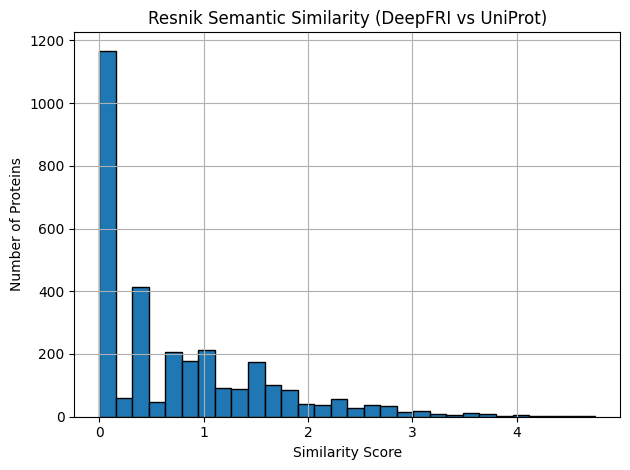

In [27]:
from goatools.obo_parser import GODag
from goatools.semantic import TermCounts, get_info_content, semantic_similarity
import pandas as pd
from collections import defaultdict
import matplotlib.pyplot as plt
from goatools.semantic import resnik_sim


# Load GO DAG
go_dag = GODag("go-basic.obo")

# Parse DeepFRI
deepfri_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/results_lambda_all_proteins.tsv", sep="\t")
deepfri_go = defaultdict(set)
for _, row in deepfri_df.iterrows():
    if pd.notna(row["GO_term/EC_number"]) and row["GO_term/EC_number"].startswith("GO:"):
        deepfri_go[row["Protein"]].add(row["GO_term/EC_number"])

# Parse UniProt
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")
uniprot_go = defaultdict(set)
for _, row in uniprot_df.iterrows():
    if pd.notna(row["Gene Ontology IDs"]):
        terms = [x.strip() for x in row["Gene Ontology IDs"].split(";") if x.startswith("GO:")]
        uniprot_go[row["Entry"]].update(terms)

# IC counts (needed for Resnik)
all_terms = [go for terms in uniprot_go.values() for go in terms]
term_counts = TermCounts(go_dag, uniprot_go)


# Corrected BMA function
from goatools.semantic import resnik_sim

def bma(set1, set2):
    if not set1 or not set2:
        return 0.0
    sims_1 = [max(resnik_sim(t1, t2, go_dag, term_counts) or 0 for t2 in set2) for t1 in set1]
    sims_2 = [max(resnik_sim(t2, t1, go_dag, term_counts) or 0 for t1 in set1) for t2 in set2]
    return (sum(sims_1) / len(sims_1) + sum(sims_2) / len(sims_2)) / 2

# Filter out GO terms not found in the DAG
def filter_terms(go_dict):
    return {
        protein: {go for go in terms if go in go_dag}
        for protein, terms in go_dict.items()
        if any(go in go_dag for go in terms)
    }

deepfri_go = filter_terms(deepfri_go)
uniprot_go = filter_terms(uniprot_go)


# Compute similarities
common_proteins = sorted(set(deepfri_go) & set(uniprot_go))
similarities = [bma(deepfri_go[p], uniprot_go[p]) for p in common_proteins]

# Plot
plt.hist(similarities, bins=30, edgecolor='black')
plt.title("Resnik Semantic Similarity (DeepFRI vs UniProt)")
plt.xlabel("Similarity Score")
plt.ylabel("Number of Proteins")
plt.grid(True)
plt.tight_layout()
plt.show()


In [30]:
!pip install --upgrade goatools



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Gilles\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms


C:\Users\Gilles\AppData\Local\Temp\ipykernel_29524\3709910371.py:11: DtypeWarning: Columns (6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  ddeepfri_df =pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/results_lambda_all_proteins.tsv", sep="\t")


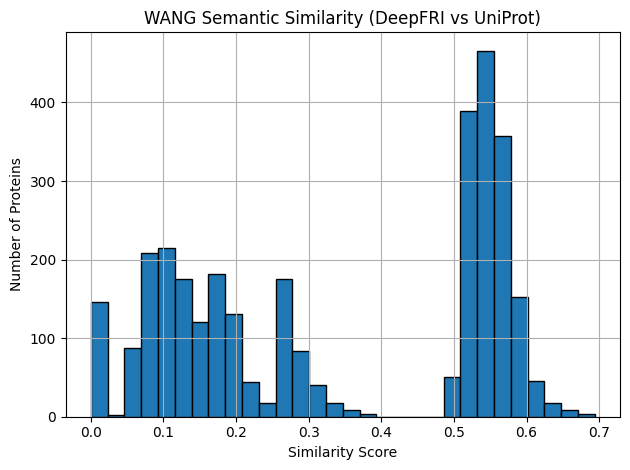

In [ ]:
from goatools.obo_parser import GODag
from goatools.semantic import TermCounts, resnik_sim, lin_sim, semantic_similarity
import pandas as pd
from collections import defaultdict
import matplotlib.pyplot as plt

# Load GO DAG
go_dag = GODag("go-basic.obo")

# Load GO annotations
deepfri_df =pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/results_lambda_all_proteins.tsv", sep="\t")
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")

# Parse GO terms
def parse_go(df, id_col, go_col):
    go_map = defaultdict(set)
    for _, row in df.iterrows():
        if pd.notna(row[go_col]):
            terms = [x.strip() for x in str(row[go_col]).split(";") if x.startswith("GO:")]
            go_map[row[id_col]].update(terms)
    return go_map

deepfri_go = parse_go(deepfri_df, "Protein", "GO_term/EC_number")
uniprot_go = parse_go(uniprot_df, "Entry", "Gene Ontology IDs")

# Filter to GO terms present in DAG
def filter_terms(go_dict):
    return {
        prot: {go for go in terms if go in go_dag}
        for prot, terms in go_dict.items()
        if any(go in go_dag for go in terms)
    }

deepfri_go = filter_terms(deepfri_go)
uniprot_go = filter_terms(uniprot_go)

# Compute IC
term_counts = TermCounts(go_dag, uniprot_go)

# === SELECT SIMILARITY METHOD ===
SIM_METHOD = "wang"  # options: resnik, lin, jc, wang

# Manual switch for similarity methods
def get_sim(t1, t2):
    if SIM_METHOD == "resnik":
        return resnik_sim(t1, t2, go_dag, term_counts)
    elif SIM_METHOD == "lin":
        return lin_sim(t1, t2, go_dag, term_counts)
    elif SIM_METHOD == "wang":
        # Wang similarity does not require term_counts
        return semantic_similarity(t1, t2, go_dag)
    else:
        return 0.0

# Best Match Average (BMA)
def bma(set1, set2):
    if not set1 or not set2:
        return 0.0
    sims_1 = [max(get_sim(t1, t2) or 0 for t2 in set2) for t1 in set1]
    sims_2 = [max(get_sim(t2, t1) or 0 for t1 in set1) for t2 in set2]
    return (sum(sims_1) / len(sims_1) + sum(sims_2) / len(sims_2)) / 2

# Compute BMA similarity per protein
common_proteins = sorted(set(deepfri_go) & set(uniprot_go))
similarities = [bma(deepfri_go[p], uniprot_go[p]) for p in common_proteins]

# Plot histogram
plt.hist(similarities, bins=30, edgecolor='black')
plt.title(f"{SIM_METHOD.upper()} Semantic Similarity (DeepFRI vs UniProt)")
plt.xlabel("Similarity Score")
plt.ylabel("Number of Proteins")
plt.grid(True)
plt.tight_layout()
plt.show()


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms


C:\Users\Gilles\AppData\Local\Temp\ipykernel_5968\1343992807.py:10: DtypeWarning: Columns (6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  mdeepfri_df =pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/results_lambda_all_proteins.tsv", sep="\t")


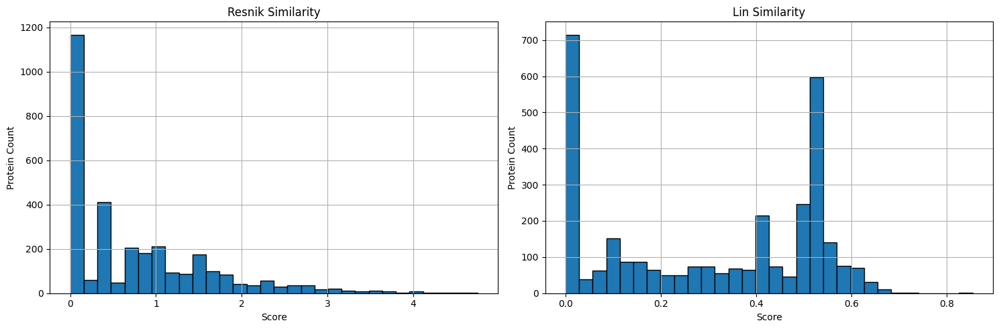

In [9]:
from goatools.obo_parser import GODag
from goatools.semantic import TermCounts, resnik_sim, lin_sim, semantic_similarity
import pandas as pd
from collections import defaultdict
import matplotlib.pyplot as plt

# === 1. Load DAG and Annotations ===
go_dag = GODag("go-basic.obo")

mdeepfri_df =pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/results_lambda_all_proteins.tsv", sep="\t")
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")
def parse_go(df, id_col, go_col):
    go_map = defaultdict(set)
    for _, row in df.iterrows():
        if pd.notna(row[go_col]):
            terms = [x.strip() for x in str(row[go_col]).split(";") if x.startswith("GO:")]
            go_map[row[id_col]].update(terms)
    return go_map

mdeepfri_go = parse_go(mdeepfri_df, "Protein", "GO_term/EC_number")
uniprot_go = parse_go(uniprot_df, "Entry", "Gene Ontology IDs")

def filter_terms(go_dict):
    return {
        prot: {go for go in terms if go in go_dag}
        for prot, terms in go_dict.items()
        if any(go in go_dag for go in terms)
    }

mdeepfri_go = filter_terms(mdeepfri_go)
uniprot_go = filter_terms(uniprot_go)

common_proteins = sorted(set(mdeepfri_go) & set(uniprot_go))
term_counts = TermCounts(go_dag, uniprot_go)  # Required for Resnik & Lin

# === 2. BMA Similarity Function per Method ===
def get_sim_func(method):
    def sim(t1, t2):
        if method == "resnik":
            return resnik_sim(t1, t2, go_dag, term_counts)
        elif method == "lin":
            return lin_sim(t1, t2, go_dag, term_counts)
        elif method == "wang":
            return semantic_similarity(t1, t2, go_dag)
        else:
            return 0.0
    return sim

def bma(set1, set2, sim_func):
    if not set1 or not set2:
        return 0.0
    sims_1 = [max(sim_func(t1, t2) or 0 for t2 in set2) for t1 in set1]
    sims_2 = [max(sim_func(t2, t1) or 0 for t1 in set1) for t2 in set2]
    return (sum(sims_1) / len(sims_1) + sum(sims_2) / len(sims_2)) / 2

# === 3. Compute Similarities ===
similarity_methods = ["resnik", "lin"]
results = {}

for method in similarity_methods:
    sim_func = get_sim_func(method)
    similarities = [bma(mdeepfri_go[p], uniprot_go[p], sim_func) for p in common_proteins]
    results[method] = similarities

# === 4. Plot Side-by-Side Histograms ===
plt.figure(figsize=(15, 5))
for idx, method in enumerate(similarity_methods, 1):
    plt.subplot(1, 2, idx)
    plt.hist(results[method], bins=30, edgecolor='black')
    plt.title(f"{method.title()} Similarity")
    plt.xlabel("Score")
    plt.ylabel("Protein Count")
    plt.grid(True)
plt.tight_layout()
plt.suptitle("", fontsize=16, y=1.03)
plt.show()


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
      Protein GO_term/EC_number    Score   GO_term/EC_number name GO_Category
0  A0A9P1KAP2        GO:0005829  0.10416                  cytosol          cc
1  A0A9P1KAZ4        GO:0034357  0.99743  photosynthetic membrane          cc
2  A0A9P1KAZ4        GO:0042651  0.99689       thylakoid membrane          cc
3  A0A9P1KAZ4        GO:0009579  0.99616                thylakoid          cc
4  A0A9P1KAZ4        GO:0009521  0.98975              photosystem          cc


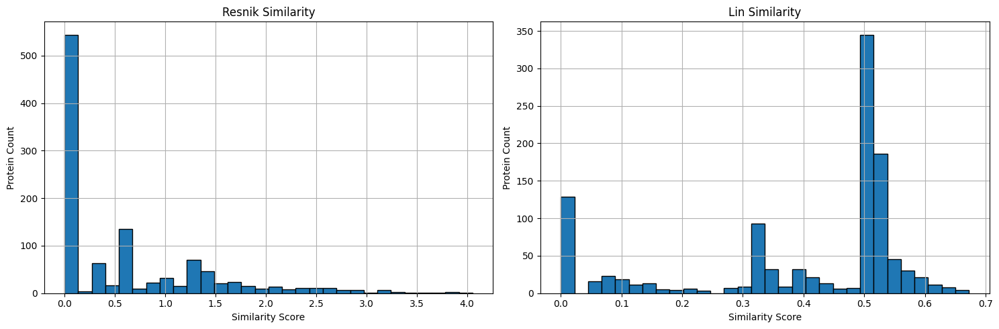

In [10]:
from goatools.obo_parser import GODag
from goatools.semantic import TermCounts, resnik_sim, lin_sim, semantic_similarity
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt

# === STEP 1: Load GO DAG ===
go_dag = GODag("go-basic.obo")

# === STEP 2: Load DeepFRI predictions ===
cc_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv",skiprows=1)
mf_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv",skiprows=1)
bp_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv",skiprows=1)
# Add GO category to each
cc_df["GO_Category"] = "cc"
mf_df["GO_Category"] = "mf"
bp_df["GO_Category"] = "bp"



# Combine
deepfri_df = pd.concat([cc_df, mf_df, bp_df], ignore_index=True)

# Rename columns
deepfri_df.columns = ["Protein", "GO_term/EC_number", "Score", "GO_term/EC_number name", "GO_Category"]

# Preview
print(deepfri_df.head())


#deepfri_df = pd.concat([cc_df, mf_df, bp_df], ignore_index=True)

# === STEP 3: Load UniProt annotations ===
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")

# === STEP 4: Parse GO terms into dictionaries ===
def parse_go(df, id_col="Protein", go_col="GO_term/EC_number"):
    go_map = defaultdict(set)
    if go_col not in df.columns:
        raise KeyError(f"Column '{go_col}' not found in the DataFrame. Available columns: {df.columns.tolist()}")
    for _, row in df.iterrows():
        if pd.notna(row[go_col]) and row[go_col].startswith("GO:"):
            go_map[row[id_col]].add(row[go_col])
    return go_map

# Ensure the correct column names are used
#deepfri_go = parse_go(deepfri_df, id_col="Protein", go_col="GO_term/EC_number")


deepfri_go = parse_go(deepfri_df, "Protein", "GO_term/EC_number")
uniprot_go = parse_go(uniprot_df, "Entry", "Gene Ontology IDs")

# === STEP 5: Filter terms present in GO DAG ===
def filter_terms(go_dict):
    return {
        prot: {go for go in terms if go in go_dag}
        for prot, terms in go_dict.items()
        if any(go in go_dag for go in terms)
    }

deepfri_go = filter_terms(deepfri_go)
uniprot_go = filter_terms(uniprot_go)

# === STEP 6: Compute TermCounts for IC-based methods ===
term_counts = TermCounts(go_dag, uniprot_go)

# === STEP 7: Define similarity method logic ===
def get_sim_func(method):
    def sim(t1, t2):
        if method == "resnik":
            return resnik_sim(t1, t2, go_dag, term_counts)
        elif method == "lin":
            return lin_sim(t1, t2, go_dag, term_counts)
        elif method == "wang":
            return semantic_similarity(t1, t2, go_dag)
        else:
            return 0.0
    return sim

# === STEP 8: Best Match Average (BMA) similarity ===
def bma(set1, set2, sim_func):
    if not set1 or not set2:
        return 0.0
    sims_1 = [max(sim_func(t1, t2) or 0 for t2 in set2) for t1 in set1]
    sims_2 = [max(sim_func(t2, t1) or 0 for t1 in set1) for t2 in set2]
    return (sum(sims_1) / len(sims_1) + sum(sims_2) / len(sims_2)) / 2

# === STEP 9: Evaluate DeepFRI vs UniProt ===
common_proteins = sorted(set(deepfri_go) & set(uniprot_go))
methods = ["resnik", "lin"]
scores = {}

for method in methods:
    sim_func = get_sim_func(method)
    similarities = [bma(deepfri_go[p], uniprot_go[p], sim_func) for p in common_proteins]
    scores[method] = similarities

# === STEP 10: Plot distributions ===
plt.figure(figsize=(15, 5))
for i, method in enumerate(methods, 1):
    plt.subplot(1, 2, i)
    plt.hist(scores[method], bins=30, edgecolor='black')
    plt.title(f"{method.title()} Similarity")
    plt.xlabel("Similarity Score")
    plt.ylabel("Protein Count")
    plt.grid(True)

plt.tight_layout()
plt.suptitle("", fontsize=16, y=1.03)
plt.show()


In [48]:
deepfri_df.head()

,### Predictions made by DeepFRI.,GO_Category
0,GO_term/EC_number name,cc
1,cytosol,cc
2,photosynthetic membrane,cc
3,thylakoid membrane,cc
4,thylakoid,cc


C:\Users\Gilles\AppData\Local\Temp\ipykernel_5968\3292697350.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axs[i].boxplot(
C:\Users\Gilles\AppData\Local\Temp\ipykernel_5968\3292697350.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axs[i].boxplot(


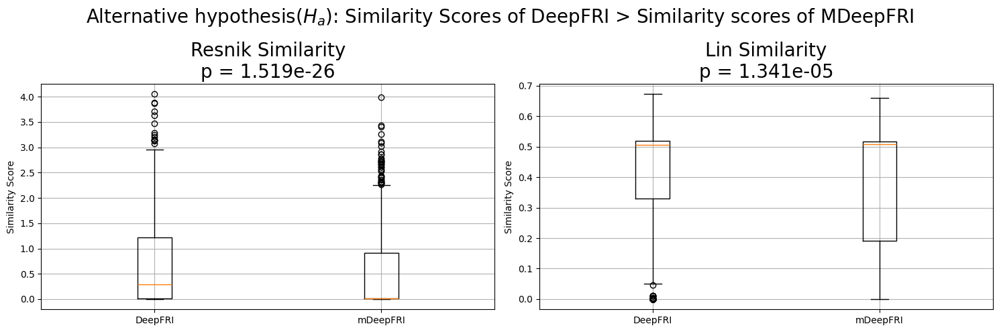

Resnik - Wilcoxon stat: 326710.5, p-value: 1.519e-26
Lin - Wilcoxon stat: 265115.0, p-value: 1.341e-05


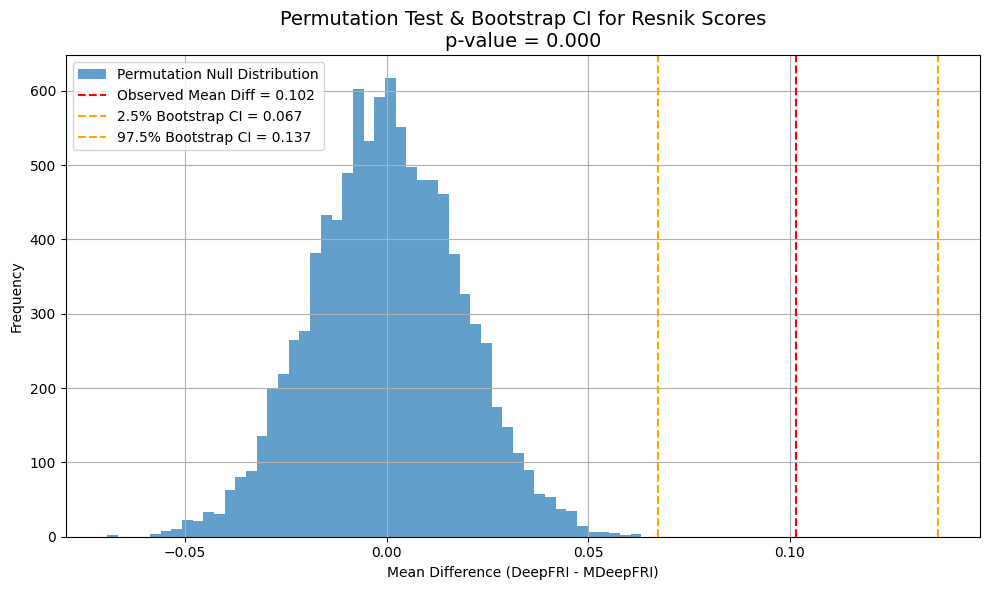

Observed mean difference: 0.1016
Permutation p-value (one-sided): 0.0000
95% Bootstrap CI: [0.0674, 0.1368]


In [22]:
from scipy.stats import wilcoxon
# === Compute scores for all common proteins ===
methods = ["resnik", "lin"]
deepfri_scores = {}
mdeepfri_scores = {}
common_proteins = sorted(set(deepfri_go) & set(mdeepfri_go) & set(uniprot_go))

for method in methods:
    sim_func = get_sim_func(method)
    deepfri_scores[method] = [bma(deepfri_go[p], uniprot_go[p], sim_func) for p in common_proteins]
    mdeepfri_scores[method] = [bma(mdeepfri_go[p], uniprot_go[p], sim_func) for p in common_proteins]

# === Wilcoxon test and boxplot visualization ===
wilcoxon_results = {}
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

for i, method in enumerate(methods):
    stat, p_value = wilcoxon(deepfri_scores[method], mdeepfri_scores[method],alternative="greater")
    wilcoxon_results[method] = (stat, p_value)

    axs[i].boxplot(
        [deepfri_scores[method], mdeepfri_scores[method]],
        labels=["DeepFRI", "mDeepFRI"]
        
)
    axs[i].set_title(f"{method.title()} Similarity\np = {p_value:.3e}", fontsize=20)
    axs[i].set_ylabel("Similarity Score")
    axs[i].grid(True)

plt.suptitle("Alternative hypothesis($H_a$): Similarity Scores of DeepFRI > Similarity scores of MDeepFRI", fontsize=20)
plt.tight_layout()
plt.savefig("semantic_similarity_comparison.png")
plt.show()

# === Print Wilcoxon results ===
for method in methods:
    stat, p = wilcoxon_results[method]
    print(f"{method.title()} - Wilcoxon stat: {stat}, p-value: {p:.3e}")


    import numpy as np
import matplotlib.pyplot as plt

# Compute the observed difference in means
observed_diff = np.array(deepfri_scores["resnik"]) - np.array(mdeepfri_scores["resnik"])
observed_mean_diff = np.mean(observed_diff)

# === Permutation Test ===
n_permutations = 10000
permuted_diffs = []

for _ in range(n_permutations):
    signs = np.random.choice([1, -1], size=len(observed_diff))
    permuted = signs * observed_diff
    permuted_diffs.append(np.mean(permuted))

permuted_diffs = np.array(permuted_diffs)

# One-sided permutation p-value
perm_p_value = np.mean(permuted_diffs >= observed_mean_diff)

# === Bootstrap Confidence Interval ===
n_bootstraps = 10000
bootstrap_means = []

for _ in range(n_bootstraps):
    sample = np.random.choice(observed_diff, size=len(observed_diff), replace=True)
    bootstrap_means.append(np.mean(sample))

bootstrap_means = np.array(bootstrap_means)
lower = np.percentile(bootstrap_means, 2.5)
upper = np.percentile(bootstrap_means, 97.5)

# === Plot ===
plt.figure(figsize=(10, 6))
plt.hist(permuted_diffs, bins=50, alpha=0.7, label='Permutation Null Distribution')
plt.axvline(observed_mean_diff, color='red', linestyle='--', label=f'Observed Mean Diff = {observed_mean_diff:.3f}')
plt.axvline(lower, color='orange', linestyle='--', label=f'2.5% Bootstrap CI = {lower:.3f}')
plt.axvline(upper, color='orange', linestyle='--', label=f'97.5% Bootstrap CI = {upper:.3f}')
plt.title(f"Permutation Test & Bootstrap CI for Resnik Scores\np-value = {perm_p_value:.3f}", fontsize=14)
plt.xlabel("Mean Difference (DeepFRI - MDeepFRI)")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Print results ===
print(f"Observed mean difference: {observed_mean_diff:.4f}")
print(f"Permutation p-value (one-sided): {perm_p_value:.4f}")
print(f"95% Bootstrap CI: [{lower:.4f}, {upper:.4f}]")


(array([  1.,   0.,   0.,   1.,   1.,   2.,   3.,   1.,   1.,   5.,   2.,
          0.,   6.,   0.,   5.,   2.,   2.,  10.,   8.,   3.,  28.,   8.,
         93., 657.,  20.,  35.,  12.,   3.,  13.,   3.,   9.,   8.,   3.,
          8.,  11.,  15.,   9.,   3.,   4.,   5.,   0.,   1.,   1.,   1.,
          2.,   2.,   1.,   2.,   0.,   2.]),
 array([-2.73187756e+00, -2.61318560e+00, -2.49449365e+00, -2.37580169e+00,
        -2.25710973e+00, -2.13841778e+00, -2.01972582e+00, -1.90103387e+00,
        -1.78234191e+00, -1.66364995e+00, -1.54495800e+00, -1.42626604e+00,
        -1.30757409e+00, -1.18888213e+00, -1.07019017e+00, -9.51498218e-01,
        -8.32806262e-01, -7.14114306e-01, -5.95422350e-01, -4.76730394e-01,
        -3.58038438e-01, -2.39346481e-01, -1.20654525e-01, -1.96256940e-03,
         1.16729387e-01,  2.35421343e-01,  3.54113299e-01,  4.72805255e-01,
         5.91497211e-01,  7.10189167e-01,  8.28881123e-01,  9.47573079e-01,
         1.06626503e+00,  1.18495699e+00,  1.30364

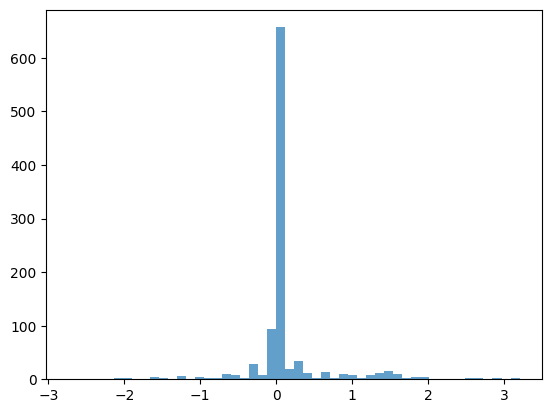

In [23]:
plt.hist(observed_diff, bins=50, alpha=0.7, label='Permutation Null Distribution')

{'whiskers': [<matplotlib.lines.Line2D at 0x12517293790>,
 'caps': [<matplotlib.lines.Line2D at 0x125107817d0>,
 'boxes': [<matplotlib.patches.PathPatch at 0x12517245b50>],
 'medians': [<matplotlib.lines.Line2D at 0x12510783090>],
 'fliers': [<matplotlib.lines.Line2D at 0x1251077b690>],
 'means': []}

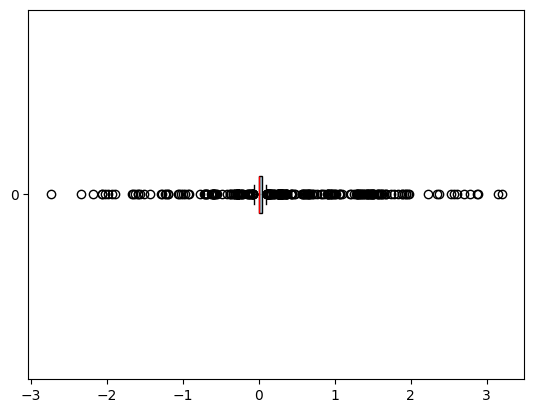

In [24]:
plt.boxplot(observed_diff, vert=False, positions=[0], widths=0.1, patch_artist=True,
            boxprops=dict(facecolor='lightblue', color='black'),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='red'))

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict

# Step 1: Load DeepFRI and UniProt files
deepfri_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/results_swissprot_lambda_cloud.tsv", sep="\t")
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_2025_03_03.tsv", sep="\t")

# Step 2: Structure DeepFRI GO terms
deepfri_go = defaultdict(set)
for _, row in deepfri_df.iterrows():
    if pd.notna(row["GO_term/EC_number"]) and row["GO_term/EC_number"].startswith("GO:"):
        deepfri_go[row["Protein"]].add(row["GO_term/EC_number"])

# Step 3: Structure UniProt GO terms
uniprot_go = defaultdict(set)
for _, row in uniprot_df.iterrows():
    entry_id = row["Entry"]
    if pd.notna(row["Gene Ontology IDs"]):
        terms = [x.strip() for x in row["Gene Ontology IDs"].split(";") if x.strip().startswith("GO:")]
        uniprot_go[entry_id].update(terms)

# Step 4: Compute BMA Semantic Similarity (Wang)
from fastsemsim.Ontology import Ontology
from fastsemsim.SemSim import SemSim

# Load ontology
go = Ontology("go-basic.obo", ignore_alt_ids=True)
sim = SemSim(go, 'wang')  # or use 'resnik', 'lin', etc.

# Function: Best-Match Average between two sets
def bma_similarity(setA, setB):
    if not setA or not setB:
        return 0.0

    def best_match(t1, t2_set):
        return max([sim.similarity(t1, t2) for t2 in t2_set if go.has_term(t2)], default=0.0)

    avg1 = sum(best_match(t1, setB) for t1 in setA) / len(setA)
    avg2 = sum(best_match(t2, setA) for t2 in setB) / len(setB)
    return (avg1 + avg2) / 2

# Step 5: Compute scores
common_proteins = set(deepfri_go.keys()) & set(uniprot_go.keys())
semantic_scores = []

for protein in common_proteins:
    deep_terms = deepfri_go[protein]
    uni_terms = uniprot_go[protein]
    score = bma_similarity(deep_terms, uni_terms)
    semantic_scores.append(score)

# Step 6: Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(semantic_scores, bins=30, edgecolor='black')
plt.title("Semantic Similarity (Wang) between DeepFRI and UniProt GO Terms")
plt.xlabel("Semantic Similarity Score")
plt.ylabel("Number of Proteins")
plt.grid(True)
plt.tight_layout()
plt.savefig("semantic_similarity_histogram.png")
plt.show()


ModuleNotFoundError: No module named 'fastsemsim.Ontology'

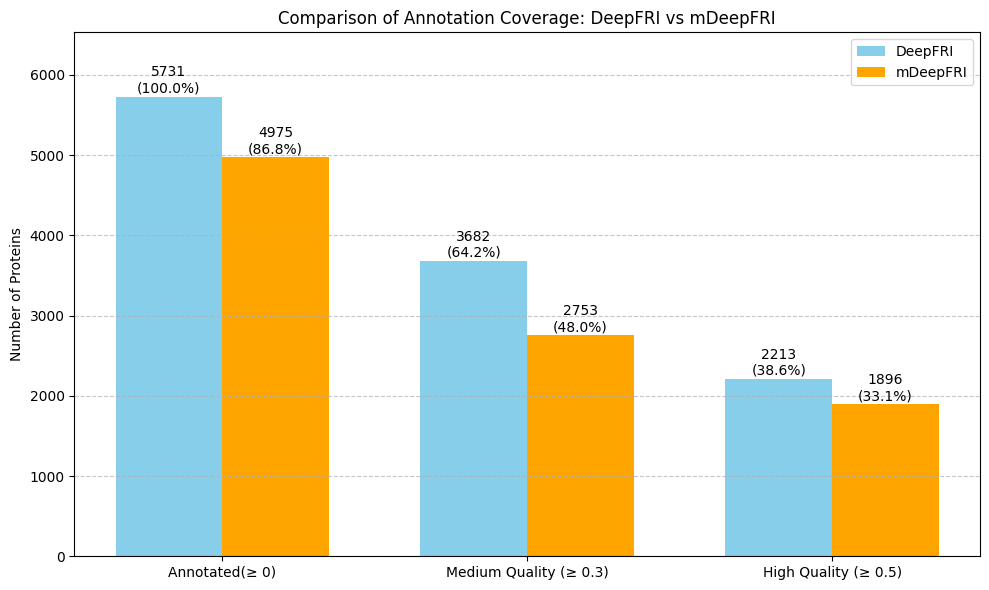

In [2]:
import matplotlib.pyplot as plt

# === Data ===
total_proteins = 5731
labels = ["Annotated(≥ 0)", "Medium Quality (≥ 0.3)", "High Quality (≥ 0.5)"]

# DeepFRI values
deepfri_values = [5731, 3682, 2213]
deepfri_pct = [f"{(v / total_proteins) * 100:.1f}%" for v in deepfri_values]

# mDeepFRI values
mdeepfri_values = [4975, 2753, 1896]
mdeepfri_pct = [f"{(v / total_proteins) * 100:.1f}%" for v in mdeepfri_values]

# === Plotting ===
x = range(len(labels))
bar_width = 0.35

plt.figure(figsize=(10, 6))
bars1 = plt.bar([i - bar_width/2 for i in x], deepfri_values, width=bar_width, label='DeepFRI', color='skyblue')
bars2 = plt.bar([i + bar_width/2 for i in x], mdeepfri_values, width=bar_width, label='mDeepFRI', color='orange')

# Annotate each bar with value and percentage
for i in range(len(labels)):
    plt.text(i - bar_width/2, deepfri_values[i] + 50, f"{deepfri_values[i]}\n({deepfri_pct[i]})", ha='center')
    plt.text(i + bar_width/2, mdeepfri_values[i] + 50, f"{mdeepfri_values[i]}\n({mdeepfri_pct[i]})", ha='center')

# === Styling ===
plt.xticks(ticks=x, labels=labels)
plt.ylabel("Number of Proteins")
plt.title("Comparison of Annotation Coverage: DeepFRI vs mDeepFRI")
plt.legend()
plt.ylim(0, max(deepfri_values + mdeepfri_values) + 800)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


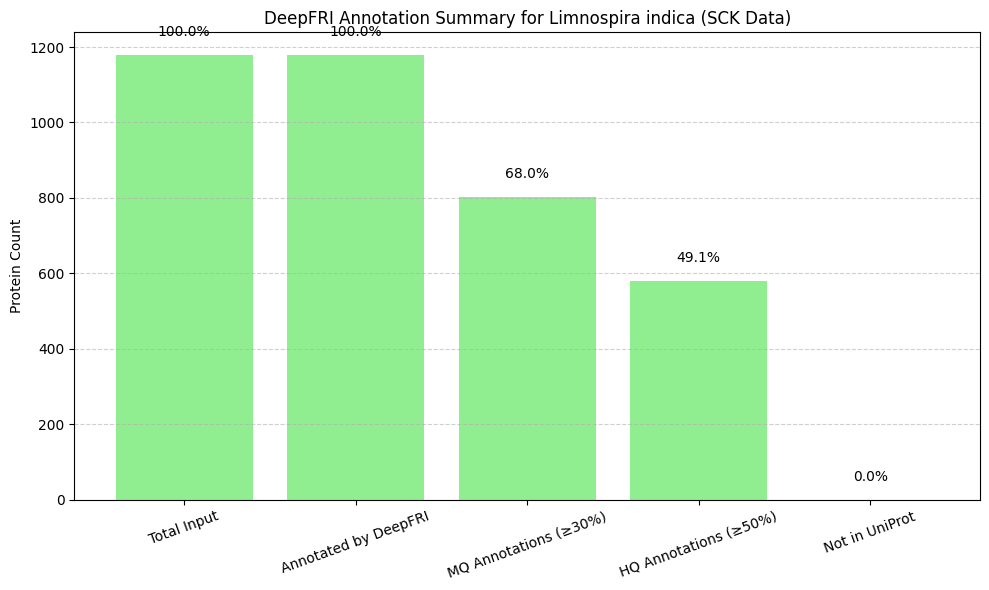

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load DeepFRI predictions ===
mf = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv", skiprows=1)
cc = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv", skiprows=1)
bp = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv", skiprows=1)

# Add GO category for reference (optional)
mf["GO_Category"] = "MF"
cc["GO_Category"] = "CC"
bp["GO_Category"] = "BP"

# Combine all into one dataframe
deepfri_df = pd.concat([mf, cc, bp], ignore_index=True)
deepfri_df.columns = ["Protein", "GO_term", "Score", "GO_name", "GO_Category"]

# === Load UniProt reference ===
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")

# === Calculate stats ===
total_input_proteins = 1180  # Given reference value
proteins_annotated = deepfri_df["Protein"].nunique()
medium_quality = deepfri_df[deepfri_df["Score"] >= 0.3]["Protein"].nunique()
high_quality = deepfri_df[deepfri_df["Score"] >= 0.5]["Protein"].nunique()

# === Compare with UniProt ===
uniprot_proteins = set(uniprot_df["Entry"])
deepfri_proteins = set(deepfri_df["Protein"])
only_in_deepfri = deepfri_proteins - uniprot_proteins
only_in_deepfri_count = len(only_in_deepfri)

# === Plot results ===
categories = [
    "Total Input",
    "Annotated by DeepFRI",
    "MQ Annotations (≥30%)",
    "HQ Annotations (≥50%)",
    "Not in UniProt"
]
values = [
    total_input_proteins,
    proteins_annotated,
    medium_quality,
    high_quality,
    only_in_deepfri_count
]
percentages = [f"{(v / total_input_proteins) * 100:.1f}%" for v in values]

plt.figure(figsize=(10, 6))
bars = plt.bar(categories, values, color="lightgreen")
plt.title("DeepFRI Annotation Summary for Limnospira indica (SCK Data)")
plt.ylabel("Protein Count")
plt.xticks(rotation=20)

# Annotate bars with percentages
for bar, pct in zip(bars, percentages):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 50, pct, ha="center", fontsize=10)

plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.show()


In [10]:
only_in_deepfri_count

1180

go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
      Protein GO_term/EC_number    Score   GO_term/EC_number name GO_Category
0  A0A9P1KAP2        GO:0005829  0.10416                  cytosol          cc
1  A0A9P1KAZ4        GO:0034357  0.99743  photosynthetic membrane          cc
2  A0A9P1KAZ4        GO:0042651  0.99689       thylakoid membrane          cc
3  A0A9P1KAZ4        GO:0009579  0.99616                thylakoid          cc
4  A0A9P1KAZ4        GO:0009521  0.98975              photosystem          cc


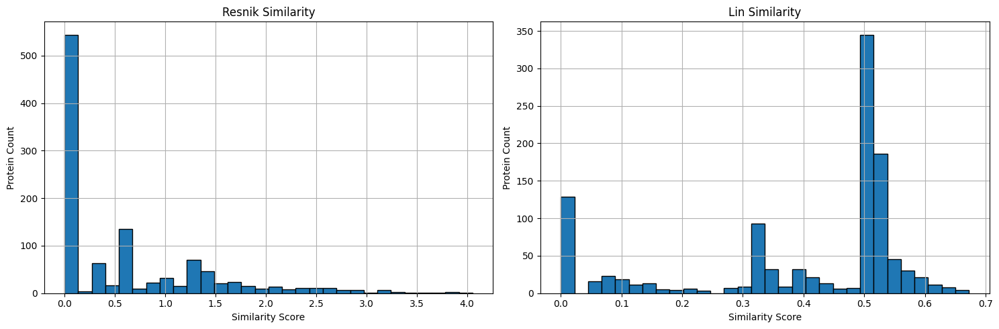

In [15]:
from goatools.obo_parser import GODag
from goatools.semantic import TermCounts, resnik_sim, lin_sim, semantic_similarity
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt

# === STEP 1: Load GO DAG ===
go_dag = GODag("go-basic.obo")

# === Load DeepFRI predictions ===
mf = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv", skiprows=1)
cc = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv", skiprows=1)
bp = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv", skiprows=1)

# Add GO category to each
cc_df["GO_Category"] = "cc"
mf_df["GO_Category"] = "mf"
bp_df["GO_Category"] = "bp"



# Combine
deepfri_df = pd.concat([cc_df, mf_df, bp_df], ignore_index=True)

# Rename columns
deepfri_df.columns = ["Protein", "GO_term/EC_number", "Score", "GO_term/EC_number name", "GO_Category"]

# Preview
print(deepfri_df.head())


#deepfri_df = pd.concat([cc_df, mf_df, bp_df], ignore_index=True)

# === STEP 3: Load UniProt annotations ===
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")

# === STEP 4: Parse GO terms into dictionaries ===
def parse_go(df, id_col="Protein", go_col="GO_term/EC_number"):
    go_map = defaultdict(set)
    if go_col not in df.columns:
        raise KeyError(f"Column '{go_col}' not found in the DataFrame. Available columns: {df.columns.tolist()}")
    for _, row in df.iterrows():
        if pd.notna(row[go_col]) and row[go_col].startswith("GO:"):
            go_map[row[id_col]].add(row[go_col])
    return go_map

# Ensure the correct column names are used
#deepfri_go = parse_go(deepfri_df, id_col="Protein", go_col="GO_term/EC_number")


deepfri_go = parse_go(deepfri_df, "Protein", "GO_term/EC_number")
uniprot_go = parse_go(uniprot_df, "Entry", "Gene Ontology IDs")

# === STEP 5: Filter terms present in GO DAG ===
def filter_terms(go_dict):
    return {
        prot: {go for go in terms if go in go_dag}
        for prot, terms in go_dict.items()
        if any(go in go_dag for go in terms)
    }

deepfri_go = filter_terms(deepfri_go)
uniprot_go = filter_terms(uniprot_go)

# === STEP 6: Compute TermCounts for IC-based methods ===
term_counts = TermCounts(go_dag, uniprot_go)

# === STEP 7: Define similarity method logic ===
def get_sim_func(method):
    def sim(t1, t2):
        if method == "resnik":
            return resnik_sim(t1, t2, go_dag, term_counts)
        elif method == "lin":
            return lin_sim(t1, t2, go_dag, term_counts)
        elif method == "wang":
            return semantic_similarity(t1, t2, go_dag)
        else:
            return 0.0
    return sim

# === STEP 8: Best Match Average (BMA) similarity ===
def bma(set1, set2, sim_func):
    if not set1 or not set2:
        return 0.0
    sims_1 = [max(sim_func(t1, t2) or 0 for t2 in set2) for t1 in set1]
    sims_2 = [max(sim_func(t2, t1) or 0 for t1 in set1) for t2 in set2]
    return (sum(sims_1) / len(sims_1) + sum(sims_2) / len(sims_2)) / 2

# === STEP 9: Evaluate DeepFRI vs UniProt ===
common_proteins = sorted(set(deepfri_go) & set(uniprot_go))
methods = ["resnik", "lin"]
scores = {}

for method in methods:
    sim_func = get_sim_func(method)
    similarities = [bma(deepfri_go[p], uniprot_go[p], sim_func) for p in common_proteins]
    scores[method] = similarities

# === STEP 10: Plot distributions ===
plt.figure(figsize=(15, 5))
for i, method in enumerate(methods, 1):
    plt.subplot(1, 2, i)
    plt.hist(scores[method], bins=30, edgecolor='black')
    plt.title(f"{method.title()} Similarity")
    plt.xlabel("Similarity Score")
    plt.ylabel("Protein Count")
    plt.grid(True)

plt.tight_layout()
plt.suptitle("", fontsize=16, y=1.03)
plt.show()


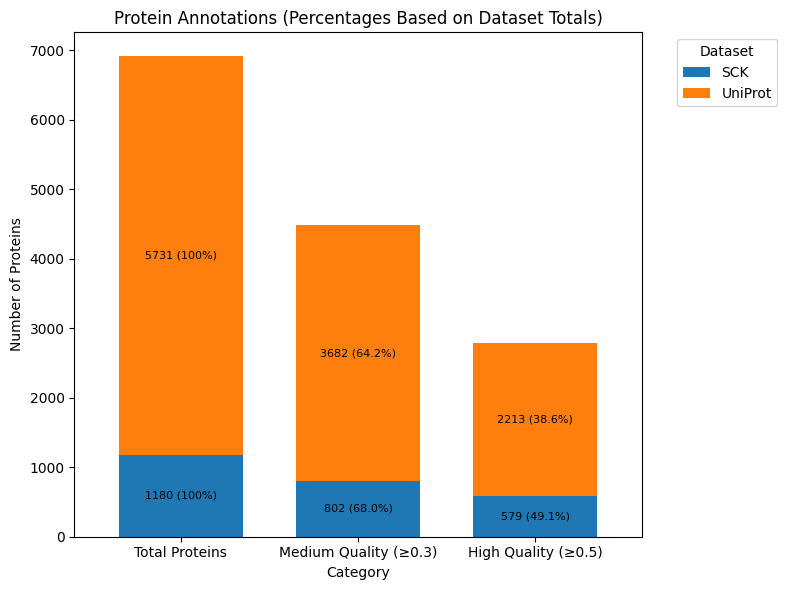

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Load DeepFRI predictions (skip comment header)
bp_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv", skiprows=1)
mf_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv", skiprows=1)
cc_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv", skiprows=1)

bp_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv", skiprows=1)
mf_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv", skiprows=1)
cc_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv", skiprows=1)

# Helper to count unique proteins above a score threshold
def count_proteins_by_score(dfs, threshold):
    return len(set().union(*[df[df['Score'] >= threshold]['Protein'] for df in dfs]))

# Total proteins
total_sck = len(set(bp_sck['Protein']).union(mf_sck['Protein']).union(cc_sck['Protein']))
total_uniprot = len(set(bp_df['Protein']).union(mf_df['Protein']).union(cc_df['Protein']))

# Medium and high-quality counts
sck_medium = count_proteins_by_score([bp_sck, mf_sck, cc_sck], 0.3)
sck_high = count_proteins_by_score([bp_sck, mf_sck, cc_sck], 0.5)

uniprot_medium = count_proteins_by_score([bp_df, mf_df, cc_df], 0.3)
uniprot_high = count_proteins_by_score([bp_df, mf_df, cc_df], 0.5)

# Create DataFrame for plotting
plot_df = pd.DataFrame({
    'Category': ['Total Proteins', 'Medium Quality (≥0.3)', 'High Quality (≥0.5)'],
    'SCK': [total_sck, sck_medium, sck_high],
    'UniProt': [total_uniprot, uniprot_medium, uniprot_high]
})

# Calculate percentage labels relative to each dataset total
percent_labels = {
    'SCK': [
        f"{plot_df.loc[i, 'SCK']} ({(plot_df.loc[i, 'SCK'] / total_sck * 100):.1f}%)" if i != 0 else f"{plot_df.loc[i, 'SCK']} (100%)"
        for i in range(len(plot_df))
    ],
    'UniProt': [
        f"{plot_df.loc[i, 'UniProt']} ({(plot_df.loc[i, 'UniProt'] / total_uniprot * 100):.1f}%)" if i != 0 else f"{plot_df.loc[i, 'UniProt']} (100%)"
        for i in range(len(plot_df))
    ]
}

# Plot stacked barplot
fig, ax = plt.subplots(figsize=(8, 6))
bars = plot_df.set_index("Category").plot(kind="bar", stacked=True, ax=ax, width=0.7)

# Annotate with labels
for i, container in enumerate(bars.containers):
    dataset = 'SCK' if i == 0 else 'UniProt'
    bars.bar_label(container, labels=percent_labels[dataset], label_type="center", fontsize=8)

plt.ylabel("Number of Proteins")
plt.title("Protein Annotations (Percentages Based on Dataset Totals)")
plt.xticks(rotation=0)
plt.legend(title="Dataset", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
#%pip install wordcloud

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Gilles\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


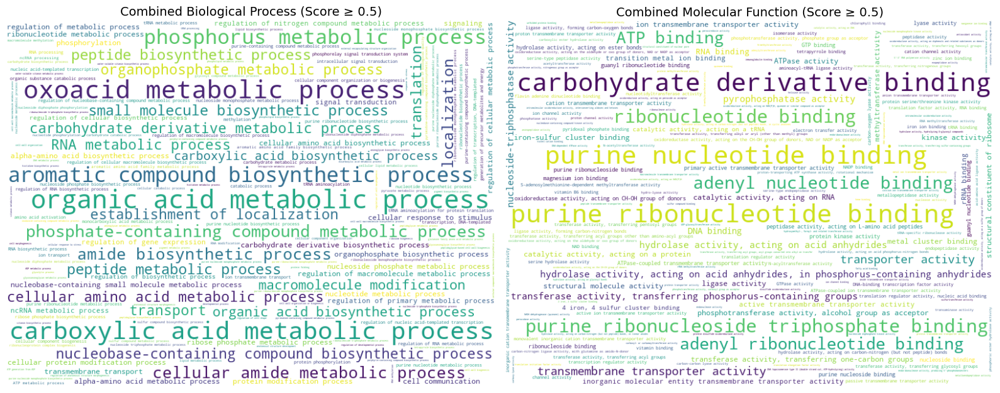

In [20]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Load DeepFRI predictions (skip the comment line at the top)
bp_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv", skiprows=1)
mf_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv", skiprows=1)
bp_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv", skiprows=1)
mf_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv", skiprows=1)

# Filter for high-quality annotations (score ≥ 0.5)
bp_uniprot_hq = bp_uniprot[bp_uniprot['Score'] >= 0.5]
mf_uniprot_hq = mf_uniprot[mf_uniprot['Score'] >= 0.5]
bp_sck_hq = bp_sck[bp_sck['Score'] >= 0.5]
mf_sck_hq = mf_sck[mf_sck['Score'] >= 0.5]

# Combine UniProt and SCK high-quality annotations
bp_combined_hq = pd.concat([bp_uniprot_hq, bp_sck_hq])
mf_combined_hq = pd.concat([mf_uniprot_hq, mf_sck_hq])

# Count GO term names
bp_combined_terms = bp_combined_hq['GO_term/EC_number name'].value_counts().to_dict()
mf_combined_terms = mf_combined_hq['GO_term/EC_number name'].value_counts().to_dict()

# Plot word clouds
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# BP Word Cloud
bp_wc = WordCloud(width=800, height=600, background_color='white').generate_from_frequencies(bp_combined_terms)
axes[0].imshow(bp_wc, interpolation='bilinear')
axes[0].set_title("Combined Biological Process (Score ≥ 0.5)", fontsize=14)
axes[0].axis('off')

# MF Word Cloud
mf_wc = WordCloud(width=800, height=600, background_color='white').generate_from_frequencies(mf_combined_terms)
axes[1].imshow(mf_wc, interpolation='bilinear')
axes[1].set_title("Combined Molecular Function (Score ≥ 0.5)", fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()


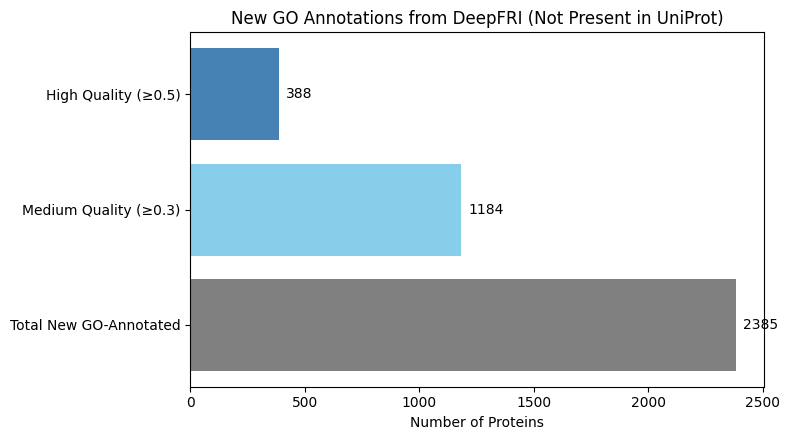

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load Files ===
# UniProt reference file (with GO annotations)
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")

# DeepFRI predictions from lambda cloud (UniProt)
bp_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv", skiprows=1)
mf_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv", skiprows=1)
cc_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv", skiprows=1)

# === Get proteins with native GO annotations in UniProt ===
uniprot_go_proteins = set(uniprot_df[
    (uniprot_df['Gene Ontology (biological process)'].notna()) |
    (uniprot_df['Gene Ontology (molecular function)'].notna()) |
    (uniprot_df['Gene Ontology (cellular component)'].notna())
]['Entry'])

# === Function to get new DeepFRI-annotated proteins not in UniProt ===
def get_new_deepfri_annotations(dfs, threshold):
    combined = pd.concat([df[df['Score'] >= threshold] for df in dfs])
    proteins = set(combined['Protein'])
    return proteins - uniprot_go_proteins

# === Identify new GO-annotated proteins by DeepFRI that are not in UniProt ===

# Get all predicted proteins by DeepFRI (regardless of score)
all_predicted_proteins = pd.concat([bp_uniprot, mf_uniprot, cc_uniprot])
all_deepfri_proteins = set(all_predicted_proteins['Protein'])

# Identify newly annotated proteins not in UniProt's native GO list
new_total = all_deepfri_proteins - uniprot_go_proteins

# Now filter for medium and high quality *within* the new proteins
def get_quality_subset(dfs, threshold, reference_set):
    combined = pd.concat([df[df['Score'] >= threshold] for df in dfs])
    proteins = set(combined['Protein'])
    return proteins.intersection(reference_set)

# Medium- and high-quality subsets among newly annotated proteins
dfs_uniprot = [bp_uniprot, mf_uniprot, cc_uniprot]
new_medium = get_quality_subset(dfs_uniprot, 0.3, new_total)
new_high = get_quality_subset(dfs_uniprot, 0.5, new_total)


# === Prepare data for bar chart ===
new_annotation_counts = {
    "Total New GO-Annotated": len(new_total),
    "Medium Quality (≥0.3)": len(new_medium),
    "High Quality (≥0.5)": len(new_high)
}

# === Plot horizontal bar chart ===
fig, ax = plt.subplots(figsize=(8, 4.5))
bars = ax.barh(list(new_annotation_counts.keys()), list(new_annotation_counts.values()),
               color=["gray", "skyblue", "steelblue"])

# Add text labels to bars
for bar in bars:
    width = bar.get_width()
    ax.annotate(f'{width}',
                xy=(width, bar.get_y() + bar.get_height() / 2),
                xytext=(5, 0),
                textcoords="offset points",
                ha='left', va='center', fontsize=10)

# Chart labels and title
ax.set_title("New GO Annotations from DeepFRI (Not Present in UniProt)")
ax.set_xlabel("Number of Proteins")
plt.tight_layout()
plt.show()


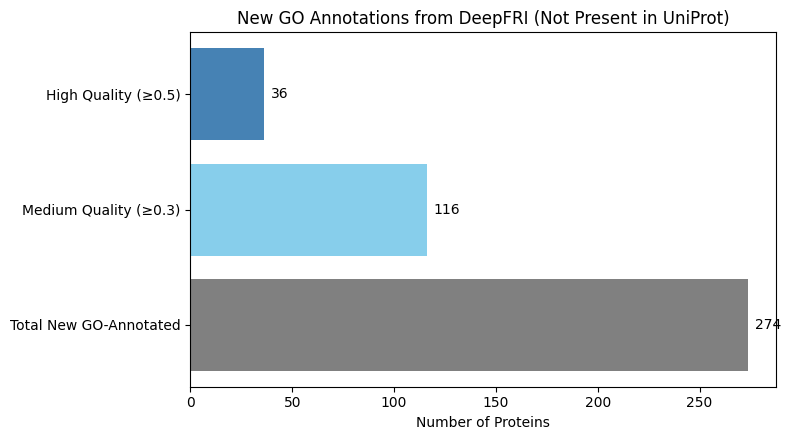

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load Files ===
# UniProt reference file (with GO annotations)
uniprot_df = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv", sep="\t")

# DeepFRI predictions from lambda cloud (UniProt)
bp_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv", skiprows=1)
mf_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv", skiprows=1)
cc_uniprot = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv", skiprows=1)

# === Get proteins with native GO annotations in UniProt ===
uniprot_go_proteins = set(uniprot_df[
    (uniprot_df['Gene Ontology (biological process)'].notna()) |
    (uniprot_df['Gene Ontology (molecular function)'].notna()) |
    (uniprot_df['Gene Ontology (cellular component)'].notna())
]['Entry'])

# === Function to get new DeepFRI-annotated proteins not in UniProt ===
def get_new_deepfri_annotations(dfs, threshold):
    combined = pd.concat([df[df['Score'] >= threshold] for df in dfs])
    proteins = set(combined['Protein'])
    return proteins - uniprot_go_proteins

# === Identify new GO-annotated proteins by DeepFRI that are not in UniProt ===

# Get all predicted proteins by DeepFRI (regardless of score)
all_predicted_proteins = pd.concat([bp_uniprot, mf_uniprot, cc_uniprot])
all_deepfri_proteins = set(all_predicted_proteins['Protein'])

# Identify newly annotated proteins not in UniProt's native GO list
new_total = all_deepfri_proteins - uniprot_go_proteins

# Now filter for medium and high quality *within* the new proteins
def get_quality_subset(dfs, threshold, reference_set):
    combined = pd.concat([df[df['Score'] >= threshold] for df in dfs])
    proteins = set(combined['Protein'])
    return proteins.intersection(reference_set)

# Medium- and high-quality subsets among newly annotated proteins
dfs_uniprot = [bp_uniprot, mf_uniprot, cc_uniprot]
new_medium = get_quality_subset(dfs_uniprot, 0.3, new_total)
new_high = get_quality_subset(dfs_uniprot, 0.5, new_total)


# === Prepare data for bar chart ===
new_annotation_counts = {
    "Total New GO-Annotated": len(new_total),
    "Medium Quality (≥0.3)": len(new_medium),
    "High Quality (≥0.5)": len(new_high)
}

# === Plot horizontal bar chart ===
fig, ax = plt.subplots(figsize=(8, 4.5))
bars = ax.barh(list(new_annotation_counts.keys()), list(new_annotation_counts.values()),
               color=["gray", "skyblue", "steelblue"])

# Add text labels to bars
for bar in bars:
    width = bar.get_width()
    ax.annotate(f'{width}',
                xy=(width, bar.get_y() + bar.get_height() / 2),
                xytext=(5, 0),
                textcoords="offset points",
                ha='left', va='center', fontsize=10)

# Chart labels and title
ax.set_title("New GO Annotations from DeepFRI (Not Present in UniProt)")
ax.set_xlabel("Number of Proteins")
plt.tight_layout()
plt.show()


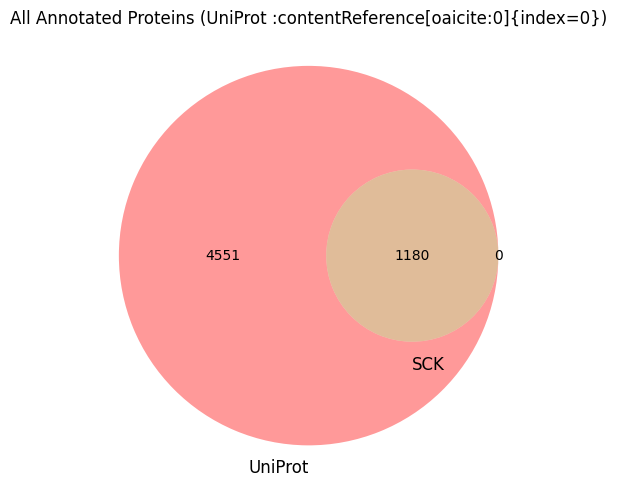

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# === Load all CSV files ===
bp_uni = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv", skiprows=1)
mf_uni = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv", skiprows=1)
cc_uni = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv", skiprows=1)

bp_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv", skiprows=1)
mf_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv", skiprows=1)
cc_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv", skiprows=1)

# === Helper to extract proteins ===
def get_protein_set(df, threshold=None):
    if threshold is not None:
        df = df[df["Score"] >= threshold]
    return set(df["Protein"])

# === Combine annotations ===
def get_combined_proteins(bp, mf, cc, threshold=None):
    return get_protein_set(bp, threshold).union(
        get_protein_set(mf, threshold),
        get_protein_set(cc, threshold)
    )

# === Get unique proteins ===
uni_all = get_combined_proteins(bp_uni, mf_uni, cc_uni)
sck_all = get_combined_proteins(bp_sck, mf_sck, cc_sck)

uni_med = get_combined_proteins(bp_uni, mf_uni, cc_uni, threshold=0.3)
sck_med = get_combined_proteins(bp_sck, mf_sck, cc_sck, threshold=0.3)

uni_high = get_combined_proteins(bp_uni, mf_uni, cc_uni, threshold=0.5)
sck_high = get_combined_proteins(bp_sck, mf_sck, cc_sck, threshold=0.5)

# === Plotting function ===
def plot_venn(set1, set2, title):
    plt.figure(figsize=(5, 5))
    venn2([set1, set2], set_labels=('UniProt', 'SCK'))
    plt.title(title)
    plt.tight_layout()
    plt.show()

# === Create 3 plots ===
plot_venn(uni_all, sck_all, "All Annotated Proteins (UniProt ​:contentReference[oaicite:0]{index=0}​)")


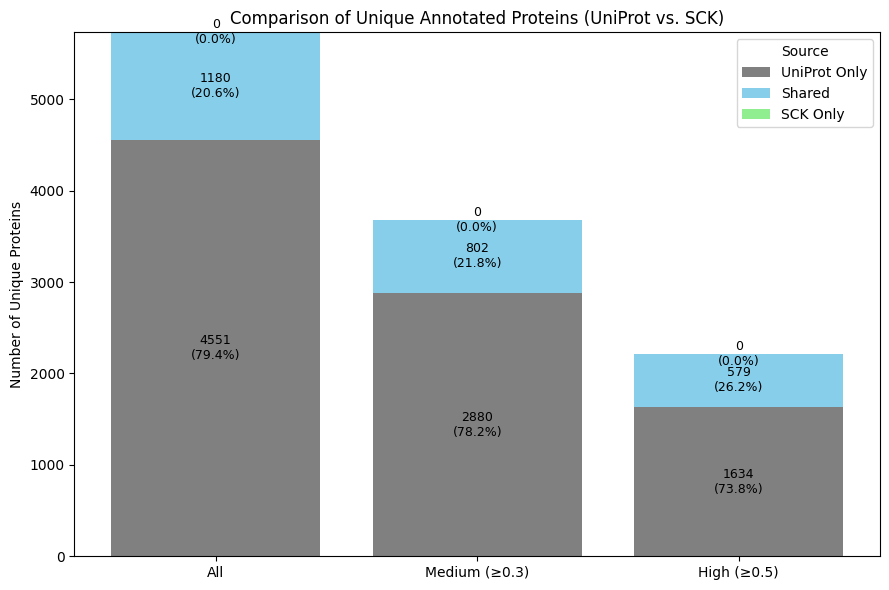

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load your datasets ===
# === Load all CSV files ===
bp_uni = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv", skiprows=1)
mf_uni = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv", skiprows=1)
cc_uni = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv", skiprows=1)

bp_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv", skiprows=1)
mf_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv", skiprows=1)
cc_sck = pd.read_csv("C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv", skiprows=1)
# === Helper functions ===
def get_protein_set(df, threshold=None):
    if threshold is not None:
        df = df[df["Score"] >= threshold]
    return set(df["Protein"])

def get_combined_proteins(bp, mf, cc, threshold=None):
    return get_protein_set(bp, threshold).union(
        get_protein_set(mf, threshold),
        get_protein_set(cc, threshold)
    )

def compute_overlap(set1, set2):
    return [len(set1 - set2), len(set1 & set2), len(set2 - set1)]

# === Compute protein sets ===
uni_all = get_combined_proteins(bp_uni, mf_uni, cc_uni)
sck_all = get_combined_proteins(bp_sck, mf_sck, cc_sck)

uni_med = get_combined_proteins(bp_uni, mf_uni, cc_uni, threshold=0.3)
sck_med = get_combined_proteins(bp_sck, mf_sck, cc_sck, threshold=0.3)

uni_high = get_combined_proteins(bp_uni, mf_uni, cc_uni, threshold=0.5)
sck_high = get_combined_proteins(bp_sck, mf_sck, cc_sck, threshold=0.5)

# === Prepare data ===
labels = ['All', 'Medium (≥0.3)', 'High (≥0.5)']
categories = ['UniProt Only', 'Shared', 'SCK Only']
colors = ['gray', 'skyblue', 'lightgreen']

all_data = compute_overlap(uni_all, sck_all)
med_data = compute_overlap(uni_med, sck_med)
high_data = compute_overlap(uni_high, sck_high)

group_data = [all_data, med_data, high_data]
totals = [sum(g) for g in group_data]
stacked_values = list(zip(*group_data))  # Transpose

# === Plot stacked barplot ===
fig, ax = plt.subplots(figsize=(9, 6))
bottoms = [0] * len(labels)

for i, (cat_label, color) in enumerate(zip(categories, colors)):
    values = stacked_values[i]
    bars = ax.bar(labels, values, bottom=bottoms, label=cat_label, color=color)

    # Annotate bars with value + percentage
    for j, (bar, value) in enumerate(zip(bars, values)):
        total = totals[j]
        percent = (value / total) * 100 if total > 0 else 0
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_y() + bar.get_height() / 2,
                f'{value}\n({percent:.1f}%)',
                ha='center', va='center', fontsize=9)

    bottoms = [sum(x) for x in zip(bottoms, values)]

# === Final formatting ===
ax.set_ylabel('Number of Unique Proteins')
ax.set_title('Comparison of Unique Annotated Proteins (UniProt vs. SCK)')
ax.legend(title='Source')
plt.tight_layout()
plt.show()


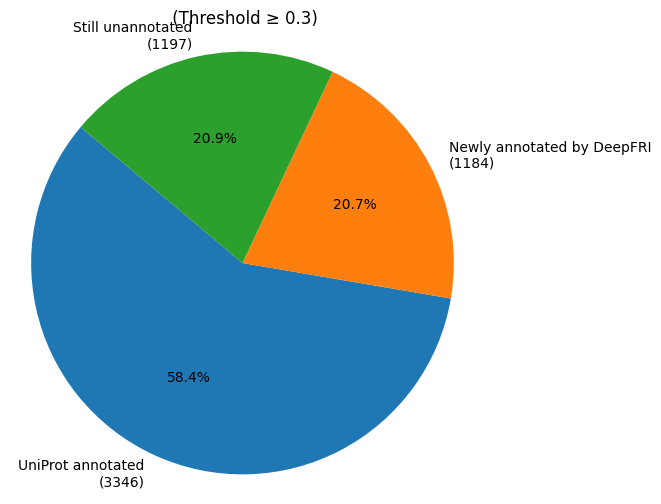

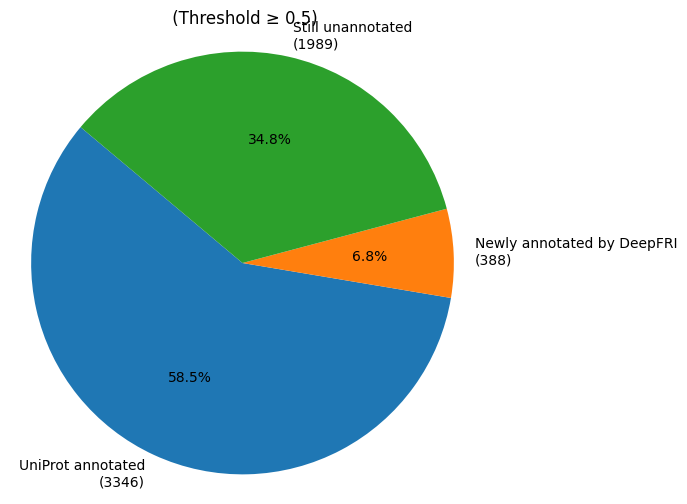

<Figure size 640x480 with 0 Axes>

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load files ===
uniprot_path = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
bp_uni ="C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv"
mf_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv"
cc_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv"


# Load UniProt file
uniprot_df = pd.read_csv(uniprot_path, sep='\t')

# Load DeepFRI predictions (skip comment lines if present)
mf_df = pd.read_csv(mf_uni, comment='#')
bp_df = pd.read_csv(bp_uni, comment='#')
cc_df = pd.read_csv(cc_uni, comment='#')

# Rename columns for consistency
mf_df.columns = bp_df.columns = cc_df.columns = ['protein', 'go_term', 'score', 'go_name']

# Combine DeepFRI predictions from all GO domains
deepfri_all = pd.concat([mf_df, bp_df, cc_df])

# Get proteins annotated in UniProt
uniprot_annotated = uniprot_df[
    (uniprot_df['Gene Ontology (biological process)'].notna()) |
    (uniprot_df['Gene Ontology (cellular component)'].notna()) |
    (uniprot_df['Gene Ontology (molecular function)'].notna())
]['Entry'].unique()

# Function to compute annotation stats at a given threshold
def compute_annotation_stats(threshold):
    deepfri_annotated = deepfri_all[deepfri_all['score'] >= threshold]['protein'].unique()
    newly_annotated = set(deepfri_annotated) - set(uniprot_annotated)
    not_annotated = set(uniprot_df['Entry']) - (set(deepfri_annotated) | set(uniprot_annotated))
    return {
        'UniProt annotated': len(uniprot_annotated),
        'Newly annotated by DeepFRI': len(newly_annotated),
        'Still unannotated': len(not_annotated)
    }

# Generate stats
stats_03 = compute_annotation_stats(0.3)
stats_05 = compute_annotation_stats(0.5)

# Function to plot pie chart
def plot_pie_chart(data_dict, title):
    labels = list(data_dict.keys())
    sizes = list(data_dict.values())
    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=[f"{l}\n({v})" for l, v in zip(labels, sizes)],
            autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.axis('equal')
    plt.show()

# Plot pie charts
plot_pie_chart(stats_03, " (Threshold ≥ 0.3)")
plot_pie_chart(stats_05, " (Threshold ≥ 0.5)")

for ax, stats, title in zip(axes, [stats_03, stats_05],
                            ["Threshold ≥ 0.3", "Threshold ≥ 0.5"]):
    labels = list(stats.keys())
    sizes = list(stats.values())
    ax.pie(sizes, labels=[f"{l}\n({v})" for l, v in zip(labels, sizes)],
           autopct='%1.1f%%', startangle=140)
    ax.set_title(f"Protein Annotation\n{title}")
    ax.axis('equal')

plt.tight_layout()
plt.show()


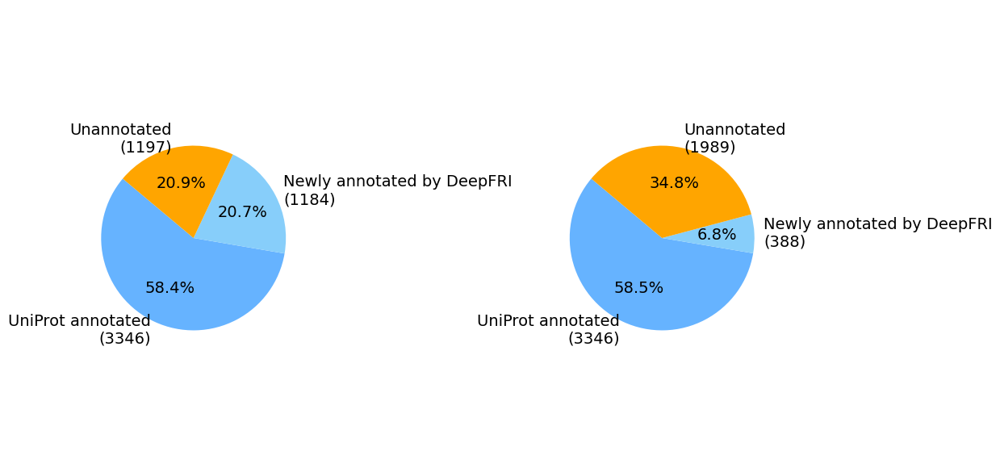

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load files ===
uniprot_path = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
bp_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv"
mf_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv"
cc_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv"

# Load UniProt file
uniprot_df = pd.read_csv(uniprot_path, sep='\t')

# Load DeepFRI predictions
mf_df = pd.read_csv(mf_uni, comment='#')
bp_df = pd.read_csv(bp_uni, comment='#')
cc_df = pd.read_csv(cc_uni, comment='#')

# Rename columns for consistency
mf_df.columns = bp_df.columns = cc_df.columns = ['protein', 'go_term', 'score', 'go_name']
deepfri_all = pd.concat([mf_df, bp_df, cc_df])

# Proteins annotated in UniProt
uniprot_annotated = uniprot_df[
    (uniprot_df['Gene Ontology (biological process)'].notna()) |
    (uniprot_df['Gene Ontology (cellular component)'].notna()) |
    (uniprot_df['Gene Ontology (molecular function)'].notna())
]['Entry'].unique()

# Compute annotation stats
def compute_annotation_stats(threshold):
    deepfri_annotated = deepfri_all[deepfri_all['score'] >= threshold]['protein'].unique()
    newly_annotated = set(deepfri_annotated) - set(uniprot_annotated)
    not_annotated = set(uniprot_df['Entry']) - (set(deepfri_annotated) | set(uniprot_annotated))
    return {
        'UniProt annotated': len(uniprot_annotated),
        'Newly annotated by DeepFRI': len(newly_annotated),
        'Unannotated': len(not_annotated)
    }

# Generate stats
stats_03 = compute_annotation_stats(0.3)
stats_05 = compute_annotation_stats(0.5)
 # Custom color mapping: UniProt blue, DeepFRI light blue, unannotated orange

# Plot both pie charts side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
colors = ['#66b3ff', '#ffcc99', '#ff9999']  # light blue, peach, pink
for ax, stats, title in zip(
    axes,
    [stats_03, stats_05],
    ["Threshold ≥ 0.3", "Threshold ≥ 0.5"]
):
    labels = list(stats.keys())
    sizes = list(stats.values())
    color_map = [  # Match labels to desired colors
        '#66b3ff' if 'UniProt' in l else 
        '#87CEFA' if 'Newly' in l else 
        '#FFA500' for l in labels
    ]
    ax.pie(sizes, labels=[f"{label}\n({value})" for label, value in zip(labels, sizes)],
           autopct='%1.1f%%', startangle=140,textprops={'fontsize': 14},colors=color_map)
    ax.set_title("")
    ax.axis('equal')

plt.tight_layout()
plt.show()


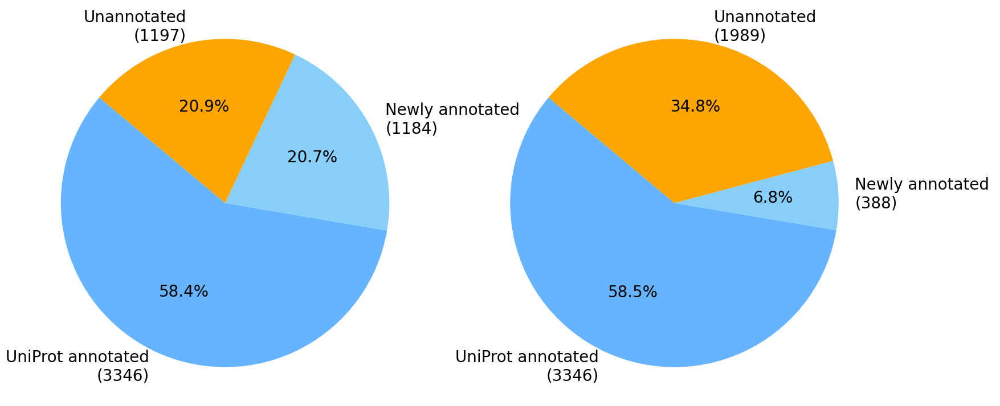

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load files ===
uniprot_path = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
bp_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_BP_predictions_lambda_cloud.csv"
mf_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_MF_predictions_lambda_cloud.csv"
cc_uni = "C:/Users/Gilles/Documents/Master_thesis/DeepFRI_CC_predictions_lambda_cloud.csv"

# Load UniProt file
uniprot_df = pd.read_csv(uniprot_path, sep='\t')

# Load DeepFRI predictions
mf_df = pd.read_csv(mf_uni, comment='#')
bp_df = pd.read_csv(bp_uni, comment='#')
cc_df = pd.read_csv(cc_uni, comment='#')

# Standardize column names
mf_df.columns = bp_df.columns = cc_df.columns = ['protein', 'go_term', 'score', 'go_name']
deepfri_all = pd.concat([mf_df, bp_df, cc_df])

# Get proteins annotated in UniProt
uniprot_annotated = uniprot_df[
    (uniprot_df['Gene Ontology (biological process)'].notna()) |
    (uniprot_df['Gene Ontology (cellular component)'].notna()) |
    (uniprot_df['Gene Ontology (molecular function)'].notna())
]['Entry'].unique()

# Function to compute annotation stats
def compute_annotation_stats(threshold):
    deepfri_annotated = deepfri_all[deepfri_all['score'] >= threshold]['protein'].unique()
    newly_annotated = set(deepfri_annotated) - set(uniprot_annotated)
    not_annotated = set(uniprot_df['Entry']) - (set(deepfri_annotated) | set(uniprot_annotated))
    return {
        'UniProt annotated': len(uniprot_annotated),
        'Newly annotated ': len(newly_annotated),
        'Unannotated': len(not_annotated)
    }

# Compute statistics
stats_03 = compute_annotation_stats(0.3)
stats_05 = compute_annotation_stats(0.5)

# Plot enlarged pie charts
fig, axes = plt.subplots(1, 2, figsize=(18, 9))  # Wider canvas

for ax, stats, title in zip(
    axes,
    [stats_03, stats_05],
    ["Threshold ≥ 0.3", "Threshold ≥ 0.5"]
):
    labels = list(stats.keys())
    sizes = list(stats.values())
    color_map = [
        '#66b3ff' if 'UniProt' in l else 
        '#87CEFA' if 'Newly' in l else 
        '#FFA500' for l in labels
    ]

    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=[f"{label}\n({value})" for label, value in zip(labels, sizes)],
        autopct='%1.1f%%',
        startangle=140,
        textprops={'fontsize': 20},
        colors=color_map
    )
    ax.set_title("", fontsize=20)
    ax.axis('equal')
    ax.set_position([ax.get_position().x0, 0.15, 0.4, 0.75])  # Enlarge circle

plt.subplots_adjust(wspace=0.3)  # Wider gap between pies
plt.show()


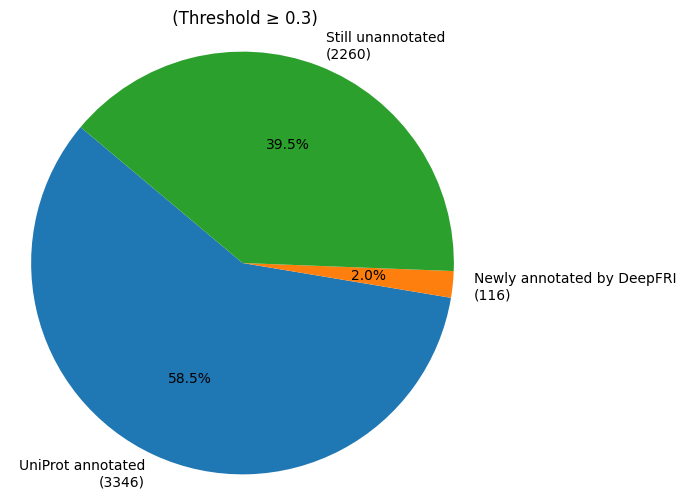

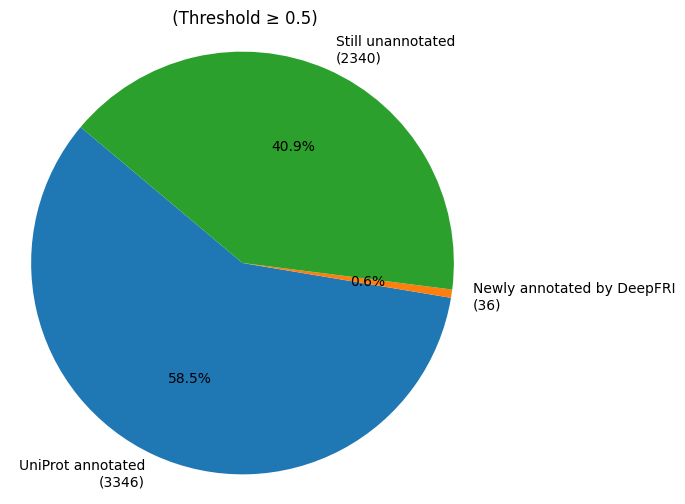

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load files ===
uniprot_path = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
bp_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv"
mf_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv"
cc_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv"


# Load UniProt file
uniprot_df = pd.read_csv(uniprot_path, sep='\t')

# Load DeepFRI predictions (skip comment lines if present)
mf_df = pd.read_csv(mf_sck, comment='#')
bp_df = pd.read_csv(bp_sck, comment='#')
cc_df = pd.read_csv(cc_sck, comment='#')

# Rename columns for consistency
mf_df.columns = bp_df.columns = cc_df.columns = ['protein', 'go_term', 'score', 'go_name']

# Combine DeepFRI predictions from all GO domains
deepfri_all = pd.concat([mf_df, bp_df, cc_df])

# Get proteins annotated in UniProt
uniprot_annotated = uniprot_df[
    (uniprot_df['Gene Ontology (biological process)'].notna()) |
    (uniprot_df['Gene Ontology (cellular component)'].notna()) |
    (uniprot_df['Gene Ontology (molecular function)'].notna())
]['Entry'].unique()

# Function to compute annotation stats at a given threshold
def compute_annotation_stats(threshold):
    deepfri_annotated = deepfri_all[deepfri_all['score'] >= threshold]['protein'].unique()
    newly_annotated = set(deepfri_annotated) - set(uniprot_annotated)
    not_annotated = set(uniprot_df['Entry']) - (set(deepfri_annotated) | set(uniprot_annotated))
    return {
        'UniProt annotated': len(uniprot_annotated),
        'Newly annotated by DeepFRI': len(newly_annotated),
        'Still unannotated': len(not_annotated)
    }

# Generate stats
stats_03 = compute_annotation_stats(0.3)
stats_05 = compute_annotation_stats(0.5)

# Function to plot pie chart
def plot_pie_chart(data_dict, title):
    labels = list(data_dict.keys())
    sizes = list(data_dict.values())
    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=[f"{l}\n({v})" for l, v in zip(labels, sizes)],
            autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.axis('equal')
    plt.show()

# Plot pie charts
plot_pie_chart(stats_03, " (Threshold ≥ 0.3)")
plot_pie_chart(stats_05, " (Threshold ≥ 0.5)")


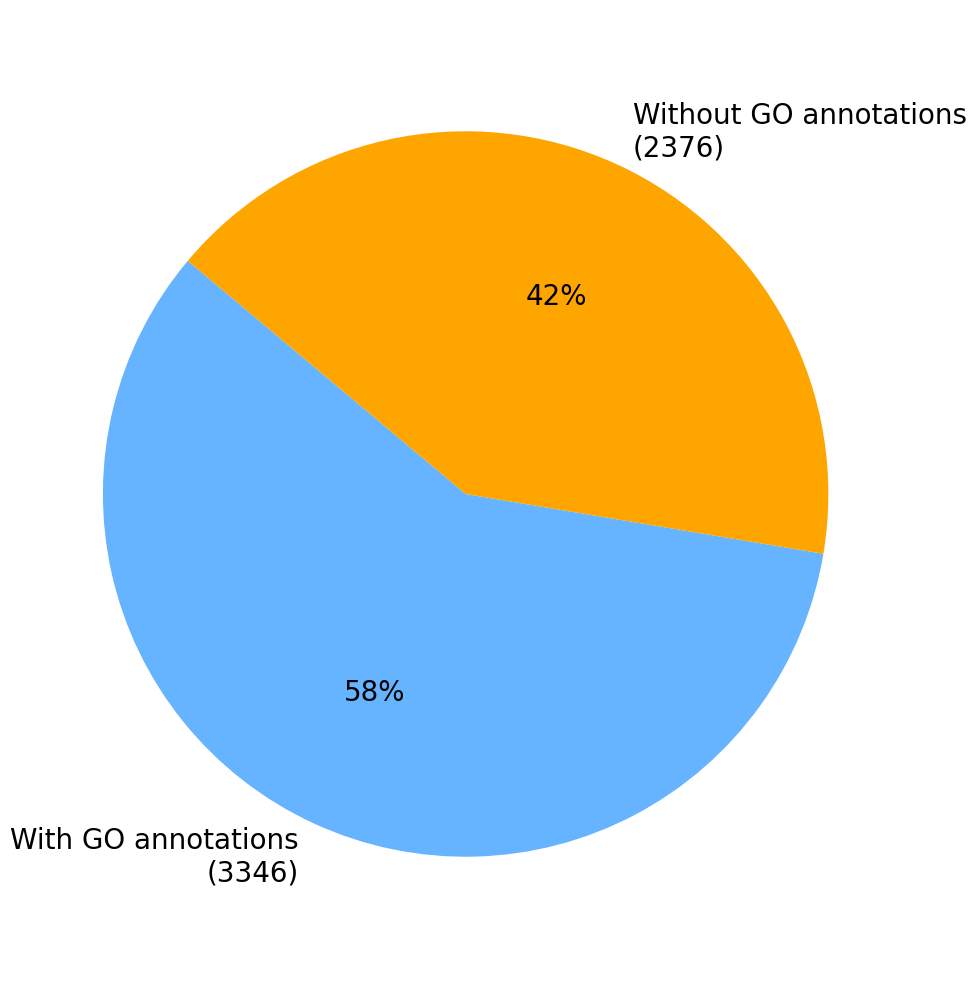

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Load UniProt dataset
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
df = pd.read_csv(uniprot_file, sep='\t')

# Identify proteins with GO annotations
has_annotation = (
    df['Gene Ontology (biological process)'].notna() |
    df['Gene Ontology (cellular component)'].notna() |
    df['Gene Ontology (molecular function)'].notna()
)

# Count proteins
annotated_count = has_annotation.sum()
unannotated_count = len(df) - annotated_count

# Pie data
labels = [f'With GO annotations\n({annotated_count})',
          f'Without GO annotations\n({unannotated_count})']
sizes = [annotated_count, unannotated_count]
colors = ['#66b3ff', '#FFA500']  # Blue and orange

# Plot slide-optimized pie chart
plt.figure(figsize=(10, 10))  # Large and clear on slides
plt.pie(
    sizes,
    labels=labels,
    autopct='%1.0f%%',
    startangle=140,
    colors=colors,
    textprops={'fontsize': 20}  # Bigger font for slide viewing
)
plt.title('', fontsize=22)
plt.axis('equal')
plt.tight_layout()
plt.show()


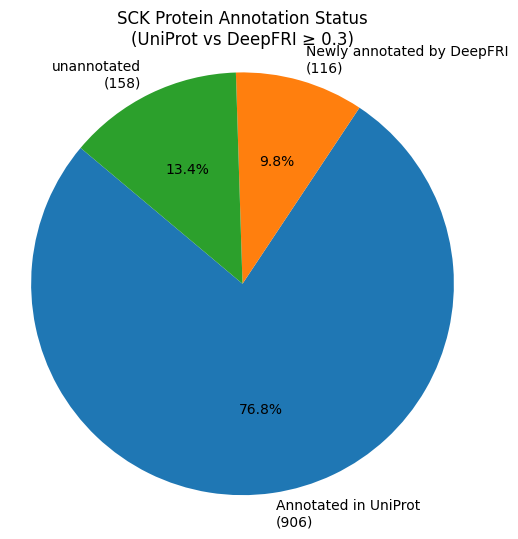

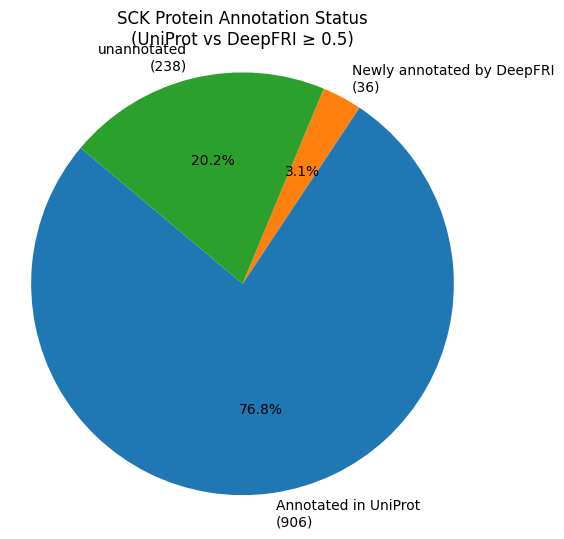

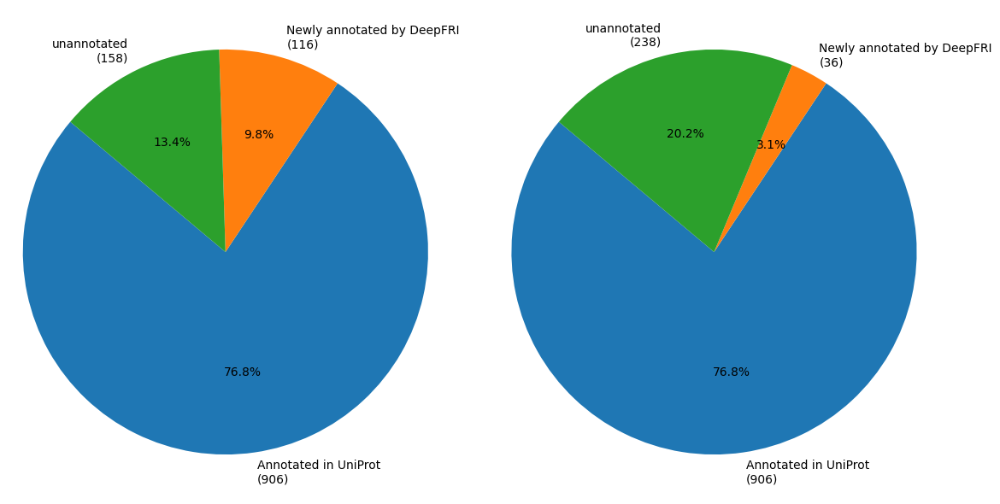

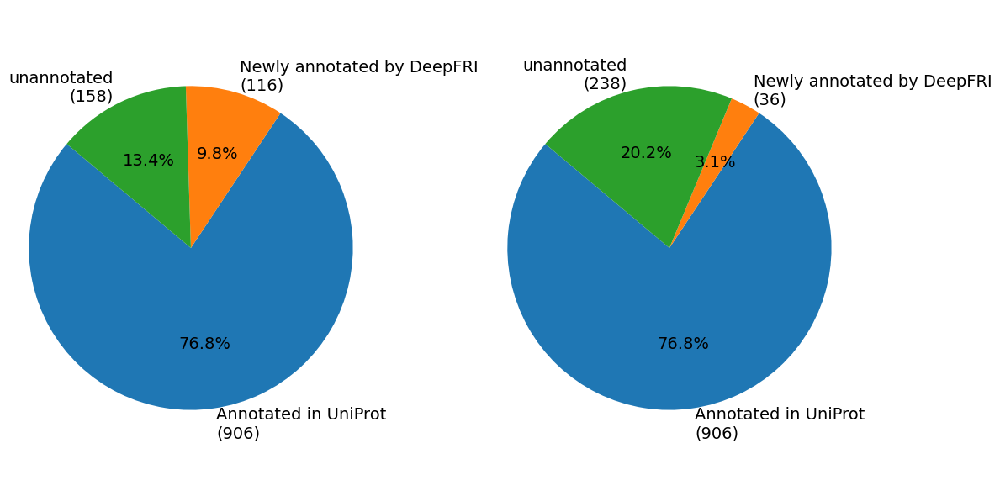

In [21]:

# === Load files ===
uniprot_path = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
bp_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv"
mf_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv"
cc_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv"


# Load UniProt file
uniprot_df = pd.read_csv(uniprot_path, sep='\t')

# Load DeepFRI predictions (skip comment lines if present)
mf_sck = pd.read_csv(mf_sck, comment='#')
bp_sck = pd.read_csv(bp_sck, comment='#')
cc_sck = pd.read_csv(cc_sck, comment='#')
# Standardize column names for DeepFRI files
mf_sck.columns = bp_sck.columns = cc_sck.columns = ['protein', 'go_term', 'score', 'go_name']

# Combine DeepFRI SCK predictions
deepfri_sck_all = pd.concat([mf_sck, bp_sck, cc_sck])

# Get all SCK proteins
sck_proteins = set(deepfri_sck_all['protein'].unique())

# Proteins annotated in UniProt
uniprot_annotated = uniprot_df[
    (uniprot_df['Gene Ontology (biological process)'].notna()) |
    (uniprot_df['Gene Ontology (cellular component)'].notna()) |
    (uniprot_df['Gene Ontology (molecular function)'].notna())
]['Entry'].unique()

sck_annotated_uniprot = sck_proteins.intersection(set(uniprot_annotated))

# Function to compute annotation stats
def compute_sck_annotation_stats(threshold):
    deepfri_annotated = set(deepfri_sck_all[deepfri_sck_all['score'] >= threshold]['protein'])
    newly_annotated = deepfri_annotated - set(uniprot_annotated)
    still_unannotated = sck_proteins - (deepfri_annotated.union(set(uniprot_annotated)))
    return {
        'Annotated in UniProt': len(sck_annotated_uniprot),
        'Newly annotated by DeepFRI': len(newly_annotated),
        'unannotated': len(still_unannotated)
    }

# Plot function
def plot_sck_pie_chart(data_dict, title):
    labels = list(data_dict.keys())
    sizes = list(data_dict.values())
    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=[f"{l}\n({v})" for l, v in zip(labels, sizes)],
            autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.axis('equal')
    plt.show()

# === Generate and plot statistics ===
# Threshold ≥ 0.3
sck_stats_03 = compute_sck_annotation_stats(0.3)
plot_sck_pie_chart(sck_stats_03, "SCK Protein Annotation Status\n(UniProt vs DeepFRI ≥ 0.3)")

# Threshold ≥ 0.5
sck_stats_05 = compute_sck_annotation_stats(0.5)
plot_sck_pie_chart(sck_stats_05, "SCK Protein Annotation Status\n(UniProt vs DeepFRI ≥ 0.5)")
# Plot side-by-side pie charts
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

for ax, stats, title in zip(axes, [sck_stats_03, sck_stats_05],
                            ["Threshold ≥ 0.3", "Threshold ≥ 0.5"]):
    labels = list(stats.keys())
    sizes = list(stats.values())
    ax.pie(sizes, labels=[f"{l}\n({v})" for l, v in zip(labels, sizes)],
           autopct='%1.1f%%', startangle=140)
    ax.set_title("")
    ax.axis('equal')

plt.tight_layout()
plt.show()

# Plot both pie charts side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

for ax, stats, title in zip(
    axes,
    [sck_stats_03, sck_stats_05],
    ["Threshold ≥ 0.3", "Threshold ≥ 0.5"]
):
    labels = list(stats.keys())
    sizes = list(stats.values())
    ax.pie(sizes, labels=[f"{label}\n({value})" for label, value in zip(labels, sizes)],
           autopct='%1.1f%%', startangle=140, textprops={'fontsize': 14})
    ax.set_title("")
    ax.axis('equal')

plt.tight_layout()
plt.show()



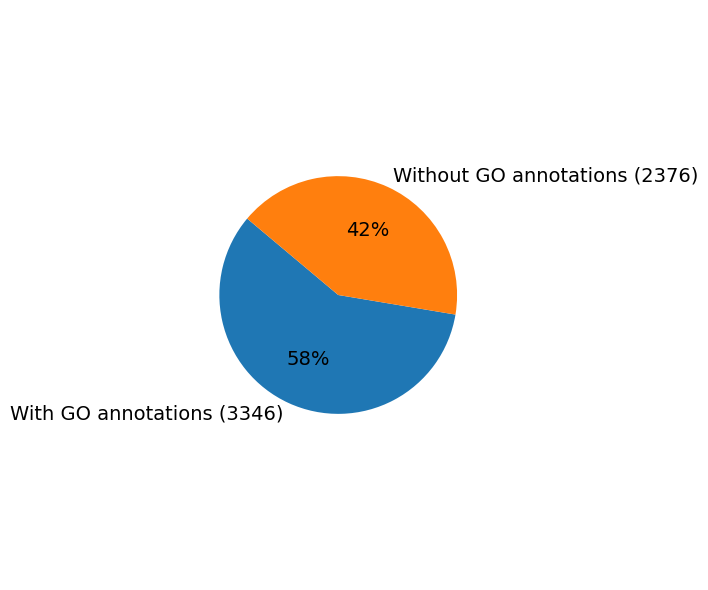

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load UniProt dataset
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
df = pd.read_csv(uniprot_file, sep='\t')

# Check for GO annotations in any of the three columns
has_annotation = (
    df['Gene Ontology (biological process)'].notna() |
    df['Gene Ontology (cellular component)'].notna() |
    df['Gene Ontology (molecular function)'].notna()
)

# Count proteins with and without annotations
annotated_count = has_annotation.sum()
not_annotated_count = len(df) - annotated_count

# Prepare data for pie chart
labels = [f'With GO annotations ({annotated_count})', f'Without GO annotations ({not_annotated_count})']
sizes = [annotated_count, not_annotated_count]

 
    # Custom color mapping: UniProt blue, DeepFRI light blue, unannotated orange
    color_map = [  # Match labels to desired colors
        '#66b3ff' if 'UniProt' in l else 
        '#87CEFA' if 'Newly' in l else 
        '#FFA500' for l in labels
    ]
    

# Plot pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct='%1.0f%%', startangle=140, textprops={'fontsize': 14},
        colors=color_map )
plt.title('')
plt.axis('equal')  # Equal aspect ratio ensures the pie is circular.
plt.tight_layout()
plt.show()


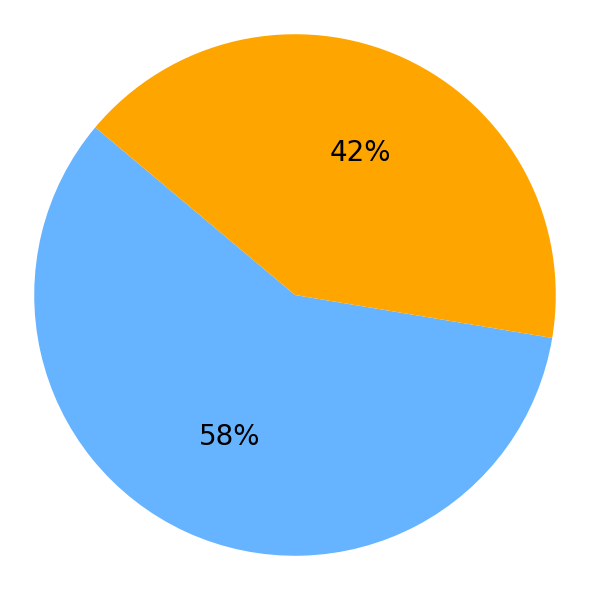

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Load UniProt dataset
uniprot_file = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
df = pd.read_csv(uniprot_file, sep='\t')

# Check for GO annotations in any of the three columns
has_annotation = (
    df['Gene Ontology (biological process)'].notna() |
    df['Gene Ontology (cellular component)'].notna() |
    df['Gene Ontology (molecular function)'].notna()
)

# Count proteins with and without annotations
annotated_count = has_annotation.sum()
not_annotated_count = len(df) - annotated_count

# Prepare data for pie chart
labels = [f'With GO annotations ({annotated_count})', f'Without GO annotations ({not_annotated_count})']
sizes = [annotated_count, not_annotated_count]

# Custom color mapping
color_map = ['#66b3ff', '#FFA500']  # Blue for annotated, Orange for unannotated

# Plot pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, autopct='%1.0f%%', startangle=140, textprops={'fontsize': 20},
        colors=color_map)
plt.title('', fontsize=15)
plt.axis('equal')
plt.tight_layout()
plt.show()


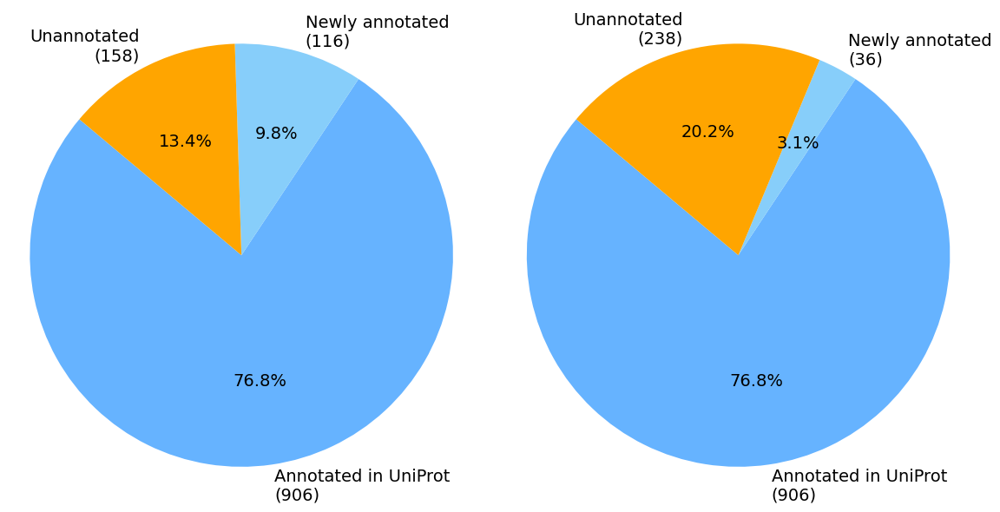

In [45]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load files ===
uniprot_path = "C:/Users/Gilles/Documents/Master_thesis/uniprotkb_limnospira_indica_pcc_8005_2025_05_08.tsv"
bp_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_BP_predictions (1).csv"
mf_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_MF_predictions.csv"
cc_sck = "C:/Users/Gilles/Documents/Master_thesis/lambda_cloud_filtered_proteins_deepFRI/DeepFRI_CC_predictions.csv"

# Load UniProt file
uniprot_df = pd.read_csv(uniprot_path, sep='\t')

# Load DeepFRI predictions
mf_df = pd.read_csv(mf_sck, comment='#')
bp_df = pd.read_csv(bp_sck, comment='#')
cc_df = pd.read_csv(cc_sck, comment='#')

# Standardize column names
mf_df.columns = bp_df.columns = cc_df.columns = ['protein', 'go_term', 'score', 'go_name']

# Combine DeepFRI SCK predictions
deepfri_sck_all = pd.concat([mf_df, bp_df, cc_df])

# Get all unique SCK protein IDs
sck_proteins = set(deepfri_sck_all['protein'].unique())

# Proteins annotated in UniProt
uniprot_annotated = set(
    uniprot_df[
        (uniprot_df['Gene Ontology (biological process)'].notna()) |
        (uniprot_df['Gene Ontology (cellular component)'].notna()) |
        (uniprot_df['Gene Ontology (molecular function)'].notna())
    ]['Entry']
)

sck_annotated_uniprot = sck_proteins.intersection(uniprot_annotated)

# Function to compute annotation stats
def compute_sck_annotation_stats(threshold):
    deepfri_annotated = set(deepfri_sck_all[deepfri_sck_all['score'] >= threshold]['protein'])
    newly_annotated = deepfri_annotated - uniprot_annotated
    still_unannotated = sck_proteins - (deepfri_annotated.union(uniprot_annotated))
    return {
        'Annotated in UniProt': len(sck_annotated_uniprot),
        'Newly annotated': len(newly_annotated),
        'Unannotated': len(still_unannotated)
    }

# === Generate statistics ===
sck_stats_03 = compute_sck_annotation_stats(0.3)
sck_stats_05 = compute_sck_annotation_stats(0.5)

# === Plot side-by-side pie charts ===
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

colors = ['#66b3ff', '#ffcc99', '#ff9999']  # light blue, peach, pink

for ax, stats, title in zip(
    axes,
    [sck_stats_03, sck_stats_05],
    ["SCK Protein Annotation (≥ 0.3)", "SCK Protein Annotation (≥ 0.5)"]
):
    labels = list(stats.keys())
    sizes = list(stats.values())
    
    # Custom color mapping: UniProt blue, DeepFRI light blue, unannotated orange
    color_map = [  # Match labels to desired colors
        '#66b3ff' if 'UniProt' in l else 
        '#87CEFA' if 'Newly' in l else 
        '#FFA500' for l in labels
    ]
    
    ax.pie(
        sizes,
        labels=[f"{label}\n({value})" for label, value in zip(labels, sizes)],
        autopct='%1.1f%%',
        startangle=140,
        textprops={'fontsize': 14},
        colors=color_map
    )
    ax.set_title("")
    ax.axis('equal')

plt.tight_layout()
plt.show()
